<a href="https://colab.research.google.com/github/MauricioViera95/Machine_Learning/blob/main/07MBID_Actividad_1_Viera_Mauricio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>PRÁCTICA 1: APRENDIZAJE NO SUPERVISADO (DengAI)<center>

**Nombre y apellidos:** Mauricio Viera Torres

**Usuario VIU:** rvierat@student.universidadviu.com

---
# Resumen
---

<div style="text-align: justify">
En el contexto del dengue, la aplicación de aprendizaje no supervisado se centra en explorar y descubrir patrones ocultos en los datos ambientales y de incidencia de la enfermedad, sin depender de etiquetas predeterminadas. Mediante técnicas como el clustering, se busca identificar agrupaciones de condiciones climáticas y otros factores ambientales que correlacionen con aumentos en los casos de dengue. Este enfoque permite una mejor comprensión de las dinámicas de transmisión de la enfermedad y facilita la identificación de posibles predictores para futuros brotes, contribuyendo así a esfuerzos de prevención y control más efectivos.
</div>

---
# Inicialización
---

In [ ]:
# Imports generales
import pandas as pd
import numpy as np
import io
from google.colab import files

# Librerías para gráficas
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

seed = 42  # Semilla aleatoria arbitraria y constante a incluir en los algoritmos estocásticos para que los experimentos sean siempre reproducibles por el profesor.

def upload_files (index_fields=None):
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')), index_col = index_fields)
    return df

In [ ]:
# Subir el conjunto de entrenamiento sin variable objetivo (dengue_features_train.csv)
train = upload_files()
print(train.shape)
train.head()

Saving dengue_features_train.csv to dengue_features_train (1).csv
User uploaded file "dengue_features_train (1).csv" with length 287139 bytes
(1456, 24)


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


---
# Exploración
---

## Dimensiones del dataset

En primer lugar, se visualiza la dimensión del dataset.

In [ ]:
train.shape

(1456, 24)

En este caso, se tienen 24 atributos y una cantidad de 1456 observaciones de dichas características.


## Tipo de datos de los atributos del dataset


Acto seguido, se obtienen los tipos de datos de cada uno de los atributos

In [ ]:
# Tipo de datos de los atributos del dataset
train.dtypes

city                                      object
year                                       int64
weekofyear                                 int64
week_start_date                           object
ndvi_ne                                  float64
ndvi_nw                                  float64
ndvi_se                                  float64
ndvi_sw                                  float64
precipitation_amt_mm                     float64
reanalysis_air_temp_k                    float64
reanalysis_avg_temp_k                    float64
reanalysis_dew_point_temp_k              float64
reanalysis_max_air_temp_k                float64
reanalysis_min_air_temp_k                float64
reanalysis_precip_amt_kg_per_m2          float64
reanalysis_relative_humidity_percent     float64
reanalysis_sat_precip_amt_mm             float64
reanalysis_specific_humidity_g_per_kg    float64
reanalysis_tdtr_k                        float64
station_avg_temp_c                       float64
station_diur_temp_rn

*   Como se puede apreciar, el dataset posee dos atributos del tipo object, que consisten en características que representan datos que se almacenan como cadenas de texto. Este tipo de datos, podrían convertirse en variables categóricas.

*   Luego, se tienen dos atributos del tipo entero, que consisten en la semana del respectivo año y, por otro lado, la semana del año.

*   Para finalizar, se tienen 20 atributos del tipo flotante, que consisten en variables numéricas continuas.

## Análisis estadistico básico

Tras la primera visualización de los datos, ahora se obtiene un breve análisis estadístico básico, que consiste en obtener estadísticas básicas como la media, desviacíon estándar, cuartiles, mínimos y máximos.

In [ ]:
# Análisis estadístico básico
print(train.describe())

              year   weekofyear      ndvi_ne      ndvi_nw      ndvi_se  \
count  1456.000000  1456.000000  1262.000000  1404.000000  1434.000000   
mean   2001.031593    26.503434     0.142294     0.130553     0.203783   
std       5.408314    15.019437     0.140531     0.119999     0.073860   
min    1990.000000     1.000000    -0.406250    -0.456100    -0.015533   
25%    1997.000000    13.750000     0.044950     0.049217     0.155087   
50%    2002.000000    26.500000     0.128817     0.121429     0.196050   
75%    2005.000000    39.250000     0.248483     0.216600     0.248846   
max    2010.000000    53.000000     0.508357     0.454429     0.538314   

           ndvi_sw  precipitation_amt_mm  reanalysis_air_temp_k  \
count  1434.000000           1443.000000            1446.000000   
mean      0.202305             45.760388             298.701852   
std       0.083903             43.715537               1.362420   
min      -0.063457              0.000000             294.635714  

A partir de las estadísticas obtenidas se puede descatar lo siguiente:

**Variables de Tiempo**

*   year: Los datos cubren un período desde 1990 hasta 2010.
*   weekofyear: Las observaciones están distribuidas a lo largo de todas las semanas del año, desde la 1 hasta la 53, lo que sugiere un seguimiento semanal continuo.

**Índices de Vegetación Normalizada (NDVI)**

*   ndvi_ne, ndvi_nw, ndvi_se, ndvi_sw: Los valores de NDVI varían entre -0.4561 y 0.546017, lo que indica una amplia gama de coberturas vegetales desde áreas posiblemente desnudas o con vegetación escasa hasta áreas muy densas.
*   La media cercana a 0.14 para ndvi_ne y ndvi_nw, y cercana a 0.2 para ndvi_se y ndvi_sw, sugiere una cobertura vegetal moderada en promedio.
*   La presencia de valores negativos indica áreas con poca o ninguna vegetación.

**Precipitación**

*   Precipitation_amt_mm, reanalysis_sat_precip_amt_mm: Ambas variables muestran una cantidad significativa de variabilidad en las precipitaciones, con valores máximos de 390.6 mm.
*   La media y la mediana indican la presencia de semanas con poca lluvia y otras con eventos de lluvia más intensos.

**Temperatura**

*   reanalysis_air_temp_k, reanalysis_avg_temp_k, reanalysis_dew_point_temp_k, reanalysis_max_air_temp_k, reanalysis_min_air_temp_k, station_avg_temp_c, station_max_temp_c, station_min_temp_c: Estas variables ofrecen un vistazo a las condiciones de temperatura, muestran variaciones esperadas entre la temperatura máxima, mínima y promedio.
*   Los valores mínimos y máximos indican la presencia de una gama amplia de condiciones climáticas, desde días frescos hasta muy calurosos.

**Humedad**

*   reanalysis_relative_humidity_percent, reanalysis_specific_humidity_g_per_kg: Los datos muestran un rango amplio en la humedad relativa y específica, lo que sugiere variabilidad en las condiciones de humedad a lo largo del tiempo y posiblemente entre ubicaciones.

**Otros**

*   reanalysis_precip_amt_kg_per_m2, reanalysis_tdtr_k, station_diur_temp_rng_c, station_precip_mm: Estas variables complementan el cuadro de las condiciones climáticas, con reanalysis_tdtr_k y station_diur_temp_rng_c ofreciendo una visión sobre la variabilidad de la temperatura diurna, y reanalysis_precip_amt_kg_per_m2 y station_precip_mm aportando más detalles sobre la precipitación.




## Visualizacion del contenido de las variables de tipo object y tipo int

### Variable City

In [ ]:
city = train['city'].unique().tolist()
city.sort()
print("La variable City tiene:", city, "como categorías")

La variable City tiene: ['iq', 'sj'] como categorías


Como se puede apreciar, esta variable posee dos categorías que consisten en las abreviaturas de las ciudades, sj for San Juan and iq for Iquitos.

### Variable week_start_date

In [ ]:
week= train['week_start_date'].unique().tolist()
week.sort()
print("La variable City tiene:", week, "como categorías")

La variable City tiene: ['1990-04-30', '1990-05-07', '1990-05-14', '1990-05-21', '1990-05-28', '1990-06-04', '1990-06-11', '1990-06-18', '1990-06-25', '1990-07-02', '1990-07-09', '1990-07-16', '1990-07-23', '1990-07-30', '1990-08-06', '1990-08-13', '1990-08-20', '1990-08-27', '1990-09-03', '1990-09-10', '1990-09-17', '1990-09-24', '1990-10-01', '1990-10-08', '1990-10-15', '1990-10-22', '1990-10-29', '1990-11-05', '1990-11-12', '1990-11-19', '1990-11-26', '1990-12-03', '1990-12-10', '1990-12-17', '1990-12-24', '1991-01-01', '1991-01-08', '1991-01-15', '1991-01-22', '1991-01-29', '1991-02-05', '1991-02-12', '1991-02-19', '1991-02-26', '1991-03-05', '1991-03-12', '1991-03-19', '1991-03-26', '1991-04-02', '1991-04-09', '1991-04-16', '1991-04-23', '1991-04-30', '1991-05-07', '1991-05-14', '1991-05-21', '1991-05-28', '1991-06-04', '1991-06-11', '1991-06-18', '1991-06-25', '1991-07-02', '1991-07-09', '1991-07-16', '1991-07-23', '1991-07-30', '1991-08-06', '1991-08-13', '1991-08-20', '1991-08-

Como se puede apreciar esta variable debería ser convertida a un tipo datetime, si se amerita su uso.

In [ ]:
# Convertir la variable a date time
train['week_start_date'] = pd.to_datetime(train['week_start_date'])

### Variable year

In [ ]:
year= train['year'].unique().tolist()
year.sort()
print("La variable year tiene:", year, "como categorías")

La variable year tiene: [1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010] como categorías


### Variable weekofyear

In [ ]:
w= train['weekofyear'].unique().tolist()
w.sort()
print("La variable year tiene:", w, "como categorías")

La variable year tiene: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53] como categorías


## Análisis Univariante (Previo a la limpieza de datos)

<ipython-input-11-2e552a99ab06>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='city', data=train, palette='viridis')


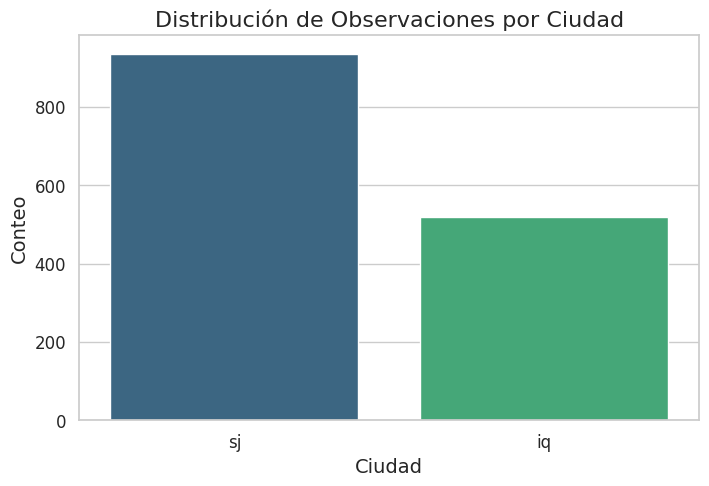

In [ ]:
# Gráfico de barras para la variable 'city'

# Establecer un estilo de fondo más estético
sns.set(style="whitegrid")

# Crear una figura y definir su tamaño
plt.figure(figsize=(8,5))

# Gráfico de barras con una paleta de colores más vistosa
sns.countplot(x='city', data=train, palette='viridis')

# Títulos y etiquetas con un tamaño de fuente mayor para mayor claridad
plt.xlabel('Ciudad', fontsize=14)
plt.ylabel('Conteo', fontsize=14)
plt.title('Distribución de Observaciones por Ciudad', fontsize=16)

# Cambiar las etiquetas de los ticks para que sean más legibles
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Mostrar el gráfico
plt.show()


El gráfico muestra un claro desbalance en el número de observaciones entre las dos ciudades presentes en el dataset: San Juan ("sj") e Iquitos ("iq"). Este desbalanceo se refleja en la altura de las barras: la barra correspondiente a San Juan es significativamente más alta que la de Iquitos, lo que indica una mayor cantidad de datos recolectados para San Juan.

Se debe tener en cuenta que:

*   Los modelos de machine learning pueden verse afectados por un desbalanceo en los datos, ya que tienden a favorecer la clase o categoría con más observaciones.
*   En el contexto de una enfermedad como el dengue, si los datos se van a utilizar para predecir la incidencia o brotes, es posible que el modelo sea más preciso para San Juan simplemente porque tiene más datos de los cuales aprender.



Como se tienen variables relacionadas con el tiempo, se pueden obtener gráficos de series temporales, como el que se muestra a continuación.

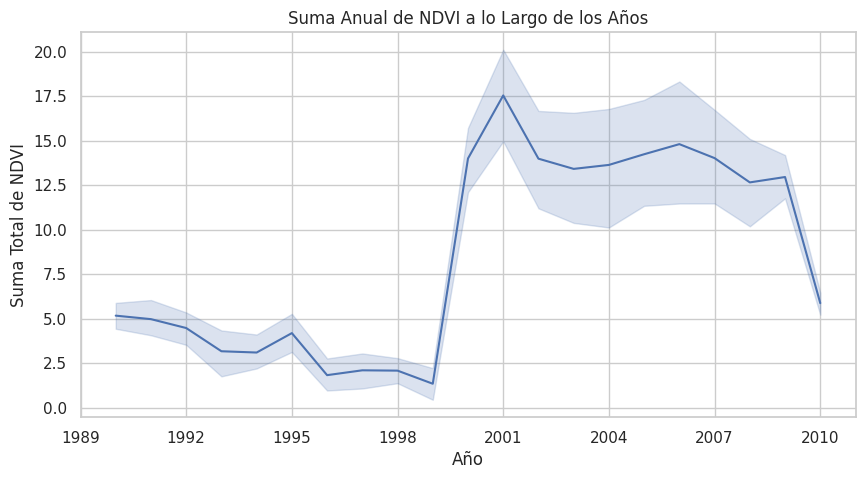

In [ ]:
from matplotlib.ticker import MaxNLocator

plt.figure(figsize=(10, 5))
sns.lineplot(data=train, x='year', y='ndvi_ne', estimator='sum')
# Configuración para que el eje x tenga intervalos enteros
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))

plt.title('Suma Anual de NDVI a lo Largo de los Años')
plt.xlabel('Año')
plt.ylabel('Suma Total de NDVI')
plt.show()

Pero como no es el caso de este estudio, se procede a visualizar la frecuencia de los datos según los años y las semanas de los años.

<ipython-input-13-4366ce2955cc>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=train, x='year', palette='viridis')


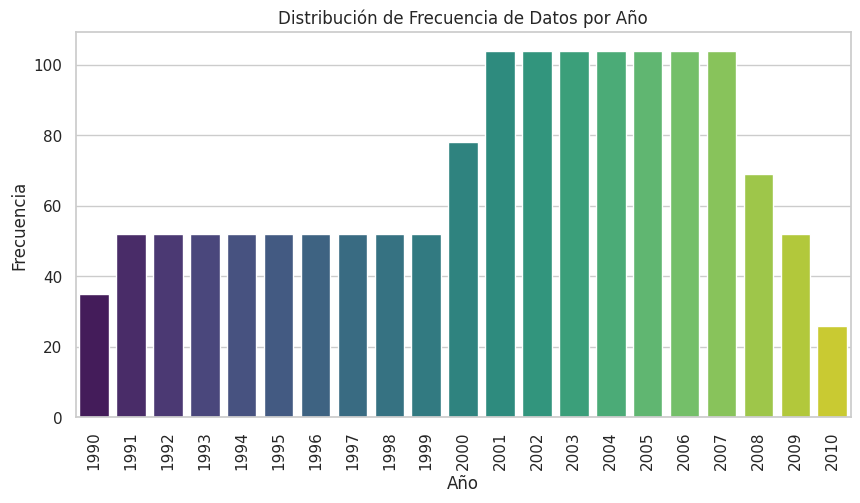

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(data=train, x='year', palette='viridis')
plt.title('Distribución de Frecuencia de Datos por Año')
plt.xlabel('Año')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x para mejor lectura
plt.show()

La frecuencia de los datos aumenta significativamente a partir de 1998, donde las barras se vuelven más altas. Esto sugiere un aumento en la cantidad de datos recopilados o disponibles a partir de ese año.

Entre 1998 y 2006, las barras son consistentemente altas, lo que indica que durante este periodo se mantuvo un alto nivel de recolección de datos.

Hay una disminución notable en la frecuencia de datos a partir de 2007, y esta tendencia decreciente continúa hasta 2010. Esto podría indicar una reducción en el número de observaciones o registros disponibles en esos años.

<ipython-input-14-1e5f62a569d0>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=train, x='weekofyear', palette='viridis')


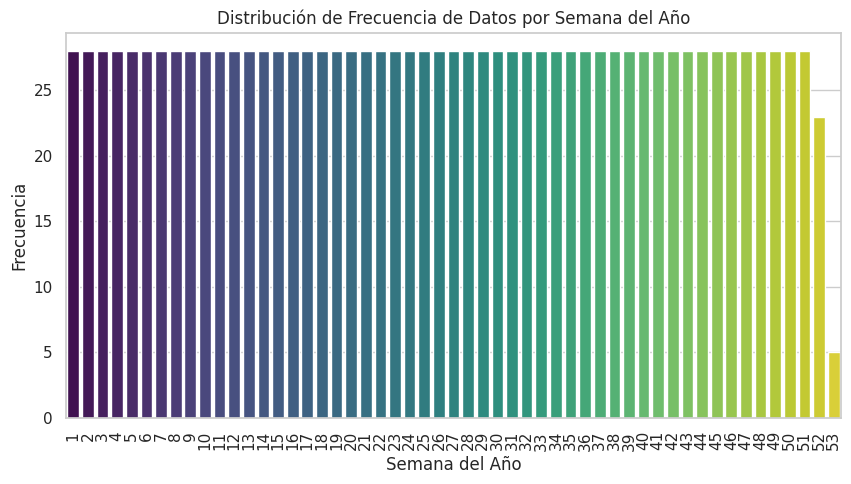

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(data=train, x='weekofyear', palette='viridis')
plt.title('Distribución de Frecuencia de Datos por Semana del Año')
plt.xlabel('Semana del Año')
plt.ylabel('Frecuencia')
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x para mejor lectura
plt.show()

Las barras parecen tener la misma altura desde la semana 1 hasta aproximadamente la semana 48, lo que sugiere que la cantidad de datos recopilados por semana es consistente y completa a lo largo de estos períodos.

La frecuencia es uniforme para la mayoría del año, indicando que hay una cantidad constante de datos disponibles por semana durante estos periodos.

Hay un cambio en el color de las barras a partir de la semana 49 aproximadamente, pasando de tonos de verde a amarillo. Esto coincide con una disminución significativa en la frecuencia de datos en las últimas semanas del año. Las barras amarillas son más cortas, lo que indica menos registros o datos recopilados en este periodo de tiempo.

### Análisis de la distribución de los datos de NDVI

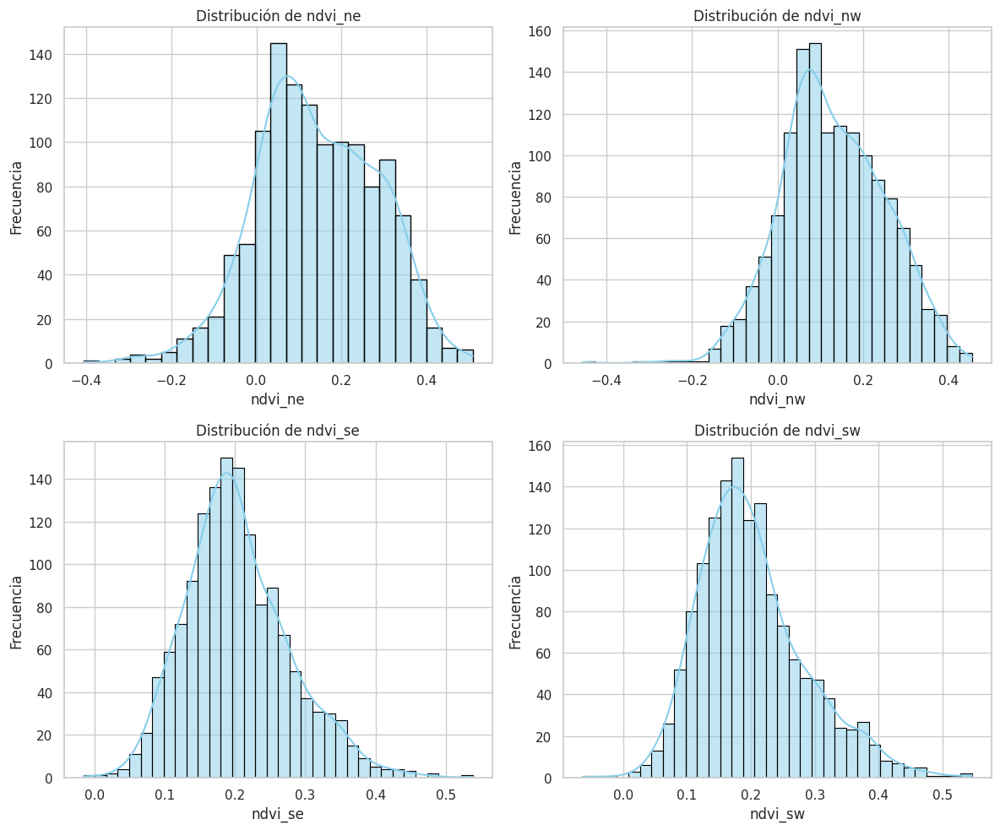

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de variables NDVI
variables_ndvi = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw']

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables NDVI y crear un gráfico para cada una
for ax, var in zip(axes, variables_ndvi):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

Tras analizar la distribución del NDVI, se puede mencionar que:


*   ndvi_ne: La distribución parece tener una ligera asimetría hacia la izquierda (skewness negativo), con una cola más larga hacia los valores menores de NDVI. Esto podría sugerir la presencia de áreas con menos vegetación en la dirección noreste. La mayoría de las observaciones están agrupadas alrededor de un rango más pequeño de valores positivos, lo que indica una vegetación de moderada a densa en esa dirección.
*   ndvi_nw: La distribución es similar a la de ndvi_ne con una asimetría a la izquierda, aunque parece un poco más simétrica y centrada alrededor de un valor medio positivo, lo que indica una cobertura vegetal más consistente en el cuadrante noroeste.
*   ndvi_se: La distribución es más simétrica que las dos primeras, con la mayoría de las observaciones concentradas en valores positivos más altos. Esto sugiere que hay una cobertura vegetal más densa y uniforme en el cuadrante sureste.
*   ndvi_sw: La distribución es similar a la de ndvi_se, con una simetría notable y una concentración de valores en el lado positivo más alto. Esto sugiere una cobertura vegetal densa en la dirección suroeste, similar a la dirección sureste.

### Análisis de la distribución de las variables climáticas de NOAA

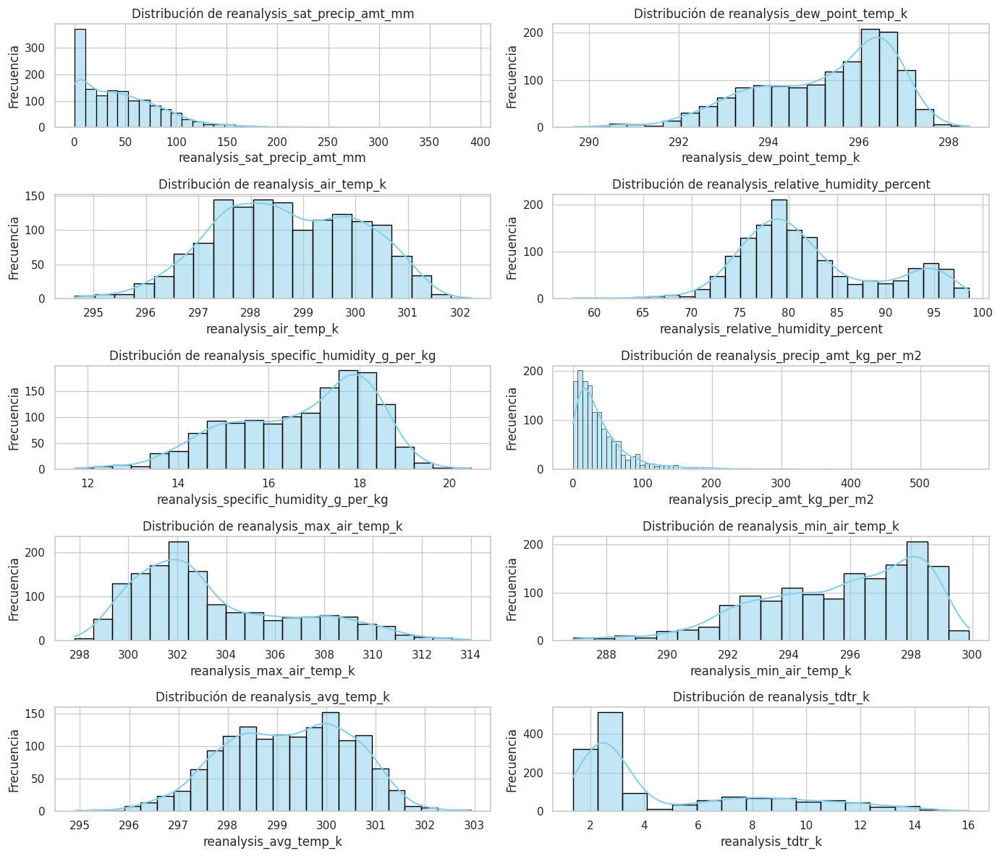

In [ ]:
# Lista de variables de reanálisis
variables_reanalysis = [
    'reanalysis_sat_precip_amt_mm',
    'reanalysis_dew_point_temp_k',
    'reanalysis_air_temp_k',
    'reanalysis_relative_humidity_percent',
    'reanalysis_specific_humidity_g_per_kg',
    'reanalysis_precip_amt_kg_per_m2',
    'reanalysis_max_air_temp_k',
    'reanalysis_min_air_temp_k',
    'reanalysis_avg_temp_k',
    'reanalysis_tdtr_k'
]

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(5, 2, figsize=(14, 12))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables reanalysis y crear un gráfico para cada una
for ax, var in zip(axes, variables_reanalysis):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

Tras visualizar la distribución de las variables climáticas, se puede decir que:

*   reanalysis_sat_precip_amt_mm (Precipitación total): Esta distribución muestra un pico prominente en valores bajos con una cola larga hacia valores más altos, lo que indica que hay muchos periodos con poca o ninguna precipitación y unos pocos eventos con precipitación muy alta.
*   reanalysis_dew_point_temp_k (Temperatura media del punto de rocío): La distribución parece normal y centrada alrededor de un valor específico, indicando una consistencia en la temperatura del punto de rocío a lo largo del tiempo.
*   reanalysis_air_temp_k (Temperatura media del aire): Similar a la temperatura del punto de rocío, la temperatura del aire tiene una distribución que parece normal, indicando temperaturas promedio del aire consistentes.
*   reanalysis_relative_humidity_percent (Humedad relativa media): La distribución es relativamente simétrica con un pico central, sugiriendo un rango de humedad que varía menos en comparación con otras variables como la precipitación.
*   reanalysis_specific_humidity_g_per_kg (Humedad específica media): La distribución se asemeja a una normal y está centrada alrededor de un valor medio, mostrando un comportamiento similar a la temperatura del punto de rocío y la temperatura del aire.
*   reanalysis_precip_amt_kg_per_m2 (Precipitación total): Tiene una distribución con un pico en el extremo inferior y una cola larga hacia valores más altos, muy similar a la distribución de la precipitación satelital.
*   reanalysis_max_air_temp_k (Temperatura máxima del aire): Esta variable muestra una distribución unimodal con cierta asimetría hacia la izquierda, indicando días más a menudo calurosos pero con variabilidad en las temperaturas máximas.
*  reanalysis_min_air_temp_k (Temperatura mínima del aire): La distribución parece ser normal, centrada en un rango específico de temperaturas mínimas.
*   reanalysis_avg_temp_k (Temperatura media del aire): Presenta una distribución normal, lo que es de esperar, ya que es un promedio de temperaturas.
*   reanalysis_tdtr_k (Rango de temperatura diurna): Esta variable tiene una distribución que es bastante asimétrica con una cola hacia la derecha, lo que sugiere que hay variabilidad en el rango de temperatura diurna pero con una tendencia a días con rangos más pequeños.

### Análisis de la distribución de la variable de precipitación


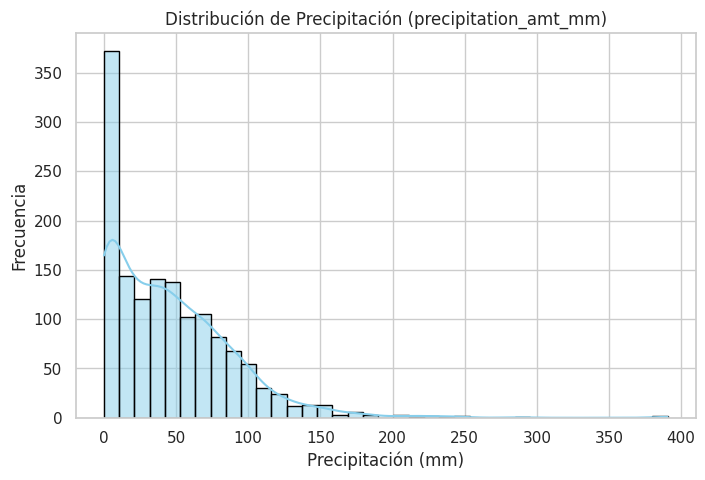

In [ ]:
# Configurando el tamaño de la figura para el gráfico
plt.figure(figsize=(8, 5))

# Creación del histograma con la línea de densidad
sns.histplot(train['precipitation_amt_mm'], kde=True, color='skyblue', edgecolor='black')

# Añadiendo títulos y etiquetas
plt.title('Distribución de Precipitación (precipitation_amt_mm)')
plt.xlabel('Precipitación (mm)')
plt.ylabel('Frecuencia')

# Mostrar el gráfico
plt.show()

Se puede apreciar que, la precipitación posee una asimetría positiva, es decir, la distribución de la precipitación está claramente sesgada hacia la derecha, con la mayoría de las observaciones concentradas cerca del valor cero y una cola larga que se extiende hacia valores mayores de precipitación. Esto es típico de los datos de precipitación, donde muchos periodos tienen poca o ninguna lluvia y unos pocos periodos tienen lluvias muy intensas.

### Análisis de la distribución de las variables de datos climáticos diarios

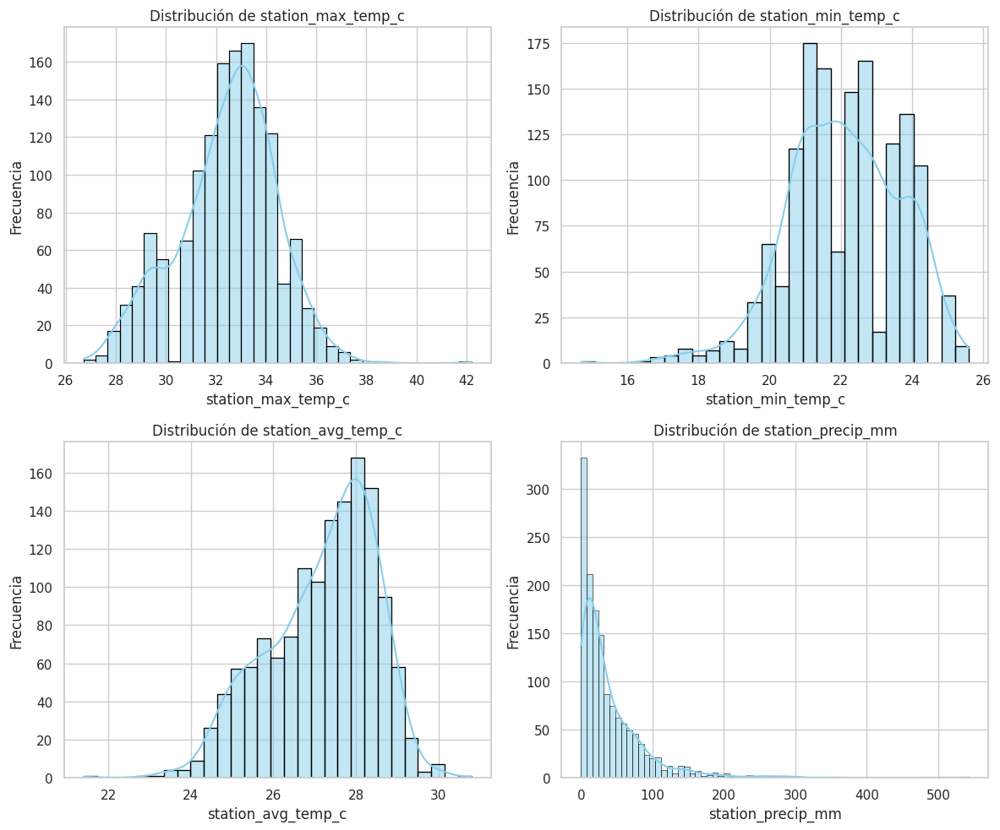

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de variables NDVI
variables_daily = ['station_max_temp_c', 'station_min_temp_c', 'station_avg_temp_c', 'station_precip_mm', 'station_diur_temp_rng_c']

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables daily y crear un gráfico para cada una
for ax, var in zip(axes, variables_daily):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

Tras obtener las distribuciones se puede concluir que:

* station_max_temp_c (Temperatura máxima): La distribución de la temperatura máxima parece aproximadamente normal, centrada en torno a los 30-32 grados Celsius. Hay una cola ligeramente más larga hacia las temperaturas más altas, lo que indica que hay días con temperaturas excepcionalmente altas, aunque no son muy comunes.
* station_min_temp_c (Temperatura mínima): La distribución de la temperatura mínima también parece ser normal, con un rango más estrecho centrado alrededor de los 22 grados Celsius. Esto sugiere que la variabilidad de la temperatura mínima es menor que la de la temperatura máxima.
* station_avg_temp_c (Temperatura promedio): La distribución de la temperatura promedio es igualmente normal y está centrada entre las temperaturas máxima y mínima, como se esperaría. Esta simetría indica una consistencia en la temperatura promedio a lo largo del tiempo.
* station_precip_mm (Precipitación total): La distribución de la precipitación total muestra un sesgo positivo, con la mayoría de los datos agrupados cerca de cero y una cola larga hacia valores más altos. Esto indica que hay muchos días con poca o ninguna precipitación y unos pocos eventos con cantidades significativas de lluvia.

## Análisis Bivariante (Previo a la limpieza de datos)

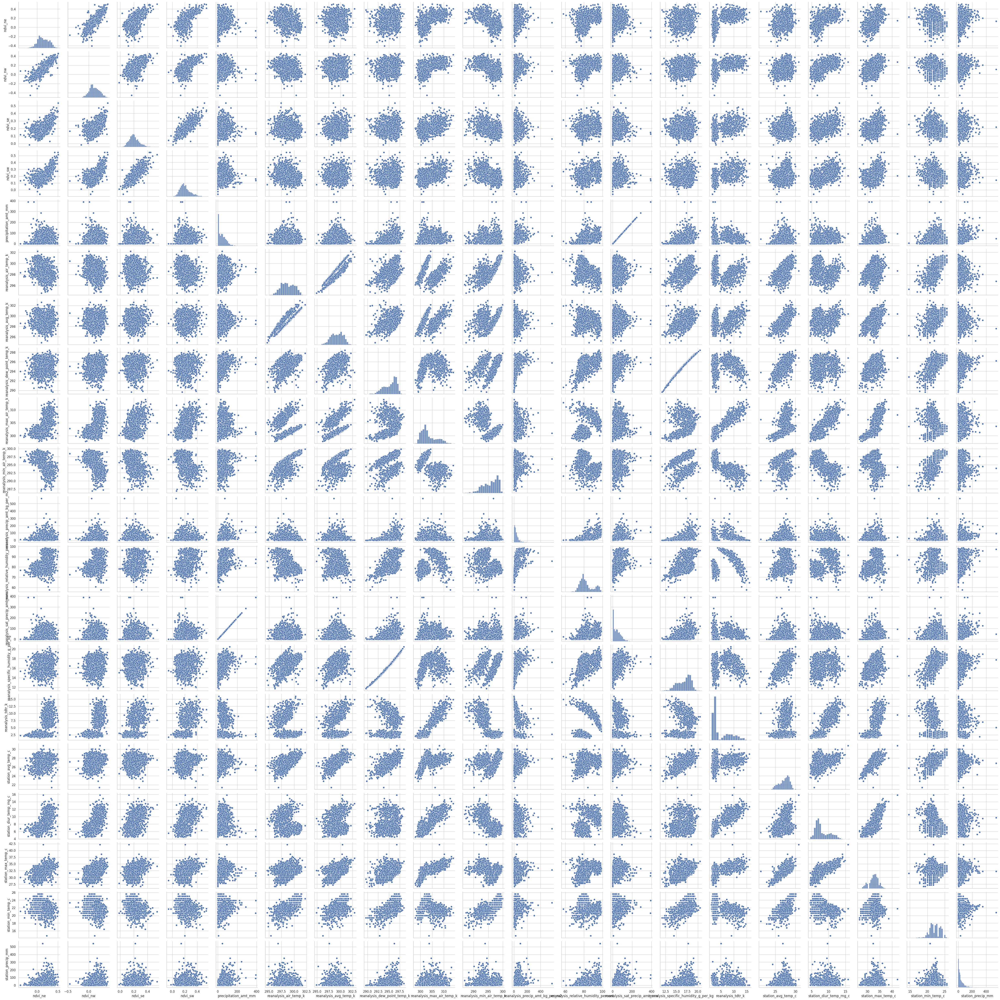

In [ ]:
sns.pairplot(train.iloc[:,4:])

El anális bivariante permite apreciar ciertas correlaciones entre las variables, pero para un mejor manejo y visualización, se propone utilizar más adelante una matriz de correlación.

## Tratamiento de valores nulos

Para realizar un análisis de valores nulos de manera más individualizada se propone utilizar la librería missigno. Esto permitirá visualizar los patrones de valores nulos. Puede ayudar a identificar si los valores nulos están distribuidos aleatoriamente o si hay alguna tendencia o patrón, como nulos que ocurren en bloques de tiempo.

In [ ]:
!pip install missingno

In [ ]:
# Se realiza una copia del train para realizar este análisis
train_data = train.copy()

<Figure size 1000x400 with 0 Axes>

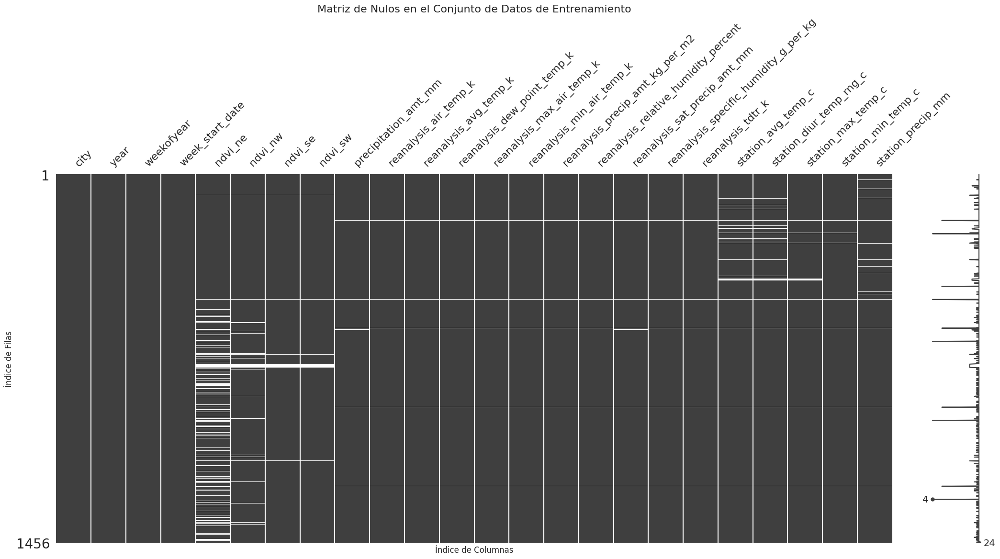

In [ ]:
import missingno as msno
import matplotlib.pyplot as plt

# Ordenar los datos para asegurar una correcta visualización e imputación de series temporales
train_data.sort_values(by=['city', 'week_start_date'], inplace=True)

# Visualización de la matriz de nulos para entender la distribución de los mismos
plt.figure(figsize=(10, 4))
msno.matrix(train_data)
plt.title('Matriz de Nulos en el Conjunto de Datos de Entrenamiento', fontsize=16)
plt.xlabel('Índice de Columnas')
plt.ylabel('Índice de Filas')
plt.show()

Esta matriz muestra patrones de nulidad y se concluye lo siguiente:


*   La presencia de líneas blancas indica valores faltantes en el conjunto de datos. Si las líneas aparecen agrupadas, esto podría indicar que los valores faltantes no están distribuidos al azar, sino que pueden estar relacionados con eventos específicos o condiciones de recolección de datos.

*   Variables con más nulos: Algunas variables, como ndvi_ne, ndvi_nw, ndvi_se, y ndvi_sw, muestran una mayor cantidad de nulos en comparación con otras. Esto podría indicar problemas con la recolección de datos de NDVI (Normalized Difference Vegetation Index) o podría reflejar la naturaleza estacional de la vegetación, que no siempre se detecta correctamente por los satélites.

*   Datos Completos: La mayoría de las variables parecen tener datos completos o solo unos pocos valores faltantes. Esto sugiere que, en general, el conjunto de datos está bastante completo.


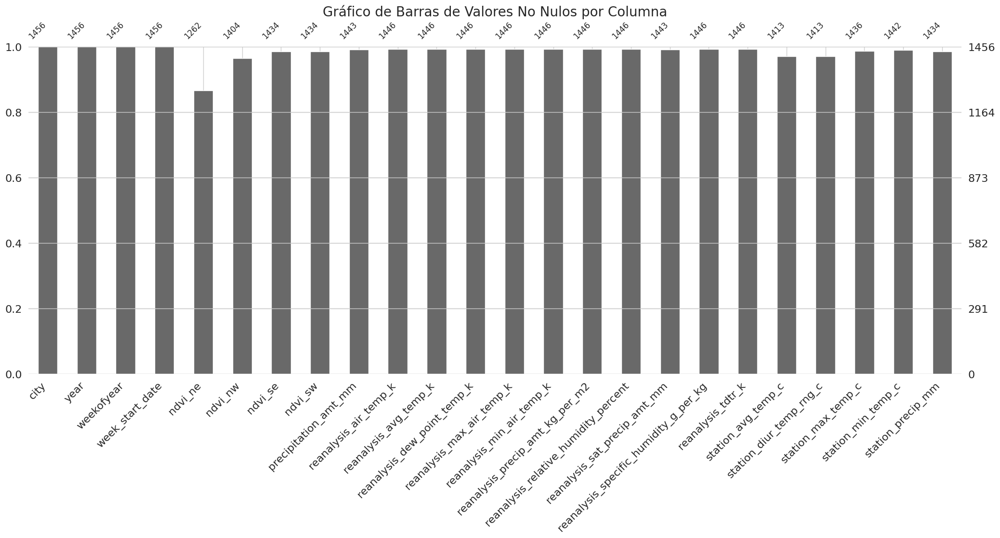

In [ ]:
# Visualización del gráfico de barras para el número de valores no nulos
plt.figure(figsize=(10, 4))
msno.bar(train_data)
# Ajuste de los títulos y tamaño de fuente
plt.title('Gráfico de Barras de Valores No Nulos por Columna', fontsize=20)
# Rotar las etiquetas de las columnas si es necesario
plt.xticks(rotation=45, ha='right', fontsize=12)  # ha es la alineación horizontal
# Ajustar el tamaño de las etiquetas del eje Y y el título
#plt.xlabel('Columnas', fontsize=14)
plt.ylabel('Recuento de Valores No Nulos', fontsize=14)
# Ajustar los márgenes de la subtrama para que los títulos y etiquetas no sean cortados
plt.subplots_adjust(bottom=0.2)

plt.show()

Este diagrama de barras permite corrobar lo comentado anteriormente respecto a las variables.

<Figure size 1000x400 with 0 Axes>

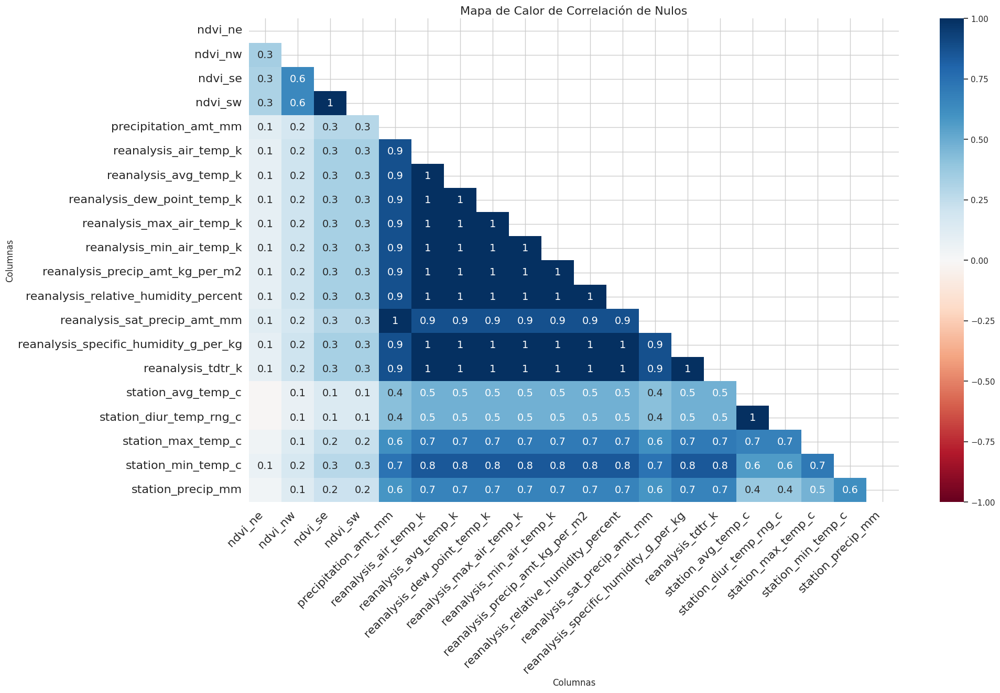

In [ ]:
# Mapa de calor para correlaciones de nulos
plt.figure(figsize=(10, 4))
msno.heatmap(train_data)
plt.title('Mapa de Calor de Correlación de Nulos', fontsize=16)
plt.xlabel('Columnas')
plt.ylabel('Columnas')
plt.show()

En esta matriz, cada cuadro muestra el coeficiente de correlación entre los valores nulos de dos variables: un valor de 1 indica una correlación perfecta, lo que significa que cuando una variable tiene un valor nulo, la otra también tiende a tenerlo. Se puede deducir que:


*   Correlaciones Fuertes: Se observan bloques de correlaciones fuertes (cercanas a 1) entre varias variables, particularmente entre ciertas variables climáticas como reanalysis_air_temp_k, reanalysis_avg_temp_k, reanalysis_dew_point_temp_k, reanalysis_max_air_temp_k, reanalysis_min_air_temp_k, reanalysis_precip_amt_kg_per_m2, reanalysis_relative_humidity_percent, reanalysis_sat_precip_amt_mm, reanalysis_specific_humidity_g_per_kg, y reanalysis_tdtr_k. Esto podría indicar que si falta una medición en un conjunto de variables climáticas, es probable que también falten en las otras.

*   Variables de NDVI: Las variables ndvi_ne, ndvi_nw, ndvi_se, y ndvi_sw también muestran una fuerte correlación de valores nulos entre sí. Si falta un valor NDVI en una dirección, es probable que falten valores en las otras direcciones.

*   Posibles Bloques de Datos: La presencia de correlaciones fuertes entre los valores nulos de las variables puede sugerir que hay bloques de observaciones que se perdieron juntas, tal vez debido a fallas en la recolección de datos o a problemas con las fuentes de datos para ciertos períodos de tiempo.

*   Datos Meteorológicos y Estación: Las correlaciones entre las variables de la estación meteorológica y las variables de reanálisis también son bastante altas. Esto podría indicar que las condiciones que llevan a la falta de una medición en las estaciones también afectan la disponibilidad de los datos de reanálisis.

<Figure size 1000x400 with 0 Axes>

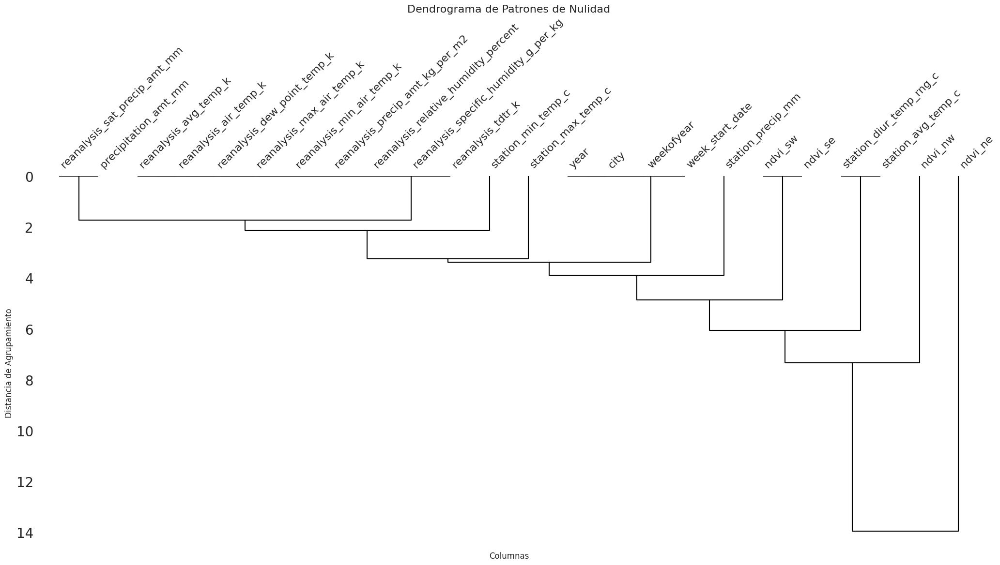

In [ ]:
# Gráfico de dendrograma para agrupar variables con patrones de nulidad similares
plt.figure(figsize=(10, 4))
msno.dendrogram(train_data)
plt.title('Dendrograma de Patrones de Nulidad', fontsize=16)
plt.xlabel('Columnas')
plt.ylabel('Distancia de Agrupamiento')
plt.show()

Este dendrograma puede ayudar a identificar qué variables tienen patrones de nulidad similares, lo que sugiere que estos datos pueden estar faltando juntos debido a un proceso relacionado o a condiciones de recopilación de datos similares.


*   Las variables relacionadas con la temperatura y la precipitación del reanálisis están agrupadas juntas, lo que indica que cuando falta una de estas mediciones, las demás también tienden a faltar.

*   Las variables ndvi_* se agrupan juntas en el extremo derecho del dendrograma, lo que indica que los valores faltantes de NDVI tienden a ocurrir al mismo tiempo, lo que podría ser el resultado de la cobertura de nubes que impide la visión del satélite o de problemas con los sensores de satélite para esas fechas específicas.

*   Las variables city, year, weekofyear, y week_start_date están en un grupo aparte, sugiriendo que raramente tienen valores faltantes y que son registros administrativos más confiables.






In [ ]:
# Para un análisis más detallado
nulos_por_columna = train_data.isnull().sum()
print(nulos_por_columna)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  194
ndvi_nw                                   52
ndvi_se                                   22
ndvi_sw                                   22
precipitation_amt_mm                      13
reanalysis_air_temp_k                     10
reanalysis_avg_temp_k                     10
reanalysis_dew_point_temp_k               10
reanalysis_max_air_temp_k                 10
reanalysis_min_air_temp_k                 10
reanalysis_precip_amt_kg_per_m2           10
reanalysis_relative_humidity_percent      10
reanalysis_sat_precip_amt_mm              13
reanalysis_specific_humidity_g_per_kg     10
reanalysis_tdtr_k                         10
station_avg_temp_c                        43
station_diur_temp_rng_c                   43
station_max_temp_c                        20
station_mi

Al ser un dataset en el que las variables han sido tomadas en un determinado lapso de tiempo, se puede aplicar una interpolación para imputar los valores nulos. Se podría optar también por una imputación con media o mediana, o con KNN, pero este último caso, para datos de series temporales, el uso directo de KNN puede no ser ideal, ya que los vecinos más cercanos en el espacio de características no necesariamente reflejan la proximidad temporal.

Se podría imputar los valores faltantes de una variable utilizando valores de otras variables dentro del mismo grupo (Por ejemplo se podría imputar temperaturas medias a partir de máximos y mínimos). Alternativamente, si un grupo de variables tiende a faltar juntas, podría ser prudente considerar un enfoque más cuidadoso o incluso excluir algunas de estas variables si están causando un sesgo debido a la cantidad de datos faltantes.

Pero se ha propuesto para evitar cualquier aumento de correlación, el utilizar a la variable 'week_start_date' como insumo para obtener una interpolación a partir del método 'time'.

Cabe recalcar que es nesario realizar una imputación por ciudad, dadas las características propias de cada caso.

In [ ]:
# Asegúrate de que 'week_start_date' sea el índice para poder realizar una interpolación basada en el tiempo
train.set_index('week_start_date', inplace=True)

# Realizar la interpolación de tiempo, pero mantener el orden original
for city in train['city'].unique():
    city_mask_train = (train['city'] == city)
    train.loc[city_mask_train] = train.loc[city_mask_train].interpolate(method='time')

# Restablece el índice para volver al formato original
train.reset_index(inplace=True)

In [ ]:
# Comprobar si aún quedan valores faltantes
print(train.isnull().sum())

week_start_date                          0
city                                     0
year                                     0
weekofyear                               0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

In [ ]:
train.head(5)

,week_start_date,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,1990-04-30,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,1990-05-07,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,1990-05-14,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,1990-05-21,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,1990-05-28,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [ ]:
#Contar valores perdidos
train.isnull().sum()

week_start_date                          0
city                                     0
year                                     0
weekofyear                               0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

## Consideraciones a simple inspección

En cuanto a la variable week_start_date, dado que ya se cuenta con las variables year y weekofyear para identificar temporalmente las observaciones, week_start_date podría considerarse redundante para muchos análisis relacionados con el tiempo, especialmente si el análisis se centra en tendencias estacionales o anuales en lugar de fechas específicas. Sin embargo, si se planea realizar un análisis que requiera precisión a nivel de fecha específica, esta variable podría ser útil.

Por lo tanto, se elimina esta variable.

In [ ]:
# Eliminar variable week_start_date por ser de tipo cadena de texto sin formato
train.drop("week_start_date", axis = 1, inplace = True)

## Tratamiento de duplicados

In [ ]:
train[train.duplicated(keep=False)]

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm


Como se puede apreciar no existen observaciones duplicadas.

## Detección de outliers

### Método del Rango Intercuartílico (IQR)

En primera instancia, se propone aplicar el método del IQR para analizar los outliers presentes en las variables numéricas.

In [ ]:
variables_continuas = train.select_dtypes(include=['float64', 'int64']).columns

for var in variables_continuas:
    Q1 = train[var].quantile(0.25)
    Q3 = train[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = train[(train[var] < lower_bound) | (train[var] > upper_bound)]
    print(f'{var} outliers: {len(outliers)}')

year outliers: 0
weekofyear outliers: 0
ndvi_ne outliers: 7
ndvi_nw outliers: 5
ndvi_se outliers: 23
ndvi_sw outliers: 35
precipitation_amt_mm outliers: 24
reanalysis_air_temp_k outliers: 0
reanalysis_avg_temp_k outliers: 2
reanalysis_dew_point_temp_k outliers: 7
reanalysis_max_air_temp_k outliers: 10
reanalysis_min_air_temp_k outliers: 6
reanalysis_precip_amt_kg_per_m2 outliers: 87
reanalysis_relative_humidity_percent outliers: 2
reanalysis_sat_precip_amt_mm outliers: 24
reanalysis_specific_humidity_g_per_kg outliers: 1
reanalysis_tdtr_k outliers: 1
station_avg_temp_c outliers: 6
station_diur_temp_rng_c outliers: 3
station_max_temp_c outliers: 4
station_min_temp_c outliers: 17
station_precip_mm outliers: 81


Como se puede apreciar, existe una presencia moderada de outliers en las variables ndvi_se, ndvi_sw, precipitation_amt_mm, reanalysis_precip_amt_kg_per_m2, reanalysis_sat_precip_amt_mm outliers, station_precip_mm outliers

Ahora se propone visualizar los diagramas de caja de cada una de las variables para constatar la anterior evaluación.

In [ ]:
!pip install plotly

In [ ]:
import plotly.express as px

# Seleccionar las variables de interés para la visualización
variables_of_interest = [
    'ndvi_se','ndvi_sw'
]

# Se usa el formato 'melt' para facilitar la visualización con Plotly Express
train_melted = train.melt(value_vars=variables_of_interest, var_name='Variable', value_name='Valor')

# Crear el boxplot interactivo
fig = px.box(train_melted, x='Variable', y='Valor', color='Variable',
             title='Boxplot de Variables con Mayor Número de Outliers')

# Personalizar el gráfico
fig.update_layout(showlegend=False)
fig.update_traces(quartilemethod="inclusive") # Puedes cambiar a "exclusive" si prefieres

# Mostrar el gráfico
fig.show()

In [ ]:
import plotly.express as px

# Seleccionar las variables de interés para la visualización
variables_of_interest = [
    'precipitation_amt_mm',
    'reanalysis_precip_amt_kg_per_m2', 'reanalysis_sat_precip_amt_mm',
    'station_precip_mm'
]

# Usarel formato 'melt' para facilitar la visualización con Plotly Express
train_melted = train.melt(value_vars=variables_of_interest, var_name='Variable', value_name='Valor')

# Crear el boxplot interactivo
fig = px.box(train_melted, x='Variable', y='Valor', color='Variable',
             title='Boxplot de Variables con Mayor Número de Outliers')

# Personalizar el gráfico
fig.update_layout(showlegend=False)
fig.update_traces(quartilemethod="inclusive") # Puedes cambiar a "exclusive" si prefieres

# Mostrar el gráfico
fig.show()

## Tratamiento de outliers

In [ ]:
outliers_train = train

# Función para eliminar outliers
def remove_outliers(df, column_names):
    """
    Elimina los outliers basados en el método IQR para las columnas especificadas de un DataFrame.

    Parámetros:
    - df: DataFrame de pandas.
    - column_names: Lista de columnas a las que se les eliminarán los outliers.

    Retorna:
    - DataFrame con los outliers eliminados de las columnas especificadas.
    """
    for column in column_names:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filtrar los outliers
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

    return df

In [ ]:
# Variables a considerar
columns_to_filter = ['ndvi_se','ndvi_sw','precipitation_amt_mm',
    'reanalysis_precip_amt_kg_per_m2', 'reanalysis_sat_precip_amt_mm',
    'station_precip_mm']

# Aplicar la función para eliminar outliers
outliers_train= remove_outliers(outliers_train, columns_to_filter)

Se verifica la nueva dimensión del dataset

In [ ]:
outliers_train.shape

(1218, 23)

Se comprueba que si se eliminan los outliers se pierden 239 observaciones (17% de los datos aproximadamente), que podrían ser datos climáticos extremos o anomalías en la vegetación, por lo que, puede ser contraproducente y sea meritorio mantenerlos para el clustering.

In [ ]:
train.shape

(1456, 23)

## Análisis de correlación

In [ ]:
# Seleccionar columnas numéricas y de datetime
numerical_cols = train.select_dtypes(include=[np.number]).columns

# Crear un DataFrame solo con esas columnas
train_numerical = train[numerical_cols]

In [ ]:
# Calcular la matriz de correlación
correlation_matrix = train_numerical.corr()

# Crear el heatmap con Plotly Express y truncar los valores a tres decimales
fig = px.imshow(correlation_matrix,
                text_auto=".3f",  # Formato para truncar a tres decimales
                aspect="auto",
                color_continuous_scale='RdBu_r',
                labels=dict(color="Coeficiente de Correlación"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns)

# Ajustes adicionales (opcional)
fig.update_layout(width=1400, height=1400,
                  title_text='Matriz de Correlación', title_x=0.5,
                  font=dict(size=10))

fig.update_traces(textfont=dict(size=9))

# Mostrar el gráfico
fig.show()

In [ ]:
# Iteración a la matriz de correlación para establecer qué variables tienen alta correlación
high_corr_threshold = 0.7  # Definir el umbral de alta correlación
highly_correlated_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):  # i+1 para evitar duplicados y la diagonal
        if abs(correlation_matrix.iloc[i, j]) > high_corr_threshold:
            highly_correlated_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

# Imprimir los pares de variables altamente correlacionadas
for pair in highly_correlated_pairs:
    print(f"{pair[0]} y {pair[1]} tienen una correlación de {pair[2]:.3f}")


ndvi_ne y ndvi_nw tienen una correlación de 0.832
ndvi_se y ndvi_sw tienen una correlación de 0.820
precipitation_amt_mm y reanalysis_sat_precip_amt_mm tienen una correlación de 1.000
reanalysis_air_temp_k y reanalysis_avg_temp_k tienen una correlación de 0.901
reanalysis_air_temp_k y reanalysis_min_air_temp_k tienen una correlación de 0.736
reanalysis_air_temp_k y station_min_temp_c tienen una correlación de 0.718
reanalysis_avg_temp_k y station_avg_temp_c tienen una correlación de 0.744
reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg tienen una correlación de 0.997
reanalysis_dew_point_temp_k y station_avg_temp_c tienen una correlación de 0.736
reanalysis_max_air_temp_k y reanalysis_tdtr_k tienen una correlación de 0.919
reanalysis_max_air_temp_k y station_diur_temp_rng_c tienen una correlación de 0.835
reanalysis_max_air_temp_k y station_max_temp_c tienen una correlación de 0.763
reanalysis_min_air_temp_k y reanalysis_tdtr_k tienen una correlación de -0.815
reana

Tras la obtención de la matriz de correlación y los pares de variables que poseen alta correlación, se puede decir que:

**NDVI**
*   Las correlaciones entre ndvi_ne y ndvi_nw, y entre ndvi_se y ndvi_sw, sugieren que las áreas de vegetación medidas por el NDVI son consistentes en términos de dirección geográfica. Esto era de esperar ya que las mediciones de NDVI tienden a ser similares en áreas geográficamente cercanas.
*   ndvi_ne y ndvi_nw (0.832): Indica que las medidas de vegetación en el noreste y el noroeste de una ubicación tienden a ser similares. Podría reflejar que las condiciones ambientales de estas áreas son bastante homogéneas.
*   ndvi_se y ndvi_sw (0.820): Similar al caso anterior, sugiere que las áreas del sureste y suroeste presentan condiciones de vegetación consistentes.


**Precipitación**

*   precipitation_amt_mm y reanalysis_sat_precip_amt_mm (1.00) tienen una correlación perfecta, lo que indica que son esencialmente la misma medición expresada de manera diferente o tomada de fuentes de datos que están en completo acuerdo.


**Temperatura**

*   Varias mediciones de temperatura, como reanalysis_air_temp_k, reanalysis_avg_temp_k, reanalysis_min_air_temp_k, y station_min_temp_c, muestran altas correlaciones entre sí (0.741 a 0.916). Estas altas correlaciones sugieren que las diferentes mediciones de temperatura están proporcionando información similar sobre el clima. Podrías considerar usar una representación resumida o seleccionar la más directamente relevante para tu análisis.
*   reanalysis_max_air_temp_k y reanalysis_tdtr_k (0.919): La alta correlación aquí es esperada, ya que el rango de temperatura diurna está directamente relacionado con la temperatura máxima.

**Humedad**
*   reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg (0.997): Estas dos mediciones están casi perfectamente correlacionadas porque ambas son indicadores directos de la cantidad de humedad en el aire.

**Rango de Temperatura Diurna**

*   reanalysis_tdtr_k y station_diur_temp_rng_c (0.877): Otra correlación fuerte que es esperada, ya que ambas variables miden la variabilidad en la temperatura a lo largo del día.
*  reanalysis_max_air_temp_k y station_diur_temp_rng_c (0.835): Nuevamente, la temperatura máxima afecta el rango de temperatura diurno.
*   reanalysis_min_air_temp_k y reanalysis_tdtr_k tienen una correlación negativa (-0.815): Lo que significa que días con temperaturas mínimas más altas tienden a tener un rango diurno de temperatura menor, lo cual tiene sentido ya que la temperatura no cae tanto durante la noche.

**Estación Meteorológica vs. Reanálisis**
*   reanalysis_specific_humidity_g_per_kg y station_avg_temp_c (0.741): La humedad específica está relacionada con la temperatura media registrada en la estación meteorológica.
*   station_avg_temp_c y station_max_temp_c (0.763): La temperatura promedio y máxima registrada en la estación meteorológica están lógicamente correlacionadas.













## Transformación de variables categóricas

In [ ]:
# Binarizador para la variable categórica city en el conjunto de entrenamiento y test
from sklearn import preprocessing
lb = preprocessing.LabelBinarizer()
train['city'] = lb.fit_transform(train['city'])

train.tail()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
1451,0,2010,21,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,300.771429,...,45.00,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0
1452,0,2010,22,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,299.392857,...,207.10,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6
1453,0,2010,23,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,297.592857,...,50.60,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4
1454,0,2010,24,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,297.521429,...,62.33,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0
1455,0,2010,25,0.298186,0.232971,0.274214,0.315757,63.22,298.097143,299.835714,...,36.90,89.082857,63.22,17.355714,11.014286,27.475000,9.900000,33.7,22.2,20.4


---
# Características
---

## Normalización de Datos

Se visualizan los tipos de datos de las variables, para saber qué variables normalizar.

In [ ]:
train.dtypes

city                                       int64
year                                       int64
weekofyear                                 int64
ndvi_ne                                  float64
ndvi_nw                                  float64
ndvi_se                                  float64
ndvi_sw                                  float64
precipitation_amt_mm                     float64
reanalysis_air_temp_k                    float64
reanalysis_avg_temp_k                    float64
reanalysis_dew_point_temp_k              float64
reanalysis_max_air_temp_k                float64
reanalysis_min_air_temp_k                float64
reanalysis_precip_amt_kg_per_m2          float64
reanalysis_relative_humidity_percent     float64
reanalysis_sat_precip_amt_mm             float64
reanalysis_specific_humidity_g_per_kg    float64
reanalysis_tdtr_k                        float64
station_avg_temp_c                       float64
station_diur_temp_rng_c                  float64
station_max_temp_c  

En cuanto a las variables year y weekofyear, se propone utilizarlas como variables de tipo numéricas, ya que, se considera que refleja una tendencia lineal o incremental en los datos (por ejemplo, si la incidencia del dengue está aumentando o disminuyendo con el tiempo), entonces tratarla como numérica y estandarizarla podría tener más sentido.

Esto te permite capturar tendencias a lo largo del tiempo sin aumentar la dimensionalidad de los datos.


Por otro lado, para la variable weekofyear, considerarla como numérica también puede tener sentido, especialmente en el contexto del análisis del dengue, donde la temporalidad y la estacionalidad juegan un papel importante. Tratar weekofyear como numérica permite capturar patrones estacionales y tendencias que son críticas para entender cómo varía la incidencia del dengue a lo largo del año.


Por lo tanto, se normalizarán para ejecutar los algoritmos de clustering.

En cuanto a las variables numéricas continuas, es importante tener en cuenta que, aunque el NDVI es un índice que ya está normalizado en el rango de -1 a 1, si se aplica una normalización adicional (como la estandarización), se puede asegurar que todas las variables tengan una media de 0 y una desviación estándar de 1, lo cual es un requisito común para muchos algoritmos de clustering.

Por otro lado, la variable city, debe ser tratada como una variable categórica, por lo que, debe ser convertida utilizando técnicas como one-hot encoding para transformarla en formato numérico. Esto no requiere estandarización o normalización posterior ya que el resultado de one-hot encoding ya está en forma binaria (0 o 1).

Dada la diversidad de las variables, la estandarización es probablemente la mejor opción. Se transformarán las variables para que tengan una media de 0 y una desviación estándar de 1, lo que es ideal para la mayoría de los casos de uso en clustering. Tambiés es importante mencionar que al binarizar la variable city, no es necesario aplicar técnicas de onehot encoding, ni normalizar dicha variable

In [ ]:
# from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

# Definir las columnas numéricas para estandarizar
numerical_columns = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
                     'reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
                     'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
                     'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent',
                     'reanalysis_sat_precip_amt_mm', 'reanalysis_specific_humidity_g_per_kg',
                     'reanalysis_tdtr_k', 'station_avg_temp_c', 'station_diur_temp_rng_c',
                     'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
                     'year', 'weekofyear']

# Transformador para variables numéricas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), numerical_columns),
        #('cat', OneHotEncoder(), ['city'])
    ],
   remainder='drop')  # Cambiado a 'drop' para ignorar las columnas no especificadas

Cabe recalcar, que como se han mantenido los outliers de todas las variables, se podría utilizar el método de estandarización RobustScaler, ya que utiliza estadísticas que son robustas a outliers. Escala los datos según el rango intercuartil (IQR), es decir, entre el primer cuartil (25%) y el tercer cuartil (75%). También se puede considerar MinMaxScaler, que puede ser preferible para normalización de datos en muchos contextos, especialmente cuando los datos ya están bastante limpios y sin valores atípicos significativos.

** Se hicieron pruebas con ambos métodos y el que mejor arrojó resultados fue MinMaxScaler, esto puede ser, debido a que los outliers pueden no ser significativos.

Se aplican las transformaciones propuestas al dataset

In [ ]:
# Aplicar la transformación
train_transformed = preprocessor.fit_transform(train)

# Las columnas transformadas serán solo las numéricas, entonces se debe añadir 'city' manualmente
columns_transformed = numerical_columns + ['city']  # Ahora 'city' se añadirá manualmente después

# Convertir a DataFrame
train_t = pd.DataFrame(train_transformed, columns=numerical_columns, index=train.index)

# Añadir manualmente la columna 'city' del DataFrame original 'train'
train_t['city'] = train['city'].values  # Usar .values para asegurar la compatibilidad de índices

In [ ]:
# Mostrar el nuevo dataframe
train_t.head(5)

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,...,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,year,weekofyear,city
0,0.578226,0.614835,0.386418,0.395544,0.031797,0.388291,0.354667,0.314680,0.123457,0.692308,...,0.262659,0.086660,0.430091,0.210393,0.174194,0.486239,0.029450,0.0,0.326923,1
1,0.629943,0.657063,0.321190,0.359233,0.058423,0.472710,0.441778,0.489213,0.191358,0.730769,...,0.418164,0.069133,0.565350,0.163498,0.322581,0.688073,0.015829,0.0,0.346154,1
2,0.479441,0.690881,0.311879,0.384430,0.088428,0.548064,0.496000,0.657583,0.166667,0.800000,...,0.586900,0.064265,0.565350,0.173638,0.354839,0.743119,0.076201,0.0,0.365385,1
3,0.584823,0.770066,0.438912,0.491150,0.039324,0.575260,0.539556,0.643471,0.222222,0.776923,...,0.566808,0.073028,0.645897,0.198986,0.425806,0.788991,0.007362,0.0,0.384615,1
4,0.658698,0.788882,0.481601,0.509943,0.019252,0.645515,0.593778,0.701541,0.253086,0.815385,...,0.628226,0.112950,0.802432,0.429658,0.535484,0.844037,0.010676,0.0,0.403846,1


Ahora se debe transponer el dataset transformado para seleccionar realizar un análisis de selección de variables

## Dataset transpuesto

In [ ]:
from numpy import corrcoef, transpose, arange

train_tt = transpose(train_t)
train_tt

,0,1,2,3,4,5,6,7,8,9,...,1446,1447,1448,1449,1450,1451,1452,1453,1454,1455
ndvi_ne,0.578226,0.629943,0.479441,0.584823,0.658698,0.613159,0.567621,0.523449,0.556195,0.605629,...,0.697278,0.706306,0.729345,0.628615,0.731813,0.818931,0.619290,0.714304,0.809270,0.770206
ndvi_nw,0.614835,0.657063,0.690881,0.770066,0.788882,0.692949,0.602837,0.580542,0.661456,0.634412,...,0.824560,0.785666,0.781838,0.674993,0.800195,0.851154,0.677048,0.661327,0.770839,0.756782
ndvi_se,0.386418,0.321190,0.311879,0.438912,0.481601,0.487224,0.398313,0.301536,0.254772,0.318168,...,0.626870,0.583769,0.493466,0.268313,0.494368,0.490886,0.273679,0.480079,0.531588,0.523154
ndvi_sw,0.395544,0.359233,0.384430,0.491150,0.509943,0.402314,0.449123,0.322386,0.306916,0.436481,...,0.505120,0.609378,0.662445,0.343012,0.505284,0.584064,0.474367,0.487587,0.638162,0.622199
precipitation_amt_mm,0.031797,0.058423,0.088428,0.039324,0.019252,0.024526,0.008909,0.386892,0.049462,0.036892,...,0.221966,0.066564,0.189375,0.152074,0.002944,0.141577,0.221377,0.150896,0.152765,0.161854
reanalysis_air_temp_k,0.388291,0.472710,0.548064,0.575260,0.645515,0.660246,0.604344,0.655146,0.653447,0.729556,...,0.502738,0.583381,0.394145,0.349386,0.398300,0.621152,0.488385,0.259490,0.226062,0.457602
reanalysis_avg_temp_k,0.354667,0.441778,0.496000,0.539556,0.593778,0.606222,0.538667,0.576889,0.580444,0.670222,...,0.574222,0.639111,0.459556,0.378667,0.474667,0.731556,0.560000,0.336000,0.327111,0.615111
reanalysis_dew_point_temp_k,0.314680,0.489213,0.657583,0.643471,0.701541,0.704947,0.706569,0.782157,0.764801,0.795783,...,0.912409,0.775020,0.832603,0.805677,0.406975,0.815572,0.773236,0.665207,0.645093,0.699919
reanalysis_max_air_temp_k,0.123457,0.191358,0.166667,0.222222,0.253086,0.283951,0.216049,0.172840,0.265432,0.277778,...,0.425926,0.654321,0.425926,0.506173,0.672840,0.734568,0.660494,0.475309,0.512346,0.617284
reanalysis_min_air_temp_k,0.692308,0.730769,0.800000,0.776923,0.815385,0.861538,0.830769,0.884615,0.830769,0.907692,...,0.600000,0.592308,0.592308,0.546154,0.246154,0.584615,0.384615,0.423077,0.384615,0.415385


In [ ]:
# Dimensiones del dataframe transpuesto
train_tt.shape

(23, 1456)

In [ ]:
train_tt.head(5)

,0,1,2,3,4,5,6,7,8,9,...,1446,1447,1448,1449,1450,1451,1452,1453,1454,1455
ndvi_ne,0.578226,0.629943,0.479441,0.584823,0.658698,0.613159,0.567621,0.523449,0.556195,0.605629,...,0.697278,0.706306,0.729345,0.628615,0.731813,0.818931,0.619290,0.714304,0.809270,0.770206
ndvi_nw,0.614835,0.657063,0.690881,0.770066,0.788882,0.692949,0.602837,0.580542,0.661456,0.634412,...,0.824560,0.785666,0.781838,0.674993,0.800195,0.851154,0.677048,0.661327,0.770839,0.756782
ndvi_se,0.386418,0.321190,0.311879,0.438912,0.481601,0.487224,0.398313,0.301536,0.254772,0.318168,...,0.626870,0.583769,0.493466,0.268313,0.494368,0.490886,0.273679,0.480079,0.531588,0.523154
ndvi_sw,0.395544,0.359233,0.384430,0.491150,0.509943,0.402314,0.449123,0.322386,0.306916,0.436481,...,0.505120,0.609378,0.662445,0.343012,0.505284,0.584064,0.474367,0.487587,0.638162,0.622199
precipitation_amt_mm,0.031797,0.058423,0.088428,0.039324,0.019252,0.024526,0.008909,0.386892,0.049462,0.036892,...,0.221966,0.066564,0.189375,0.152074,0.002944,0.141577,0.221377,0.150896,0.152765,0.161854


Tras obtener el dataset transpuesto, se se realiza un análisis de outliers.

In [ ]:
variables_continuas = train_tt.select_dtypes(include=['float64', 'int64']).columns

for var in variables_continuas:
    Q1 = train_tt[var].quantile(0.25)
    Q3 = train_tt[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = train_tt[(train_tt[var] < lower_bound) | (train_tt[var] > upper_bound)]
    print(f'{var} outliers: {len(outliers)}')

0 outliers: 1
1 outliers: 0
2 outliers: 0
3 outliers: 0
4 outliers: 0
5 outliers: 0
6 outliers: 0
7 outliers: 0
8 outliers: 0
9 outliers: 0
10 outliers: 0
11 outliers: 0
12 outliers: 0
13 outliers: 0
14 outliers: 0
15 outliers: 0
16 outliers: 0
17 outliers: 0
18 outliers: 0
19 outliers: 0
20 outliers: 0
21 outliers: 0
22 outliers: 0
23 outliers: 0
24 outliers: 0
25 outliers: 0
26 outliers: 0
27 outliers: 0
28 outliers: 0
29 outliers: 0
30 outliers: 0
31 outliers: 0
32 outliers: 2
33 outliers: 0
34 outliers: 0
35 outliers: 1
36 outliers: 0
37 outliers: 0
38 outliers: 1
39 outliers: 1
40 outliers: 0
41 outliers: 0
42 outliers: 0
43 outliers: 1
44 outliers: 0
45 outliers: 0
46 outliers: 0
47 outliers: 0
48 outliers: 0
49 outliers: 0
50 outliers: 1
51 outliers: 0
52 outliers: 0
53 outliers: 0
54 outliers: 0
55 outliers: 0
56 outliers: 0
57 outliers: 0
58 outliers: 0
59 outliers: 0
60 outliers: 0
61 outliers: 0
62 outliers: 0
63 outliers: 0
64 outliers: 0
65 outliers: 0
66 outliers: 0
67 ou

Como se puede apreciar, en la mayoría de las columnas del dataset transpuesto, se puede encontrar una cantidad mínima de outliers, por lo tanto, no se realiza ningún tratamiento de dichos valores atípicos.

Se comprueba el tipo de datos que posee este dataset.

In [ ]:
train_tt.dtypes

0       float64
1       float64
2       float64
3       float64
4       float64
         ...   
1451    float64
1452    float64
1453    float64
1454    float64
1455    float64
Length: 1456, dtype: object

Por lo tanto, las características a analizar, son las siguientes:

In [ ]:
names =  train_tt.index
names

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'year', 'weekofyear',
       'city'],
      dtype='object')

In [ ]:
names.shape

(23,)

### Selección de características

#### Correlación entre variables

En primera instancia, se propone analizar la correlación de las variables de este dataset transpuesto.

Fuente: Notebook provisto en la materia de Machine Learning 07MBID (6 - Selección de características.ipynb)

<Axes: >

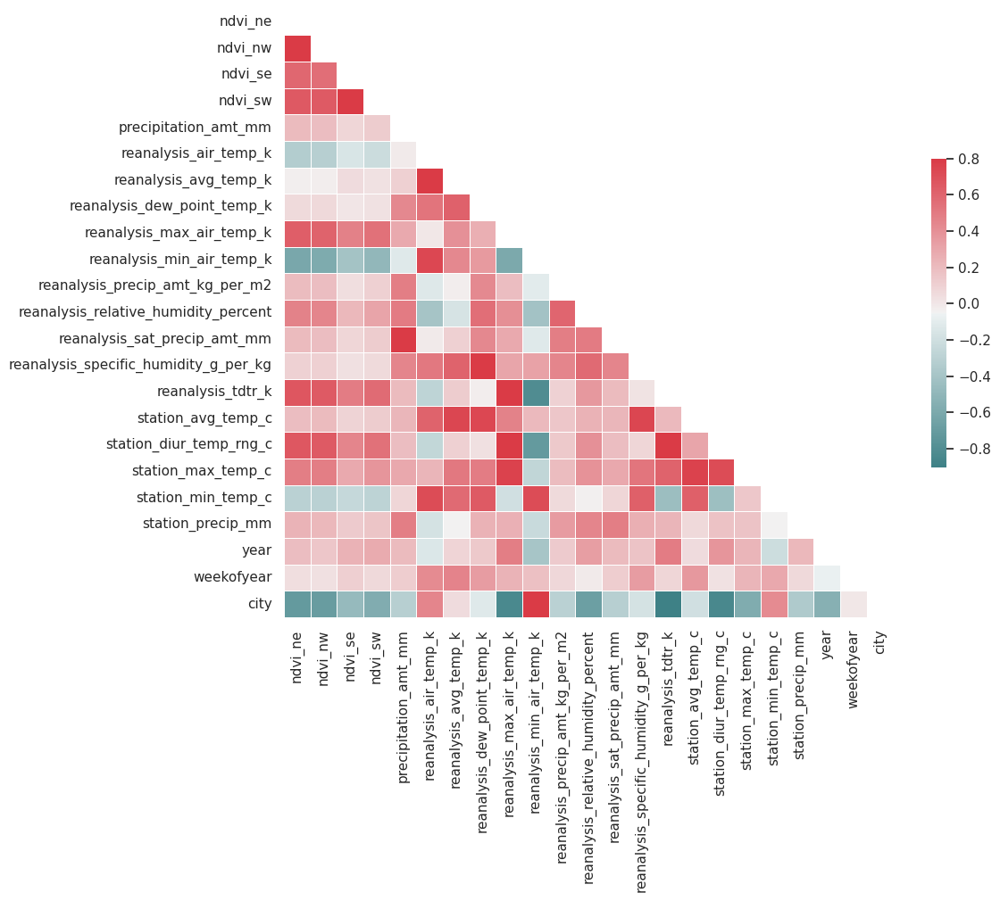

In [ ]:
R = corrcoef(train_tt)

# Generate a mask for the upper triangle
sns.set(style="white")
mask = np.zeros_like(R, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(R, mask=mask, cmap=cmap, vmax=.8,
            square=True, xticklabels=names, yticklabels=names,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)

In [ ]:
R.shape

(23, 23)

Se procede a obtener los pares de variables altamente correlacionadas, con el umbral de alta correlación de 0.7.

In [ ]:
high_corr_threshold = 0.7  # Definir el umbral de alta correlación
highly_correlated_pairs = []

# Asumimos que 'names' es una lista o array de los nombres de las variables correspondientes a las filas/columnas de 'R'
for i in range(len(R)):
    for j in range(i+1, len(R)):  # i+1 para evitar duplicados y la diagonal
        if abs(R[i, j]) > high_corr_threshold:
            highly_correlated_pairs.append((names[i], names[j], R[i, j]))

# Imprimir los pares de variables altamente correlacionadas
for pair in highly_correlated_pairs:
    print(f"{pair[0]} y {pair[1]} tienen una correlación de {pair[2]:.3f}")

ndvi_ne y ndvi_nw tienen una correlación de 0.832
ndvi_ne y city tienen una correlación de -0.718
ndvi_se y ndvi_sw tienen una correlación de 0.820
precipitation_amt_mm y reanalysis_sat_precip_amt_mm tienen una correlación de 1.000
reanalysis_air_temp_k y reanalysis_avg_temp_k tienen una correlación de 0.901
reanalysis_air_temp_k y reanalysis_min_air_temp_k tienen una correlación de 0.736
reanalysis_air_temp_k y station_min_temp_c tienen una correlación de 0.718
reanalysis_avg_temp_k y station_avg_temp_c tienen una correlación de 0.744
reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg tienen una correlación de 0.997
reanalysis_dew_point_temp_k y station_avg_temp_c tienen una correlación de 0.736
reanalysis_max_air_temp_k y reanalysis_tdtr_k tienen una correlación de 0.919
reanalysis_max_air_temp_k y station_diur_temp_rng_c tienen una correlación de 0.835
reanalysis_max_air_temp_k y station_max_temp_c tienen una correlación de 0.763
reanalysis_max_air_temp_k y city tie

Como se puede apreciar, se han obtenido correlaciones prácticamente similares a las obtenidas con la matriz de correlación en el análisis previo.

#### Análisis de Componentes Principlas (PCA)

Para corroborar las correlaciones obtenidas anteriormente, se precede a realizar una PCA para visualizar el agrupamiento de variables similares.

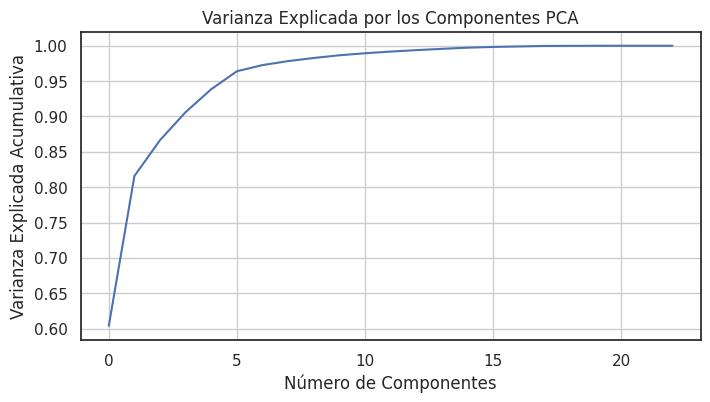

Número de componentes para explicar el 95% de la varianza: 6


In [ ]:
from sklearn.decomposition import PCA

# Primero, determinar cuántos componentes son necesarios para explicar la varianza deseada
pca = PCA().fit(train_tt)  # No se especifica n_components para ver la varianza de todos los componentes
explained_var_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
explained_var_cumulative = np.cumsum(explained_var_ratio)

# Graficar la varianza explicada acumulativa para encontrar el "codo"
plt.figure(figsize=(8,4))
plt.plot(explained_var_cumulative)
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.title('Varianza Explicada por los Componentes PCA')
plt.grid(True)
plt.show()

# Identificar el número de componentes para la varianza explicada deseada, por ejemplo, 0.95
n_components = np.argmax(explained_var_cumulative >= 0.95) + 1  # +1 porque los índices en Python empiezan en 0
print(f"Número de componentes para explicar el 95% de la varianza: {n_components}")


Como se puede apreciar, el 95% de la variabibilidad es obtenida a partir de 6 componentes principales.

In [ ]:
# Aplicar PCA con el número de componentes seleccionado
pca_optimal = PCA(n_components=n_components)
X_pca_optimal = pca_optimal.fit_transform(train_tt)

Se procede a obtener la gráfica de las dos primeras PCA, para analizar variables similares.

In [ ]:
!pip install adjustText

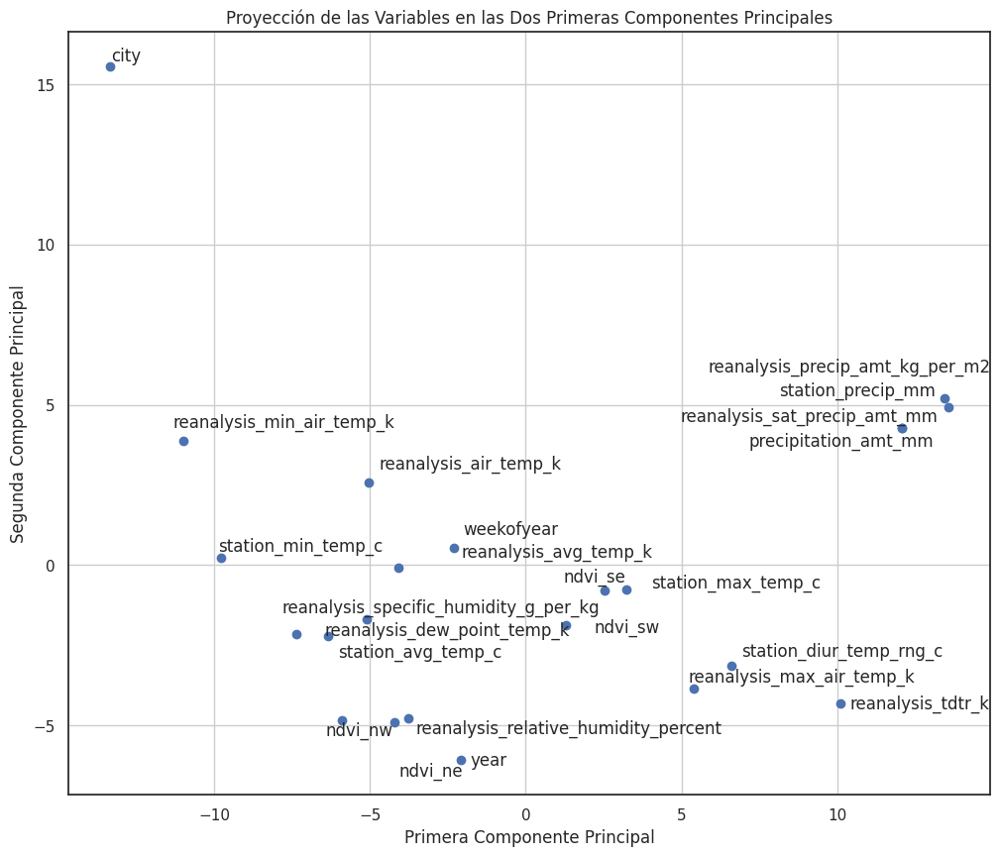

In [ ]:
from adjustText import adjust_text

# Generar el gráfico de dispersión
plt.figure(figsize=(12, 10))
plt.scatter(X_pca_optimal[:, 0], X_pca_optimal[:, 1])  # Grafica todos los puntos

# Crear una lista para guardar los objetos de texto
texts = []
for i in range(len(X_pca_optimal)):
    texts.append(plt.text(X_pca_optimal[i, 0], X_pca_optimal[i, 1], names[i]))

# Llamar a adjust_text para ajustar automáticamente la posición de los textos
adjust_text(texts)

plt.xlabel('Primera Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Proyección de las Variables en las Dos Primeras Componentes Principales')
plt.grid(True)
plt.show()

Una vez más se comprueba que las variables que obtuvieron una alta correlación, tanto en la matriz de correlación en el análisis del dataset sin transponer y en el dataset transpuesto, a partir de la aplicación de PCA, también poseen la tendencia de estar asociadas.

Como se puede apreciar, las variables de NDVI tomadas en dirección norte y dirección sur, se encuentran agrupadas. También variables como la precipitación y la humedad.

#### Clustering jerárquico

Ahora se propone un clustering jerárquico para analizar las variables de interés y corroborar resultados anteriores.

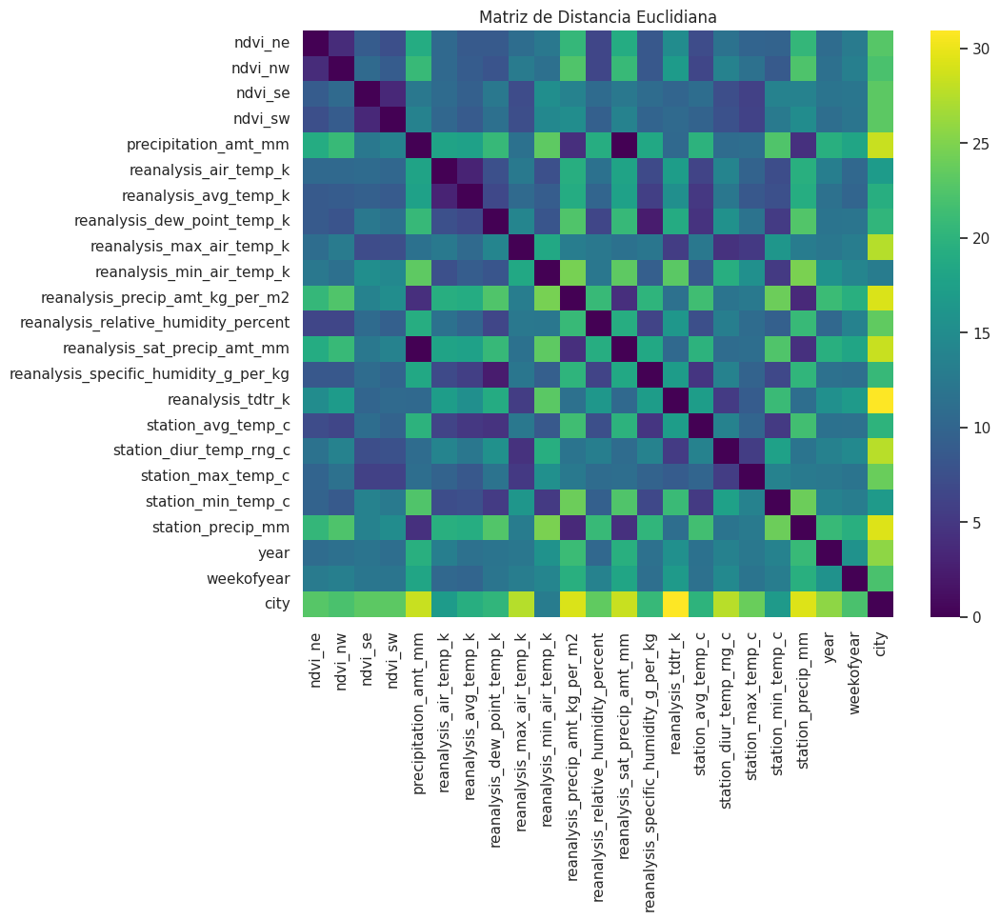

In [ ]:
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular la matriz de distancias euclidianas entre cada par de variables
matdist = pdist(train_tt, 'euclidean')
matdist_square = squareform(matdist)

# Visualizar la matriz de distancias
sns.set(style="white")
plt.figure(figsize=(10, 8))
ax = sns.heatmap(matdist_square, vmin=0, vmax=matdist_square.max(), cmap='viridis', xticklabels=names, yticklabels=names)
plt.title('Matriz de Distancia Euclidiana')
plt.show()

In [ ]:
# Crear un DataFrame de distancias, excluyendo la diagonal
dist_df = pd.DataFrame(matdist_square, index=names, columns=names)
np.fill_diagonal(dist_df.values, np.inf)  # Excluir la diagonal

# Encontrar los índices de los valores más bajos en la matriz de distancias
min_indices = np.dstack(np.unravel_index(np.argsort(dist_df.values.ravel()), dist_df.shape))[0]

# Crear una lista para las parejas de variables más cercanas
closest_pairs = []

# Recorrer los índices ordenados y recogemos las 10 distancias más pequeñas
for index_pair in min_indices:
    i, j = index_pair
    if i < j:  # Asegurarse de no tomar un índice de la diagonal ni duplicar pares
        closest_pairs.append((names[i], names[j], dist_df.iat[i, j]))
        if len(closest_pairs) == 10:  # Solo queremos las 10 distancias más pequeñas
            break

# Convertir la lista en un DataFrame para visualizarla
closest_pairs_df = pd.DataFrame(closest_pairs, columns=['Variable 1', 'Variable 2', 'Distancia'])
closest_pairs_df

,Variable 1,Variable 2,Distancia
0,precipitation_amt_mm,reanalysis_sat_precip_amt_mm,0.000000
1,reanalysis_dew_point_temp_k,reanalysis_specific_humidity_g_per_kg,2.386756
2,reanalysis_air_temp_k,reanalysis_avg_temp_k,2.975966
3,ndvi_se,ndvi_sw,3.465588
4,reanalysis_precip_amt_kg_per_m2,station_precip_mm,3.567211
5,ndvi_ne,ndvi_nw,3.777977
6,reanalysis_precip_amt_kg_per_m2,reanalysis_sat_precip_amt_mm,4.224888
7,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,4.224888
8,reanalysis_sat_precip_amt_mm,station_precip_mm,4.283333
9,precipitation_amt_mm,station_precip_mm,4.283333


De esta manera, se vuelve a apreciar que las mismas variables que obtuvieron una correlación casi perfecta, en este caso, vuelven a tener una consideración de asociación.

Acto seguido, se grafica el dendograma.

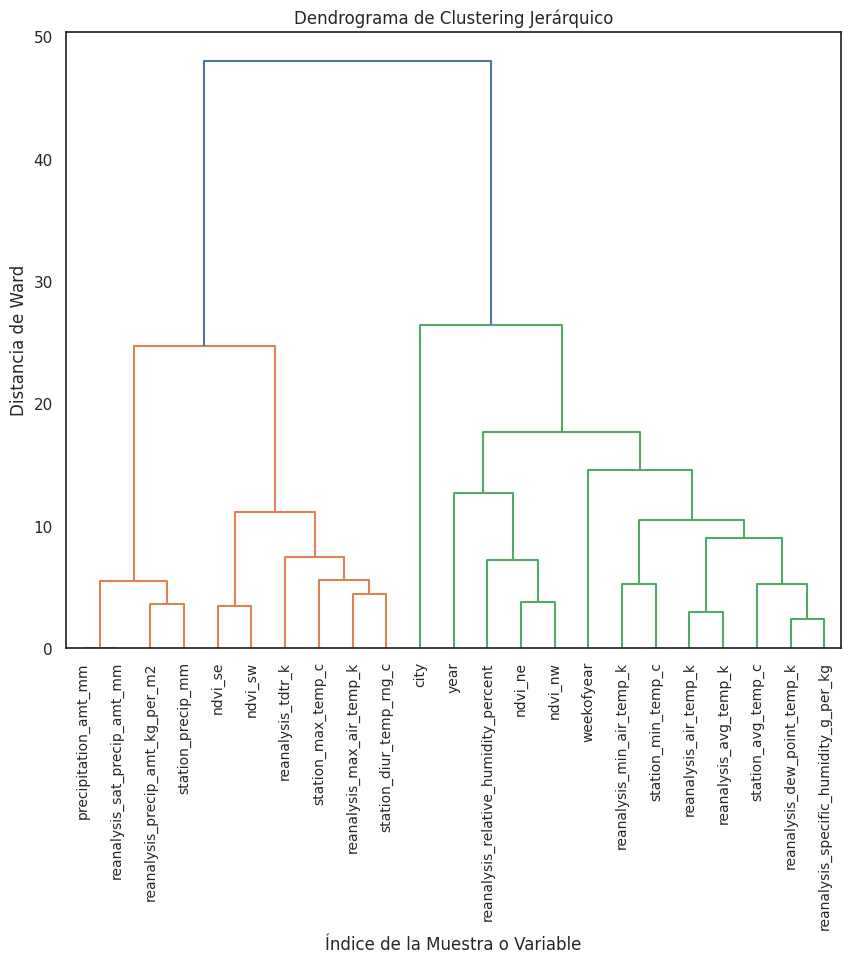

In [ ]:
# Realizar clustering jerárquico usando el enlace Ward
Z = linkage(matdist, 'ward')

# Visualizar el dendrograma
plt.figure(figsize=(10, 8))
dendrogram(Z, labels=names, orientation='top', leaf_rotation=90)
plt.title('Dendrograma de Clustering Jerárquico')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
plt.show()

Ahora tras obtener el dendograma, se puede ver que efectivamente se agrupan las variables correspondientes al NDVI según la dirección norte o sur. De la misma manera, se agrupan todas las variables de precipitaciones, variables de temperatura y humedad.

Ahora se obtienen las etiquetas

In [ ]:
# Cortar el dendrograma para obtener los labels de los clusters
from scipy.cluster.hierarchy import fcluster

distance_threshold = 40
labels_cj = fcluster(Z, distance_threshold, criterion='distance')

In [ ]:
labels_cj

array([2, 2, 1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 2,
       2], dtype=int32)

Ahora, se procede a graficar

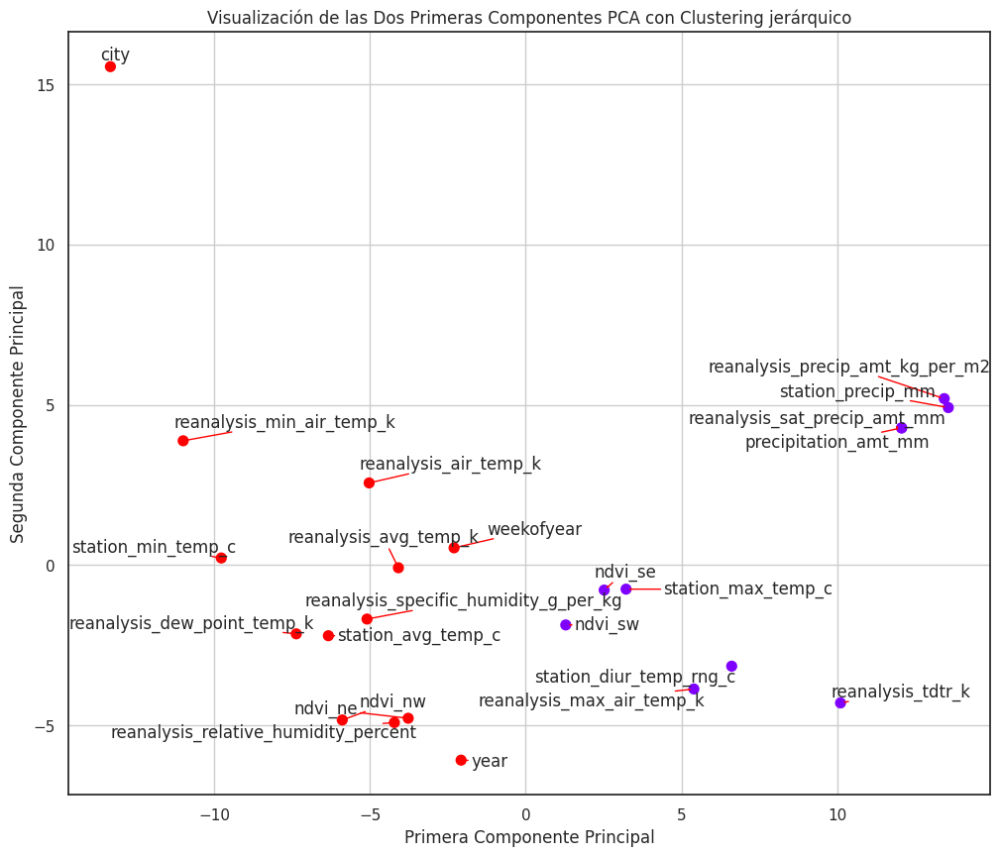

In [ ]:
from adjustText import adjust_text
import matplotlib.pyplot as plt

# Crear el gráfico de dispersión
plt.figure(figsize=(12, 10))
plt.scatter(X_pca_optimal[:, 0], X_pca_optimal[:, 1], c=labels_cj, cmap='rainbow', s=50)

# Añadir etiquetas a cada punto
texts = []
for i, txt in enumerate(names):
    texts.append(plt.text(X_pca_optimal[i, 0], X_pca_optimal[i, 1], txt[:50], ha='right', va='bottom'))

# Ajustar las etiquetas para evitar superposiciones, con flechas rojas apuntando a los puntos
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

# Configurar las etiquetas y el título del gráfico
plt.xlabel('Primera Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Visualización de las Dos Primeras Componentes PCA con Clustering jerárquico')
plt.grid(True)

# Mostrar el gráfico
plt.show()

Tras obtener la gráfica, se puede apreciar que se agrupana variables de contenido similar, como precipitación, temperatura, humedad y los índices NDVI.

#### DBSCAN

Para finalizar, se propone utilizar DBSCAN y comprobar los resultados obtenidos anteriormente. Con este algoritmo se buscará además determinar outliers.

Primero se va a determinar que hiperparámetro de epsilon se puede utilizar

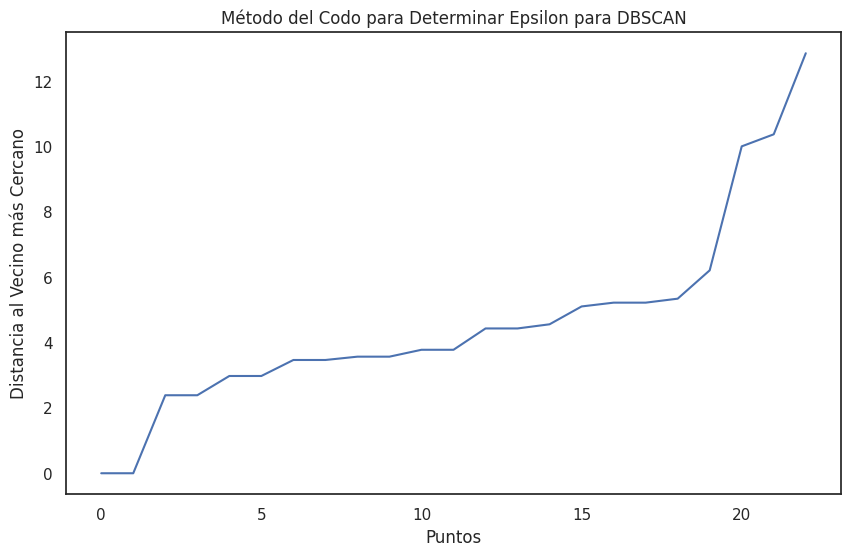

In [ ]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

# Asumiendo que df_feat es tu DataFrame transpuesto y normalizado
minPts = 4

# Utilizamos NearestNeighbors para encontrar la distancia al minPts-ésimo vecino más cercano para cada punto
nbrs = NearestNeighbors(n_neighbors=minPts).fit(train_tt)
distances, indices = nbrs.kneighbors(train_tt)

# La distancia al vecino más cercano (excluyendo a sí mismo) será la segunda distancia más cercana,
# así que organizamos las distancias y tomamos la última columna
distances = np.sort(distances, axis=0)
distances = distances[:,1]

# Graficamos el método del codo para determinar un buen valor de epsilon
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('Método del Codo para Determinar Epsilon para DBSCAN')
plt.xlabel('Puntos')
plt.ylabel('Distancia al Vecino más Cercano')
plt.show()

Se establece que se itere de 3 a 15 para encontrar la mejor opción de epsilon en cuanto a mayor número de outliers

In [ ]:
from sklearn.cluster import DBSCAN

for eps in np.arange(2, 16, 1):
  db = DBSCAN(eps, min_samples=minPts).fit(train_tt)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

#labels

  2.00, 0, 23
  3.00, 0, 23
  4.00, 0, 23
  5.00, 1, 19
  6.00, 3, 7
  7.00, 3, 3
  8.00, 2, 3
  9.00, 2, 3
 10.00, 2, 3
 11.00, 1, 1
 12.00, 1, 1
 13.00, 1, 0
 14.00, 1, 0
 15.00, 1, 0


Por lo tanto, se elige el epsilon de 6, ya que tiene mayor número de clusters y outliers.

In [ ]:
db = DBSCAN(eps=6, min_samples=minPts).fit(train_tt)
labels_db = db.labels_
labels_db

array([-1, -1,  2, -1,  0,  1,  1,  1,  2,  1,  0, -1,  0,  1,  2,  1,  2,
        2,  1,  0, -1, -1, -1])

Ahora se muestran los resultados gráficamente.

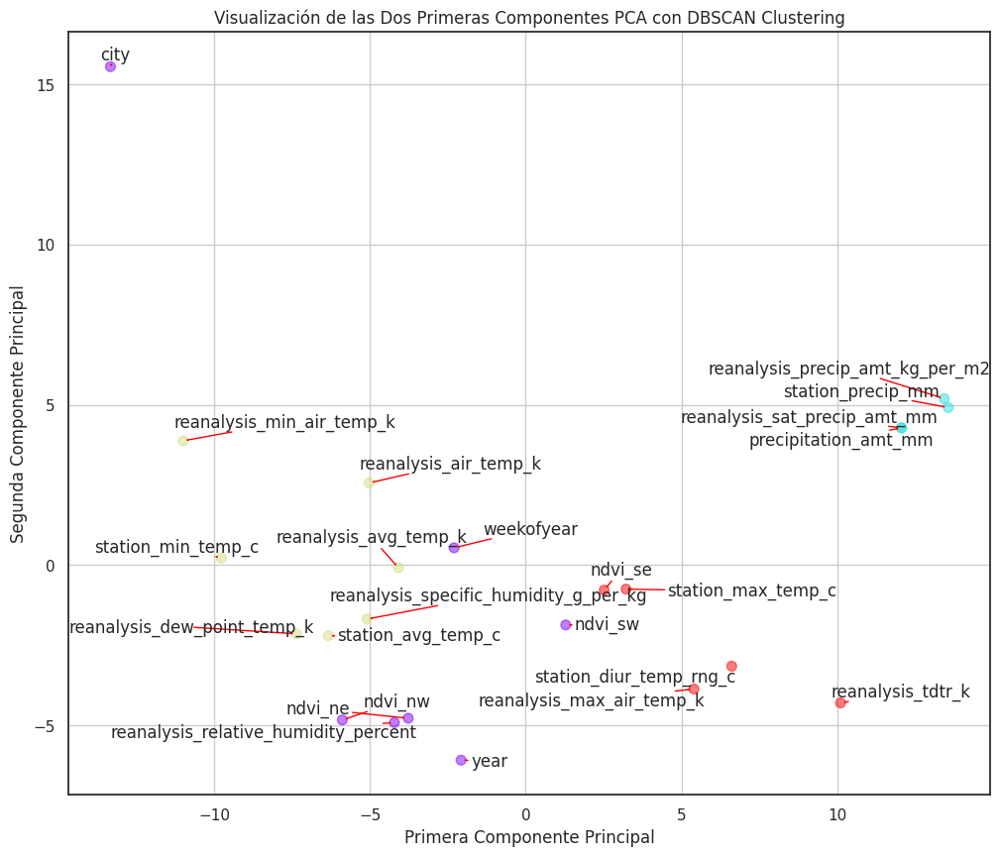

In [ ]:
from adjustText import adjust_text
import matplotlib.pyplot as plt

# Verificación rápida de consistencia
assert len(X_pca_optimal) == len(labels_db), "La longitud de las etiquetas debe coincidir con la cantidad de puntos"

# Crear el gráfico de dispersión
plt.figure(figsize=(12, 10))
plt.scatter(X_pca_optimal[:, 0], X_pca_optimal[:, 1], c=labels_db, cmap='rainbow', s=50, alpha=0.5)

# Añadir etiquetas a cada punto
texts = [plt.text(X_pca_optimal[i, 0], X_pca_optimal[i, 1], txt, ha='right', va='bottom')
         for i, txt in enumerate(names)]

# Ajustar las etiquetas para evitar superposiciones
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

plt.xlabel('Primera Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Visualización de las Dos Primeras Componentes PCA con DBSCAN Clustering')
plt.grid(True)
plt.show()

En este caso se agrupa de manera más específica las variables con contenidos similares, como la temperatura, humedad, precipitación, aunque cabe recalcar que una de las precipitaciones aparece sin grupo, lo cual es un indicio a tomar en cuenta.

Ahora se propone visualizar los outliers detectados por DBSCAN.

In [ ]:
# Se crea una copia del dataset para aumentar un columna del grupo otorgado por DBSCAN
train_db = train_tt.copy()

In [ ]:
train_db['dbscan_group'] = labels_db

# Filtrar las filas donde 'dbscan_group' es igual a -1
filtered_df = train_db[train_db['dbscan_group'] == -1]

# Seleccionar la primera y la última columna de este DataFrame filtrado
result_df = filtered_df.iloc[:, [-1]]

# Mostrar el resultado
print(result_df)

                                      dbscan_group
ndvi_ne                                         -1
ndvi_nw                                         -1
ndvi_sw                                         -1
reanalysis_relative_humidity_percent            -1
year                                            -1
weekofyear                                      -1
city                                            -1


En este caso se puede apreciar que variables como los índices de vegetación no se agrupan, en relación a anteriores resultados, pues, en el contexto de DBSCAN, que una variable sea considerada "ruido" no necesariamente contradice el hecho de que estén correlacionadas. La alta correlación sugiere que estas variables comparten una relación lineal fuerte, pero DBSCAN se enfoca en la densidad espacial. Las variables correlacionadas pueden aún dispersarse en el espacio de manera que no formen un cluster denso según los parámetros especificados para DBSCAN.

## Dataset sin transponer

Ahora se procede a analizar el dataset sin transponer, para analizar características que permitan validar los resutlados de la selección de variables en la sección del dataset transpuesto

### Correlación entre variables

Se realiza un análisis de correlación de las variables, cabe recalcar que a diferencia del primer análisis realizado, esta vez el dataset ya posee una estandarización.

In [ ]:
# Calcular la matriz de correlación
correlation_matrix_t = train_t.corr()

# Crear el heatmap con Plotly Express y truncar los valores a tres decimales
fig = px.imshow(correlation_matrix_t,
                text_auto=".3f",  # Formato para truncar a tres decimales
                aspect="auto",
                color_continuous_scale='RdBu_r',
                labels=dict(color="Coeficiente de Correlación"),
                x=correlation_matrix_t.columns,
                y=correlation_matrix_t.columns)

# Ajustes adicionales (opcional)
fig.update_layout(width=1400, height=1400,
                  title_text='Matriz de Correlación', title_x=0.5,
                  font=dict(size=10))

fig.update_traces(textfont=dict(size=9))

# Mostrar el gráfico
fig.show()

In [ ]:
# Iteración a la matriz de correlación para establecer qué variables tienen alta correlación
high_corr_threshold = 0.7  # Definir el umbral de alta correlación
highly_correlated_pairs = []

for i in range(len(correlation_matrix_t.columns)):
    for j in range(i+1, len(correlation_matrix_t.columns)):  # i+1 para evitar duplicados y la diagonal
        if abs(correlation_matrix_t.iloc[i, j]) > high_corr_threshold:
            highly_correlated_pairs.append((correlation_matrix_t.columns[i], correlation_matrix_t.columns[j], correlation_matrix_t.iloc[i, j]))

# Imprimir los pares de variables altamente correlacionadas
for pair in highly_correlated_pairs:
    print(f"{pair[0]} y {pair[1]} tienen una correlación de {pair[2]:.3f}")

ndvi_ne y ndvi_nw tienen una correlación de 0.832
ndvi_ne y city tienen una correlación de -0.718
ndvi_se y ndvi_sw tienen una correlación de 0.820
precipitation_amt_mm y reanalysis_sat_precip_amt_mm tienen una correlación de 1.000
reanalysis_air_temp_k y reanalysis_avg_temp_k tienen una correlación de 0.901
reanalysis_air_temp_k y reanalysis_min_air_temp_k tienen una correlación de 0.736
reanalysis_air_temp_k y station_min_temp_c tienen una correlación de 0.718
reanalysis_avg_temp_k y station_avg_temp_c tienen una correlación de 0.744
reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg tienen una correlación de 0.997
reanalysis_dew_point_temp_k y station_avg_temp_c tienen una correlación de 0.736
reanalysis_max_air_temp_k y reanalysis_tdtr_k tienen una correlación de 0.919
reanalysis_max_air_temp_k y station_diur_temp_rng_c tienen una correlación de 0.835
reanalysis_max_air_temp_k y station_max_temp_c tienen una correlación de 0.763
reanalysis_max_air_temp_k y city tie

Las correlaciones apreciadas en el primer análisis de correlación se mantienen, se aumentan correlaciones entre las ciudades y las demás variables, esto debido a que se realizó un proceso de onehot encoding, por lo tanto, se propone centrarse en las variables que miden las mismas magnitudes físicas.

### PCA

Ahora se aplicará un análisis PCA, para obtener un resultado previo de los posibles agrupamientos que se pueden obtener.

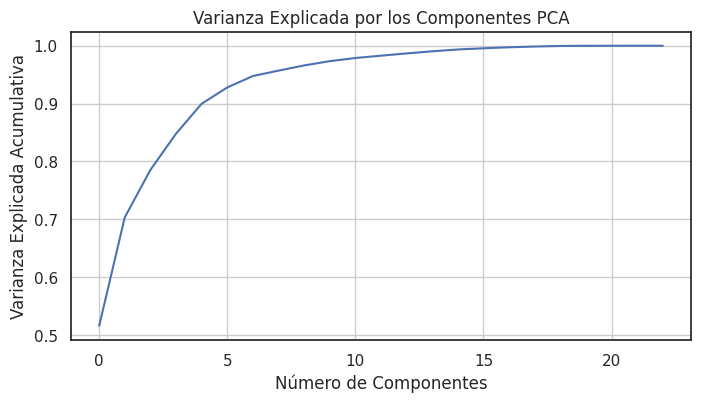

Número de componentes para explicar el 95% de la varianza: 8


In [ ]:
from sklearn.decomposition import PCA

# Primero, determinar cuántos componentes son necesarios para explicar la varianza deseada
pca = PCA().fit(train_t)  # No se especifica n_components para ver la varianza de todos los componentes
explained_var_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
explained_var_cumulative = np.cumsum(explained_var_ratio)

# Graficar la varianza explicada acumulativa para encontrar el "codo"
plt.figure(figsize=(8,4))
plt.plot(explained_var_cumulative)
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.title('Varianza Explicada por los Componentes PCA')
plt.grid(True)
plt.show()

# Identificar el número de componentes para la varianza explicada deseada, por ejemplo, 0.95
n_components = np.argmax(explained_var_cumulative >= 0.95) + 1  # +1 porque los índices en Python empiezan en 0
print(f"Número de componentes para explicar el 95% de la varianza: {n_components}")

Como se puede apreciar, el 95% de la variabilidad se obtiene con 8 componentes principales.

In [ ]:
# Aplicar PCA con el número de componentes seleccionado
pca_optimal = PCA(n_components=n_components)
X_pca_optimal = pca_optimal.fit_transform(train_t)

Ahora se procede a graficar las dos primeras componentes principales.

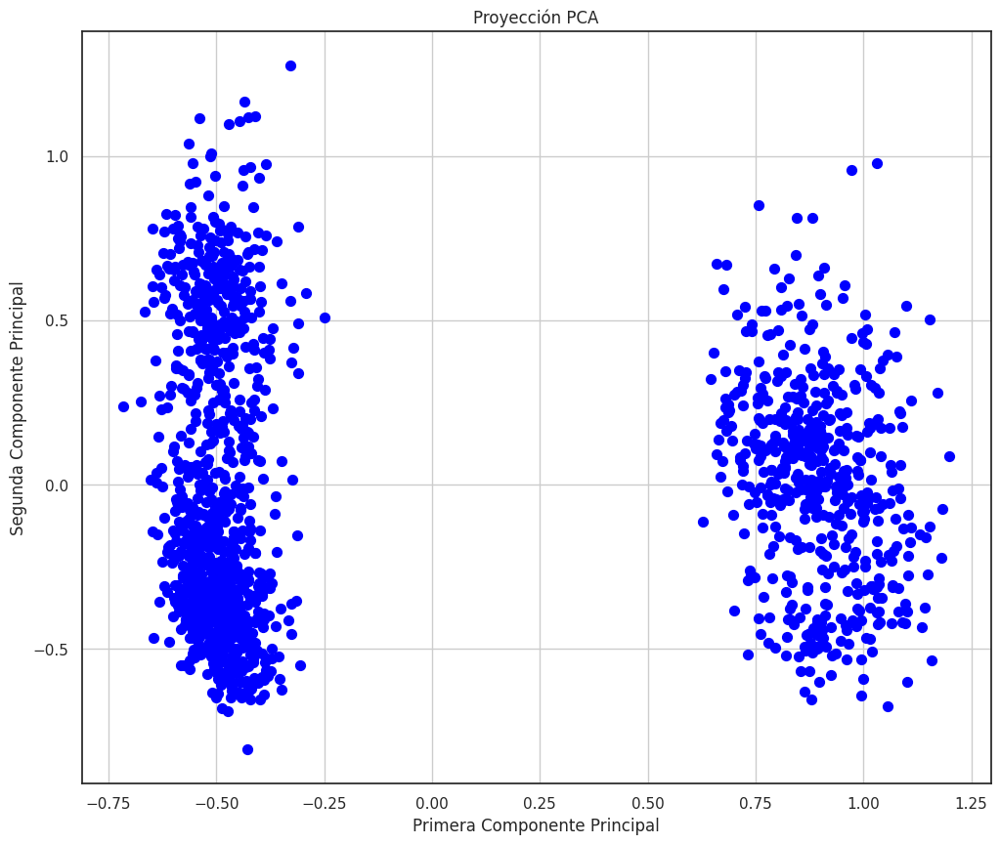

In [ ]:
plt.figure(figsize=(12, 10))
# Aquí, simplemente se asigna un color único a todos los puntos. Por ejemplo, todos los puntos podrían ser azules.
plt.scatter(X_pca_optimal[:, 0], X_pca_optimal[:, 1], color='blue', s=50)

plt.xlabel('Primera Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Proyección PCA')
plt.grid(True)
plt.show()

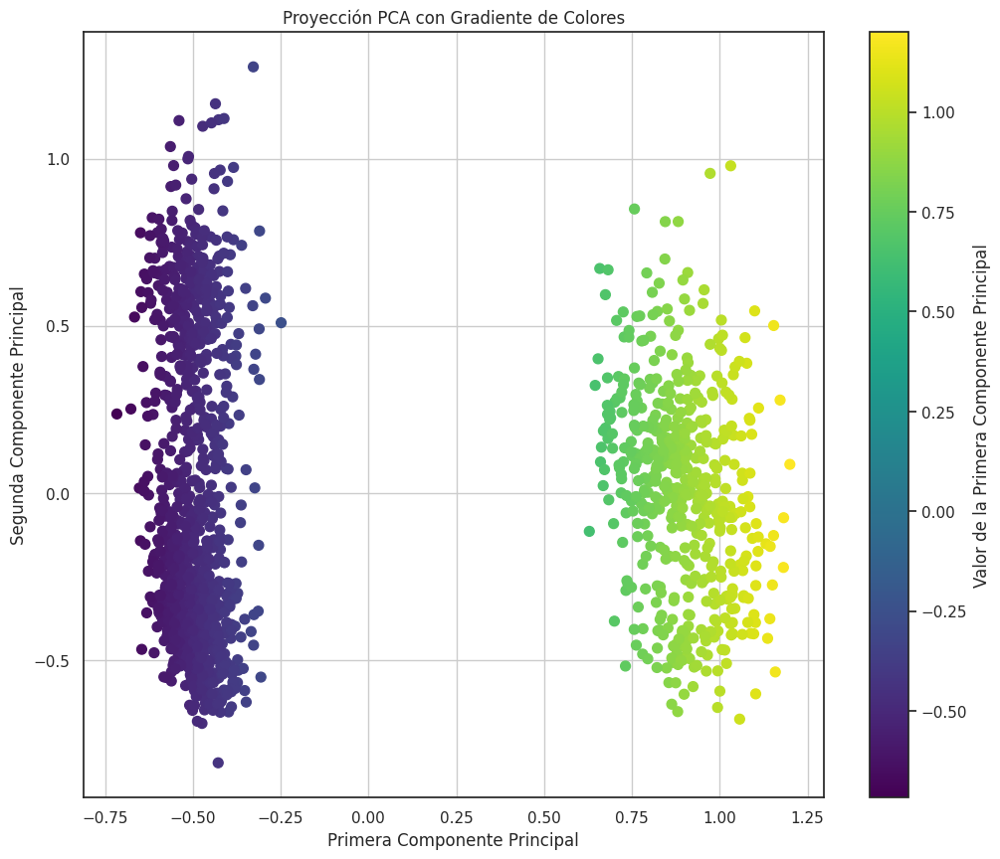

In [ ]:
plt.figure(figsize=(12, 10))
# Usar el valor de la Primera Componente Principal como referencia para el color.
plt.scatter(X_pca_optimal[:, 0], X_pca_optimal[:, 1], c=X_pca_optimal[:, 0], cmap='viridis', s=50)

plt.colorbar(label='Valor de la Primera Componente Principal')  # Añadir barra de colores como leyenda.

plt.xlabel('Primera Componente Principal')
plt.ylabel('Segunda Componente Principal')
plt.title('Proyección PCA con Gradiente de Colores')
plt.grid(True)
plt.show()

Como se puede apreciar, se distinguen dos grupos que se diferencian de cierta manera, podría corresponder con las distintas ciudades de las que se obtuvieron los datos.

Ahora se comprueba la proporción de la varianza que explica cada componente principal, lo que puede dar un indicio, para tratar de reducir la cantidad de componentes en función de un dataset preprocesado que contemple la eliminación de variables redundantes.

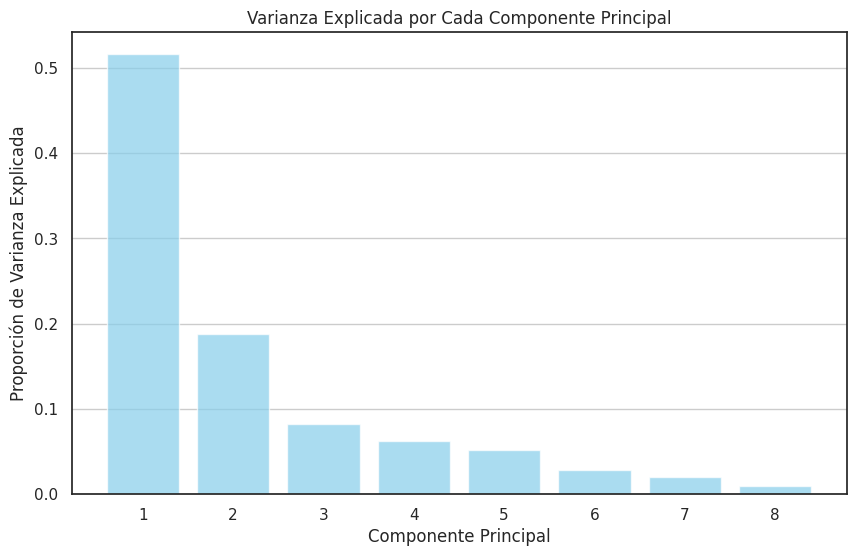

In [ ]:
varianza_por_componente =pca_optimal.explained_variance_ratio_

# Generar el gráfico
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(varianza_por_componente) + 1), varianza_por_componente, alpha=0.7, color='skyblue')
plt.xlabel('Componente Principal')
plt.ylabel('Proporción de Varianza Explicada')
plt.title('Varianza Explicada por Cada Componente Principal')
plt.xticks(range(1, len(varianza_por_componente) + 1))  # Asegura que los ticks del eje X coincidan con el número de componentes
plt.grid(axis='y')
plt.show()


### Clustering jerárquico

  Ahora se va a comprobar a partir de un clustering jerárquico, primero se parte a través de la matriz de similitud.

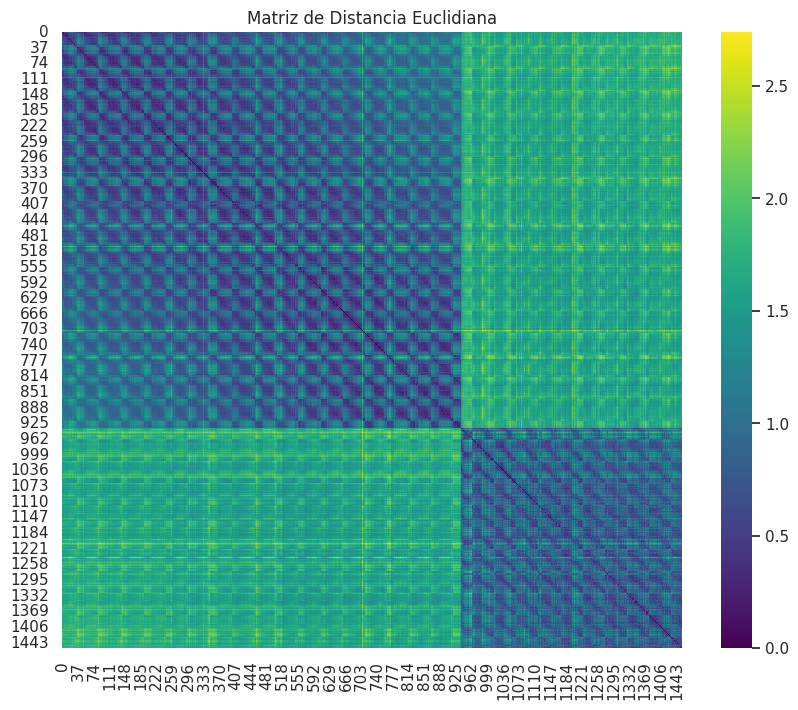

In [ ]:
# Calcular la matriz de distancias euclidianas entre cada par de variables
matdist_2 = pdist(train_t, 'euclidean')
matdist_square_2 = squareform(matdist_2)

# Visualizar la matriz de distancias
sns.set(style="white")
plt.figure(figsize=(10, 8))
ax = sns.heatmap(matdist_square_2, vmin=0, vmax=matdist_square_2.max(), cmap='viridis')
plt.title('Matriz de Distancia Euclidiana')
plt.show()

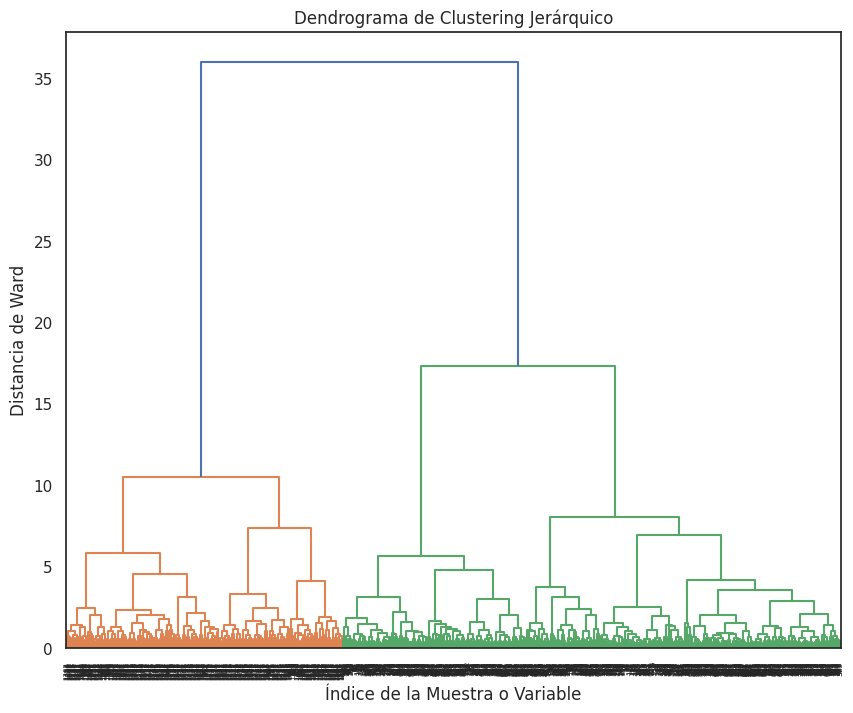

In [ ]:
# Realizar clustering jerárquico usando el enlace Ward
Z = linkage(matdist_2, 'ward')

# Visualizar el dendrograma
plt.figure(figsize=(10, 8))
dendrogram(Z, leaf_rotation=90)
plt.title('Dendrograma de Clustering Jerárquico')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
plt.show()

Como se puede apreciar, el dendograma es extenso, debido a la cantidad de observaciones del dataset, por lo que resulta mejor visualizar un dendograma truncado.

Fuente: Notebook provisto en la materia de Machine Learning 07MBID (1 - Métodos de clustering jerárquico.ipynb)

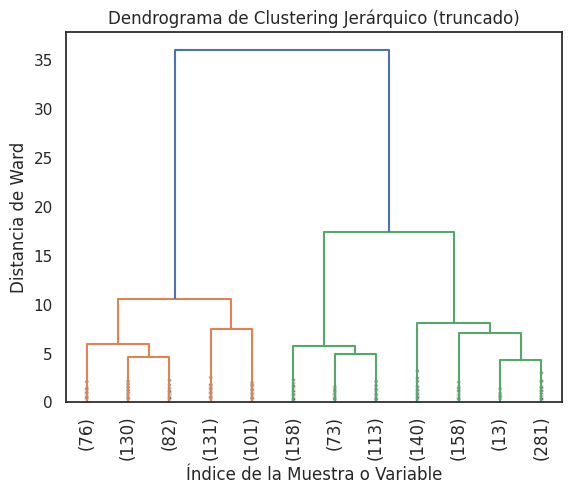

In [ ]:
# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

De esta manera se pueden diferenciar dos grupos al igual que en el análisis PCA.

### DBSCAN

Ahora se procederá a aplicar DBSCAN para corrobar resultados anteriores. En primer lugar, mediante un gráfico de codo, se trata de encontrar el epsilon adecuado para los datos.

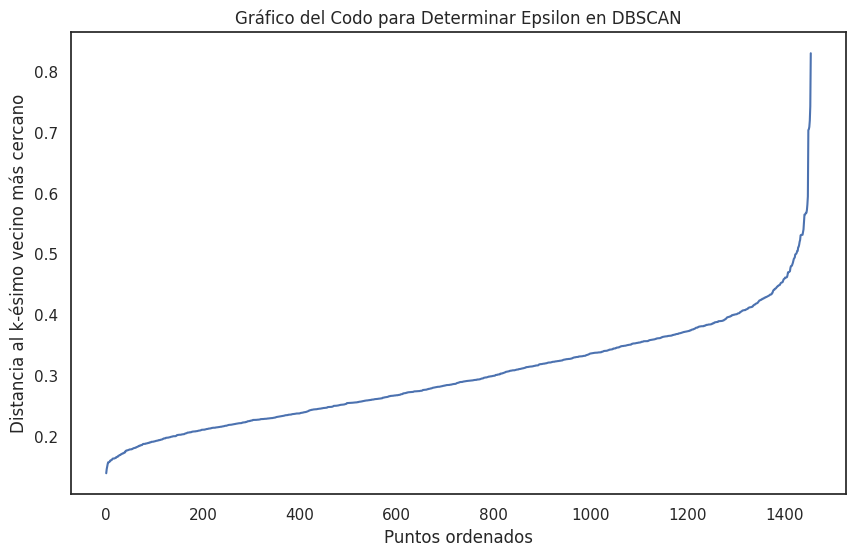

In [ ]:
# Seleccionr k = MinPts - 1, donde MinPts es el número mínimo de puntos que quieres en un cluster
k = 3  # Ejemplo para MinPts = 4

# Inicializar y entrenar NearestNeighbors
neigh = NearestNeighbors(n_neighbors=k)
nbrs = neigh.fit(train_t)
distances, indices = nbrs.kneighbors(train_t)

# Ordenar las distancias
distances = np.sort(distances, axis=0)
distances = distances[:, k-1]  # Nos enfocamos en la distancia al k-ésimo vecino más cercano

# Graficar las distancias para encontrar el "codo"
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("Gráfico del Codo para Determinar Epsilon en DBSCAN")
plt.xlabel("Puntos ordenados")
plt.ylabel("Distancia al k-ésimo vecino más cercano")
plt.show()

En este caso, se establece iterar desde una distancia de 0.3 a 0.6, que es donde se aprecia un cambio en la curva.

In [ ]:
for eps in np.arange(0.3, 0.65, 0.025):
  db = DBSCAN(eps, min_samples=minPts).fit(train_t)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

  0.30, 7, 623
  0.33, 18, 443
  0.35, 4, 309
  0.38, 5, 190
  0.40, 4, 115
  0.43, 2, 71
  0.45, 2, 40
  0.48, 2, 29
  0.50, 2, 20
  0.53, 2, 11
  0.55, 2, 7
  0.58, 2, 6
  0.60, 2, 6
  0.63, 2, 6


Se propone utilizar el epsilon de 0.63 para analizar dos clusters.

In [ ]:
db = DBSCAN(eps=0.63, min_samples=minPts).fit(train_t)
labels_db = db.labels_
labels_db

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
unique_labels = set(labels_db)
unique_labels

{-1, 0, 1}

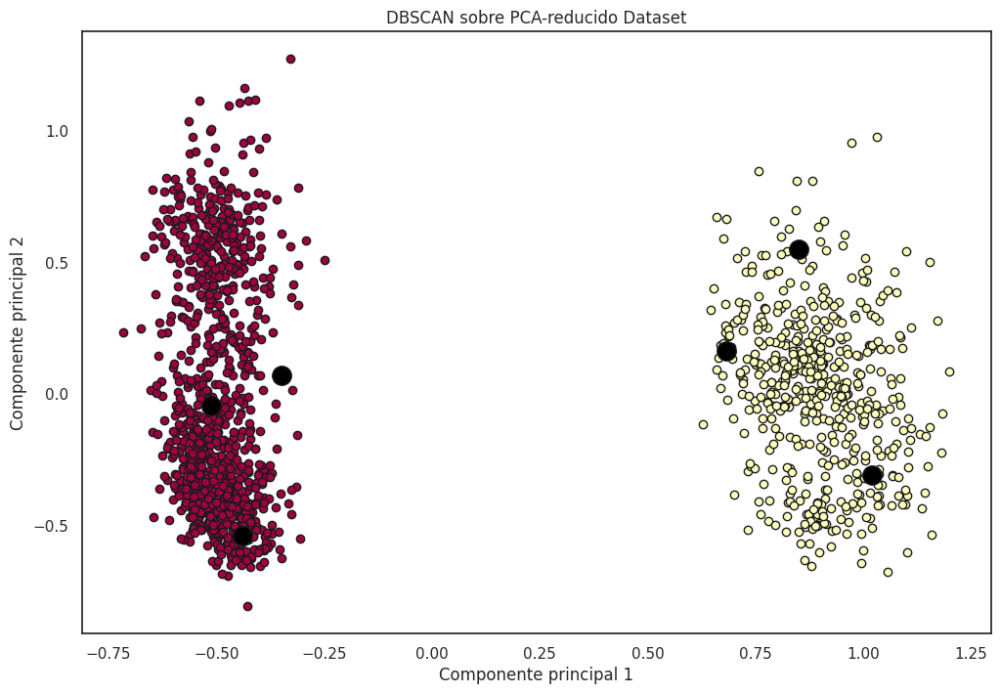

In [ ]:
# Aplicar PCA para reducir la dimensionalidad y poder visualizar los datos en 2D
pca = PCA(n_components=2)
train_t_pca = pca.fit_transform(train_t)

# Crear el gráfico de dispersión con las etiquetas obtenidas por DBSCAN
plt.figure(figsize=(12, 8))
unique_labels = set(labels_db)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Usar negro para outliers.
        col = [0, 0, 0, 1]

    class_member_mask = (labels_db == k)

    xy = train_t_pca[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14 if k == -1 else 6)

plt.title('DBSCAN sobre PCA-reducido Dataset')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.show()

Como se puede apreciar, se diferencian dos clusters marcados, además de otros dos clusters entremezclados entre los dos clusters más grandes. Los puntos negros consiste en outliers detectados.

Ahora se procede a visualizar los outliers detectados.

In [ ]:
# Se crea una copia del dataset para aumentar un columna del grupo otorgado por DBSCAN
train_db = train_t.copy()

In [ ]:
train_db['dbscan_group'] = labels_db

# Filtrar las filas donde 'dbscan_group' es igual a -1
filtered_df = train_db[train_db['dbscan_group'] == -1]

# Seleccionar la primera y la última columna de este DataFrame filtrado
result_df = filtered_df.iloc[:, [-1]]

# Mostrar el resultado
print(result_df)

      dbscan_group
107             -1
675             -1
705             -1
1033            -1
1078            -1
1200            -1


Se puede apreciar, aparece un cantidad moderada de outlieres.

## Análisis de la selección de variables

Tras obtener todos los resultados previos, se tiene que:

**Precipitaciones**

* precipitation_amt_mm y reanalysis_sat_precip_amt_mm tienen una correlación perfecta. Se considera mantener solo una de las dos.

**Variables NDVI**

* ndvi_ne y ndvi_nw tienen alta correlación, así como ndvi_se y ndvi_sw. Se podría plantear una transformación de estas variables.


**Temperatura**

*   reanalysis_air_temp_k, reanalysis_avg_temp_k, y station_avg_temp_c tienen correlaciones significativas entre sí. Se podría elegir una para representar la temperatura promedio.
*   reanalysis_max_air_temp_k y reanalysis_min_air_temp_k tienen correlaciones altas con reanalysis_tdtr_k y station_diur_temp_rng_c, que son indicadores de la variabilidad de la temperatura. Se pued escoger la que mejor represente la variabilidad térmica para tus necesidades.


**Humedad**

*   reanalysis_dew_point_temp_k y reanalysis_specific_humidity_g_per_kg tienen una correlación casi perfecta. Solo se necesitaría una medida de humedad.

**Otros Factores del Clima**

*   Si reanalysis_tdtr_k (rango de temperatura diurna) está correlacionado con
otras medidas de temperatura o con las variables de ciudad, considera su importancia y si agrega valor único al análisis.



### Variables a descartar

Según Islam et al. (2023), se tiene el siguiente cuadro de parámetros a considerar:

![alt_text](https://drive.google.com/uc?export=view?&id=1dqQdrC5KulEtS_Xzr8KdMkQlJyvEADTi)


[Parámetros](https://www.researchgate.net/publication/369294665/figure/tbl1/AS:11431281127264381@1678984452066/Summary-statistics-of-meteorological-parameters-and-daily-Dengue-confirmed-cases-in.png)

In [ ]:
# Se procede a crear una copia del dataset estandarizado y aplicado onehot encoding
train_p = train_t.copy()

### Precipitación total

Como se pudo apreciar, la precipitación total obtenida del PERSIANN satellite y la precipitación total obtenida de NOAA's NCEP, tienen una correlación perfecta, se asumen que son prácticamente las mismas mediciones.

In [ ]:
# Eliminar la columna del dataframe
train_p.drop(['precipitation_amt_mm'], axis=1, inplace=True)

Como se puede apreciar, al tener la misma unidad de medida y las mismas mediciones, se procede a descartar la precipitación total del PERSIANN satellite, a pesar de que posea una mejor resolución espacial de 0.25x0.25 °, es la misma medida obtenida por un satélite con resolución de 0.5x0.5°.

Es importante mencionar, que se mantiene a las variables reanalysis_precip_amt_kg_per_m2  y reanalysis_sat_precip_amt_mm, ya que sus moderadas correlaciones sugieren que capturan aspectos ligeramente diferentes del fenómeno de la precipitación.

### Humedad

Se tiene que, según Islam et al. (2023):

*   reanalysis_dew_point_temp_k (Mean dew point temperature):

    El punto de rocío es una medida directa de la cantidad absoluta de vapor de agua en el aire.
    Proporciona una indicación de la humedad percibida y es un umbral por encima del cual se puede esperar que se forme rocío o niebla, lo cual tiene implicaciones para la comodidad humana, así como para ciertos procesos ecológicos y biológicos.

*   reanalysis_specific_humidity_g_per_kg (Mean specific humidity):
    La humedad específica es la masa de vapor de agua por unidad de masa de aire húmedo (incluyendo el vapor de agua), y es independiente de la temperatura.

    Es una medida conservativa en procesos adiabáticos (sin transferencia de calor) y es particularmente útil en estudios de transporte y mezcla de masas de aire.

Por lo tanto, y acorde al cuadro de parámetros expuesto, se considera utilizar la variable Mean dew point temperature

In [ ]:
# Eliminar la columna del dataframe
train_p.drop(['reanalysis_specific_humidity_g_per_kg'], axis=1, inplace=True)

### Temperatura

Según Liu et al. (2023), se aprecia que existen límites máximos y mínimos de temperatura donde se dan las condiciones idóneas para el vector del dengue, por lo que, se propone descartar las variables que tienen cierta correlación en la temperatura y consisten en los rangos de temperaturas diurnas, tanto para datos satelitales como para los de la estación terrestre. Pues miden la diferencia entre la temperatura máxima y mínima en determinado tiempo el horas de la mañana.

Incluso en análisis previos se logró comprobar que: reanalysis_tdtr_k y station_diur_temp_rng_c tienen una correlación de 0.877


In [ ]:
# Eliminar las columnas del dataframe
train_p.drop(['reanalysis_tdtr_k','station_diur_temp_rng_c'], axis=1, inplace=True)
# train_p.drop(['station_diur_temp_rng_c'], axis=1, inplace=True)

## Creación de Nuevas Características (Feature Engineering):

### Variables consideradas para un promedio

#### NDVI en dirección norte

In [ ]:
# Calcular el promedio del NDVI en dirección norte y almacenarlo en una nueva columna
train_p['ndvi_n'] = train_p[['ndvi_ne', 'ndvi_nw']].mean(axis=1)

# Eliminar las columnas originales del DataFrame
train_p.drop(['ndvi_ne', 'ndvi_nw'], axis=1, inplace=True)

#### NDVI en dirección sur

In [ ]:
# Calcular el promedio del NDVI en dirección sur y almacenarlo en una nueva columna
train_p['ndvi_s'] = train_p[['ndvi_se', 'ndvi_sw']].mean(axis=1)

# Eliminar las columnas originales del DataFrame
train_p.drop(['ndvi_se', 'ndvi_sw'], axis=1, inplace=True)

#### reanalysis_avg_temp_k y reanalysis_avg_temp_k

In [ ]:
# Calcular el promedio de las temperaturas y almacenarlo en una nueva columna
train_p['average_temp_k'] = train_p[['reanalysis_air_temp_k', 'reanalysis_avg_temp_k']].mean(axis=1)

# Eliminar las columnas originales del DataFrame
train_p.drop(['reanalysis_air_temp_k', 'reanalysis_avg_temp_k'], axis=1, inplace=True)


## Análisis del dataset preprocesado

In [ ]:
# Calcular la matriz de correlación
correlation_matrix_p = train_p.corr()

# Crear el heatmap con Plotly Express y truncar los valores a tres decimales
fig = px.imshow(correlation_matrix_p,
                text_auto=".3f",  # Formato para truncar a tres decimales
                aspect="auto",
                color_continuous_scale='RdBu_r',
                labels=dict(color="Coeficiente de Correlación"),
                x=correlation_matrix_p.columns,
                y=correlation_matrix_p.columns)

# Ajustes adicionales (opcional)
fig.update_layout(width=1400, height=1400,
                  title_text='Matriz de Correlación', title_x=0.5,
                  font=dict(size=10))

fig.update_traces(textfont=dict(size=9))

# Mostrar el gráfico
fig.show()

## Análisis Univariante

Se procede a realizar un análisis univariante del dataset preprocesado propuesto, se enfoca en verificar la distribución de las variables consideradas.

In [ ]:
# Visualizar el tipo de datos de cada variable
train_p.dtypes

reanalysis_dew_point_temp_k             float64
reanalysis_max_air_temp_k               float64
reanalysis_min_air_temp_k               float64
reanalysis_precip_amt_kg_per_m2         float64
reanalysis_relative_humidity_percent    float64
reanalysis_sat_precip_amt_mm            float64
station_avg_temp_c                      float64
station_max_temp_c                      float64
station_min_temp_c                      float64
station_precip_mm                       float64
year                                    float64
weekofyear                              float64
city                                      int64
ndvi_n                                  float64
ndvi_s                                  float64
average_temp_k                          float64
dtype: object

### Análisis de la distribución de los datos de NDVI

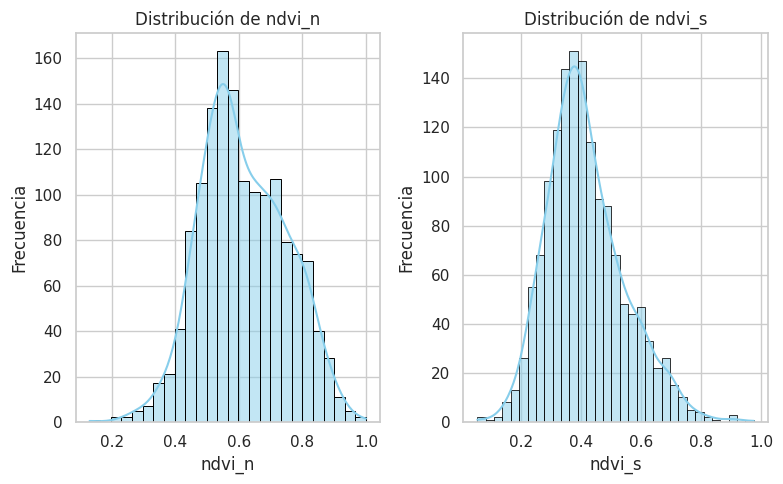

In [ ]:
# Lista de variables NDVI
variables_ndvi = ['ndvi_n', 'ndvi_s']

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables NDVI y crear un gráfico para cada una
for ax, var in zip(axes, variables_ndvi):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train_p[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

Como se puede apreciar la distibución de las variables creadas, tienen una similitud con una distribución normal.

### Análisis de la distribución de las variables climáticas de NOAA

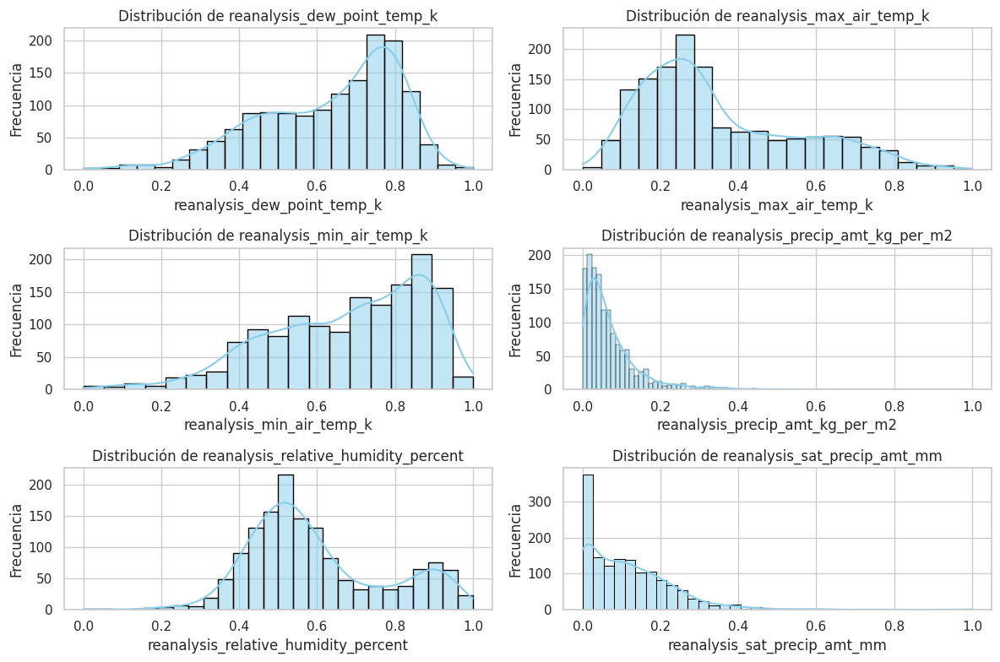

In [ ]:
# Lista de variables de reanálisis
variables_reanalysis = [
    'reanalysis_dew_point_temp_k',
'reanalysis_max_air_temp_k',
'reanalysis_min_air_temp_k',
'reanalysis_precip_amt_kg_per_m2',
'reanalysis_relative_humidity_percent',
'reanalysis_sat_precip_amt_mm']

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(3, 2, figsize=(12, 8))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables reanalysis y crear un gráfico para cada una
for ax, var in zip(axes, variables_reanalysis):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train_p[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

En cuanto, a estas variables se puede apreciar que mantienen su comportamiento.

### Análisis de la distribución de la variable average_temp_k


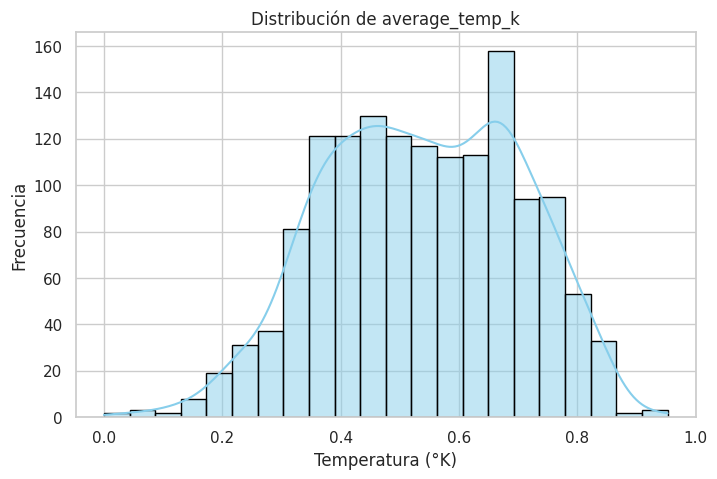

In [ ]:
# Configurando el tamaño de la figura para el gráfico
plt.figure(figsize=(8, 5))

# Creación del histograma con la línea de densidad
sns.histplot(train_p['average_temp_k'], kde=True, color='skyblue', edgecolor='black')

# Añadiendo títulos y etiquetas
plt.title('Distribución de average_temp_k')
plt.xlabel('Temperatura (°K)')
plt.ylabel('Frecuencia')

# Mostrar el gráfico
plt.show()

En cuanto a la variable creada de las temperaturas promedio, se tiene una distribución,

### Análisis de la distribución de las variables de datos climáticos diarios

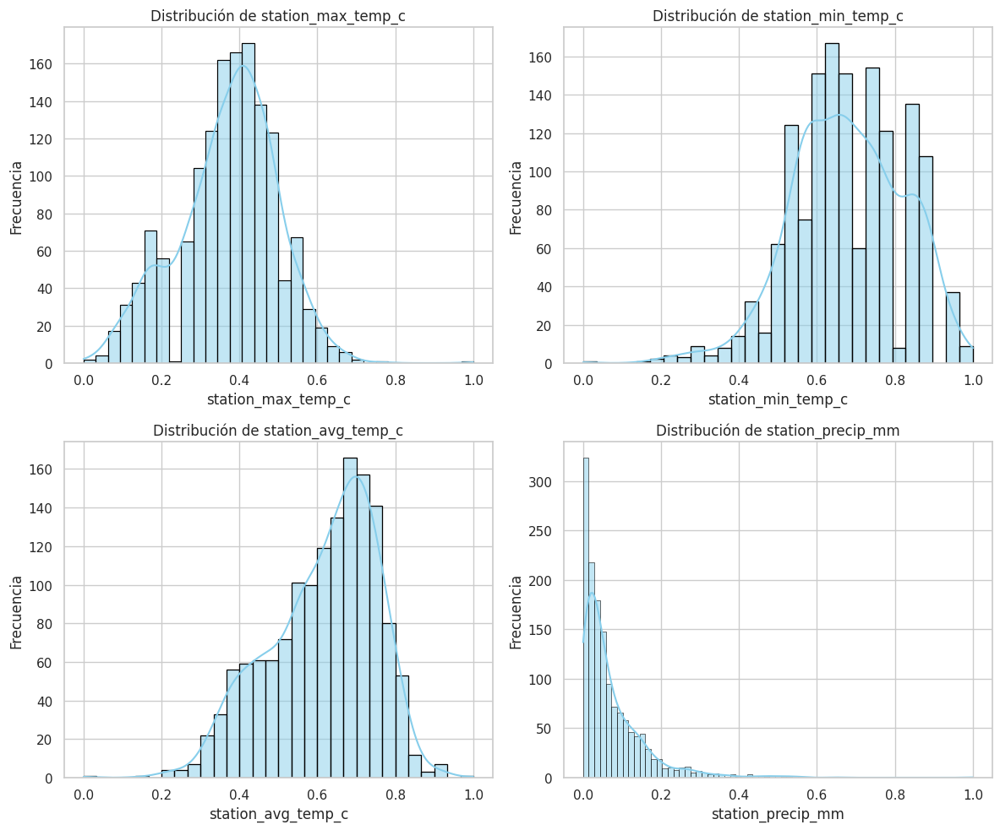

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lista de variables NDVI
variables_daily = ['station_max_temp_c', 'station_min_temp_c', 'station_avg_temp_c', 'station_precip_mm']

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear una figura con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Aplanar el array de ejes para facilitar la iteración
axes = axes.flatten()

# Iterar sobre las variables daily y crear un gráfico para cada una
for ax, var in zip(axes, variables_daily):
    # Gráfico de histograma con línea de densidad para cada variable NDVI
    sns.histplot(train_p[var], kde=True, ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Distribución de {var}')
    ax.set_xlabel(var)
    ax.set_ylabel('Frecuencia')

# Ajustar el layout para evitar la superposición de gráficos
plt.tight_layout()
plt.show()

Se mantiene el mismo comportamiento de estas variables, debido a que solo se realizó una estandarización.

Por lo tanto, tras el análisis de correlación y una breve inspección de las distribuciones de las variables, se propone utilizar este primer dataset para emplear algortimos de clustering.

## Propuesta de un segundo dataset

Se propone utilizar un segundo dataset, en el que se considere únicamente las variables provenientes del satélite, debido a que como se pudo apreciar tanto en el análisis de valores nulos, outliers y distribución, son variables que poseen mayor completitud que las captadas por la estación terrestre, pero es importante tener en cuenta que:


*  Resolución Espacial y Temporal:
    Los datos de satélite a menudo tienen una cobertura más amplia y pueden ser útiles para estudios a gran escala o en áreas donde las estaciones terrestres son escasas.
    Las estaciones terrestres proporcionan mediciones más localizadas y pueden ser más precisas para un área específica, especialmente si el estudio se centra en una región más pequeña o si la densidad de la red de estaciones es alta.
*   Calidad y Precisión de los Datos:
    Los datos de satélite pueden estar sujetos a diferentes tipos de errores y pueden requerir calibraciones más complejas.
    Las estaciones terrestres suelen proporcionar mediciones más directas y precisas de las condiciones locales.

También a partir de la misma consideración mencionada, se propone utilizar solo un índice NDVI, el de la dirección sur, debido a que en la dirección norte, se imputaron más datos, además de la presencia de outliers.

Por otro lado, se propone también, el utilizar solo una variable temporal, que en este caso es el año.







Se propone comprobar la diferencia entre las mediciones de las distintas fuentes.

In [ ]:
# Se realiza una copia del dataset para comprobar
train_p_prueba = train.copy()

In [ ]:
# Se transforma la variable del primedio de temperatura de °K a °C
train_p_prueba['average_temp_c'] = train_p_prueba['reanalysis_avg_temp_k'] - 273.15

In [ ]:
# Se calcula el Error medio abosulto de estas variables que representan la misma magnitud
from sklearn.metrics import mean_absolute_error

mae = mean_absolute_error(train_p_prueba['average_temp_c'], train_p_prueba['station_avg_temp_c'])

print("El MAE es:", mae)

El MAE es: 1.1847044950281398


Como se puede apreciar, la diferencia entre las mediciones del satélite y la estación terrestre no son considerables, por lo que, se propone analizar si las medidas del satélite proporcionan mejores resultados.

In [ ]:
# Se realiza una copia del dataset preprocesado
train_pp = train_p.copy()

In [ ]:
train_pp.dtypes

reanalysis_dew_point_temp_k             float64
reanalysis_max_air_temp_k               float64
reanalysis_min_air_temp_k               float64
reanalysis_precip_amt_kg_per_m2         float64
reanalysis_relative_humidity_percent    float64
reanalysis_sat_precip_amt_mm            float64
station_avg_temp_c                      float64
station_max_temp_c                      float64
station_min_temp_c                      float64
station_precip_mm                       float64
year                                    float64
weekofyear                              float64
city                                      int64
ndvi_n                                  float64
ndvi_s                                  float64
average_temp_k                          float64
dtype: object

** Cabe mencionar que también se comprobó si las mediciones terrestres directas, dan mejor resultado, pero se obtuvieron métricas menores comparadas con el uso de variables satelitales.

In [ ]:
# Se eliminan las variables del satélite correspondientes a la temperatura y la precipitación en mm
#train_pp.drop(['reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_sat_precip_amt_mm','average_temp_k', 'station_avg_temp_c',
 #              'reanalysis_precip_amt_kg_per_m2','reanalysis_tdtr_k', 'ndvi_n'], axis=1, inplace=True)

In [ ]:
# Se eliminan las variables del satélite correspondientes a la temperatura y la precipitación en mm
train_pp.drop(['station_avg_temp_c', 'station_max_temp_c', 'station_min_temp_c','station_precip_mm', 'ndvi_n','weekofyear'], axis=1, inplace=True)

In [ ]:
train_pp.dtypes

reanalysis_dew_point_temp_k             float64
reanalysis_max_air_temp_k               float64
reanalysis_min_air_temp_k               float64
reanalysis_precip_amt_kg_per_m2         float64
reanalysis_relative_humidity_percent    float64
reanalysis_sat_precip_amt_mm            float64
year                                    float64
city                                      int64
ndvi_s                                  float64
average_temp_k                          float64
dtype: object

In [ ]:
train_pp.shape

(1456, 10)

De esta manera, se propone aplicar los algoritmos de clustering a los dos datasets propuestos.

---
# Clustering
---

## Dataset propuesto 1

Se realiza un análisis al dataset preprocesado propuesto. También se propone utilizar un análisis de componenetes principales como input de los algoritmos, en primera instancia se realiza un t-SNE para analizar su factibilidad.

### PCA

Se aplica un PCA al dataset.

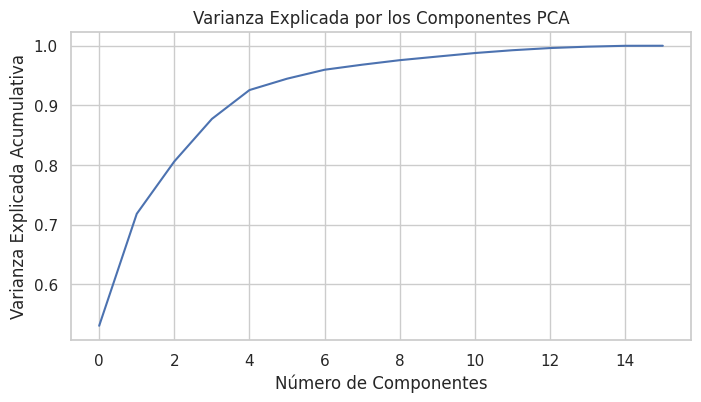

Número de componentes para explicar el 95% de la varianza: 7


In [ ]:
# Primero, determinar cuántos componentes son necesarios para explicar la varianza deseada
pca = PCA().fit(train_p)  # No se especifica n_components para ver la varianza de todos los componentes
explained_var_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
explained_var_cumulative = np.cumsum(explained_var_ratio)

# Graficar la varianza explicada acumulativa para encontrar el "codo"
plt.figure(figsize=(8,4))
plt.plot(explained_var_cumulative)
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.title('Varianza Explicada por los Componentes PCA')
plt.grid(True)
plt.show()

# Identificar el número de componentes para la varianza explicada deseada, por ejemplo, 0.95
n_components = np.argmax(explained_var_cumulative >= 0.95) + 1  # +1 porque los índices en Python empiezan en 0
print(f"Número de componentes para explicar el 95% de la varianza: {n_components}")

Como se puede apreciar se logra explicar el 95% de la varianza con 7 componentes principales.

In [ ]:
# Aplicar PCA con el número de componentes seleccionado
pca_optimal = PCA(n_components=n_components)
X_pca_optimal_1 = pca_optimal.fit_transform(train_p)

Se procede a graficar

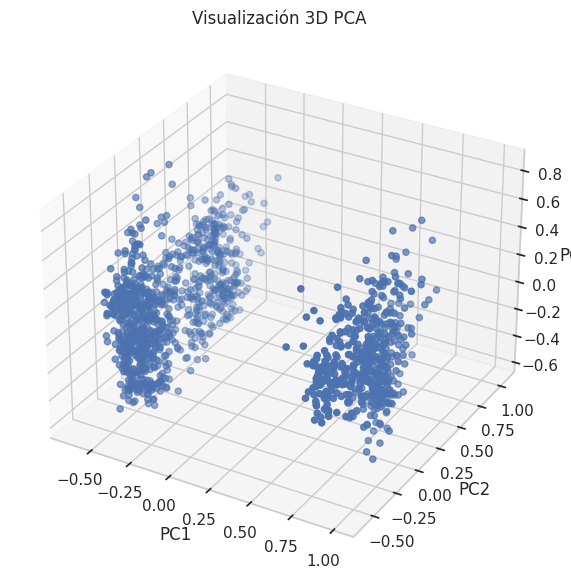

In [ ]:
# Creación de la figura para graficar
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Extracción de las componentes principales
x = X_pca_optimal_1[:, 0]
y = X_pca_optimal_1[:, 1]
z = X_pca_optimal_1[:, 2]

# Graficación
ax.scatter(x, y, z)
ax.set_title('Visualización 3D PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

t-SNE

Primero se encuentra el número de clusters a realizar, mediante una gráfica del método del codo.

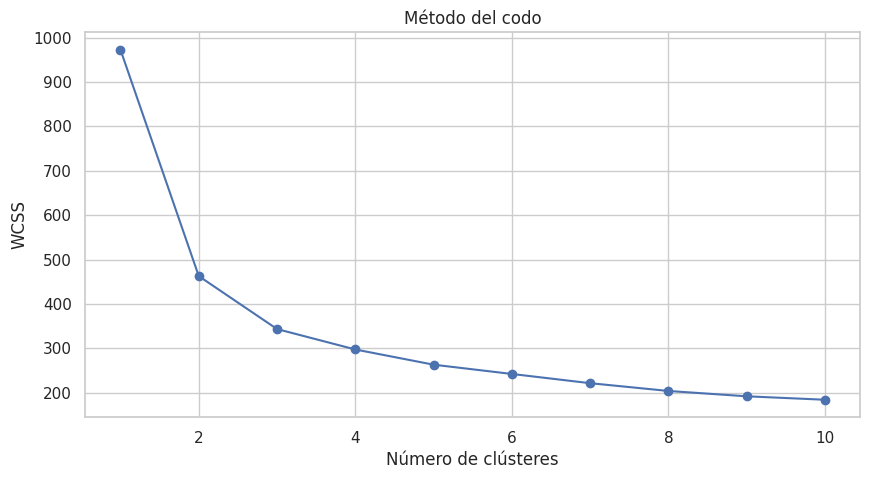

In [ ]:
# Método del codo para encontrar el número óptimo de clústeres
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):  # Asumiendo que queremos probar de 1 a 10 clústeres
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(train_p)
    wcss.append(kmeans.inertia_)

# Graficar los resultados del método del codo
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Método del codo')
plt.xlabel('Número de clústeres')
plt.ylabel('WCSS')
plt.show()

Se visualiza que 2 es el número de clusters donde empieza  a disminuir más lentamente.

In [ ]:
from sklearn.manifold import TSNE

# Aplicar t-SNE al dataset escalado
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(train_p)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1456 samples in 0.001s...
[t-SNE] Computed neighbors for 1456 samples in 0.069s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1456
[t-SNE] Computed conditional probabilities for sample 1456 / 1456
[t-SNE] Mean sigma: 0.163535
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.540436
[t-SNE] KL divergence after 300 iterations: 1.078777


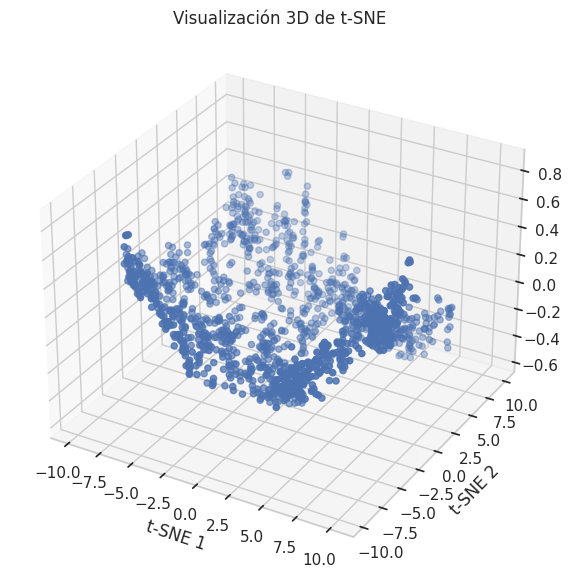

In [ ]:
# Crear el gráfico 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Extraer las componentes
x = tsne_results[:, 0]
y = tsne_results[:, 1]
#z = tsne_results[:, 2]

# Graficar
ax.scatter(x, y, z)

ax.set_title('Visualización 3D de t-SNE')
ax.set_xlabel('t-SNE 1')
ax.set_ylabel('t-SNE 2')
#ax.set_zlabel('t-SNE 3')

plt.show()

Como se puede visualizar en la gráfica del t-SNE, no se logran separar los grupos como a diferencia del PCA, por lo que, se propone utilizar este último análisis.

### Clustering jerárquico

Para este método se propone utilizar un método de búsqueda del mejor método, debido a que, aplicar un método de búsqueda como GridSearch directamente sobre clustering jerárquico no es tan directo como con otros algoritmos de machine learning, especialmente aquellos utilizados para tareas supervisadas. Esto se debe a que el clustering jerárquico no tiene un "modelo" en el sentido convencional que se entrena con un conjunto de parámetros que pueden ser ajustados de manera iterativa para mejorar el rendimiento basado en una métrica de evaluación.

#### Dataset preprocesado

In [ ]:
# Calcular la matriz de distancias euclidianas entre cada par de variables
matdist_3 = pdist(train_p, 'euclidean')

In [ ]:
from scipy.cluster.hierarchy import linkage, fcluster, cophenet
from scipy.spatial.distance import pdist

linkage_methods = ['ward', 'complete', 'average', 'single']
best_cophenetic_corr = -1
best_method = ''

for method in linkage_methods:
    # Realizar clustering jerárquico
    Z = linkage(matdist_3, method=method)
    # Calcular el coeficiente de correlación cofenético
    cophenetic_corr, coph_dist = cophenet(Z, matdist_3)

    print(f"Método: {method}, Coeficiente de Correlación Cofenético: {cophenetic_corr}")

    if cophenetic_corr > best_cophenetic_corr:
        best_cophenetic_corr = cophenetic_corr
        best_method = method

print(f'\nEl mejor método es: {best_method} con un Coeficiente de Correlación Cofenético de: {best_cophenetic_corr}')


Método: ward, Coeficiente de Correlación Cofenético: 0.9043401990875749
Método: complete, Coeficiente de Correlación Cofenético: 0.8433645193973969
Método: average, Coeficiente de Correlación Cofenético: 0.9203103878287165
Método: single, Coeficiente de Correlación Cofenético: 0.8636344316693197

El mejor método es: average con un Coeficiente de Correlación Cofenético de: 0.9203103878287165


Por lo tanto, se elige al método average para obtener el clustering jerárquico.

In [ ]:
# Realizar clustering jerárquico
Z = linkage(matdist_3 , method= 'average')
# Obtener etiquetas de clúster a un cierto nivel de corte, por ejemplo, formando 2 clústeres
labels = fcluster(Z, t=2, criterion='maxclust')

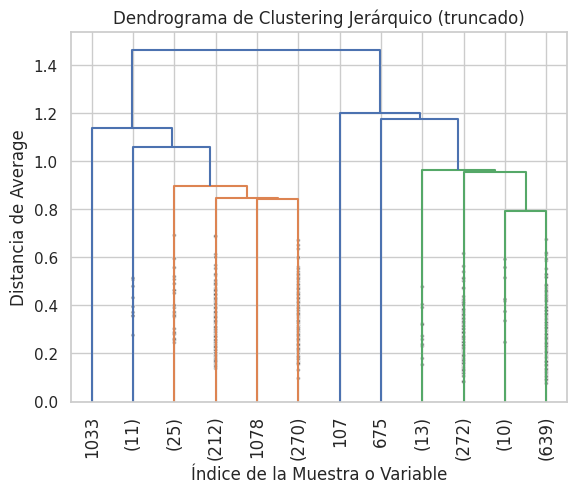

In [ ]:
# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Average')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

Como se puede visualizar, en el dendongrama, a pesar de de obtener la mejor métrica, el método propuesto, no permite apreciar grupos bien definidos, dadas las particularidades encontradas anteriormente, por lo tanto, se constató que el método Ward, proporciona un mejor resultado, a pesar de su métrica, en cuanto a la obtención de clusters diferenciados.

Esto es debido a que, el método de Ward busca minimizar la varianza dentro de cada clúster en cada paso de la agrupación.

In [ ]:
# Realizar clustering jerárquico
Z = linkage(matdist_3 , method= 'ward')
# Obtener etiquetas de clúster a un cierto nivel de corte, por ejemplo, formando 2 clústeres
labels = fcluster(Z, t=2, criterion='maxclust')

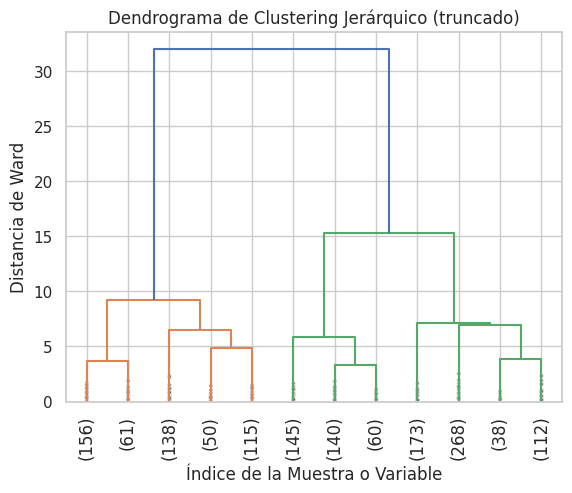

In [ ]:
# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

Se procede a sacar la métrica silhoette

In [ ]:
from sklearn.metrics import silhouette_score

# Obtener las etiquetas de clúster para los datos.
from scipy.cluster.hierarchy import fcluster
# Definir el número de clusters, se elige que sean 2 clusters
k = 2
clusters = fcluster(Z, k, criterion='maxclust')

# Calcular el índice de silueta
silhouette_avg = silhouette_score(train_p, clusters)
print("Para n_clusters =", k, "El promedio del índice de silueta es:", silhouette_avg)

Para n_clusters = 2 El promedio del índice de silueta es: 0.48608141879179395


Un índice de silueta de aproximadamente 0.48 para dos clústeres sugiere que, aunque hay cierta estructura en los datos que justifica la agrupación, la separación entre los clústeres no es muy fuerte. El valor está lejos de ser cercano a 1, lo cual sugeriría clústeres muy compactos y bien separados.


Se propone utilizar:
Coeficiente de Calinski-Harabasz, también conocido como la puntuación de varianza entre grupos. Este coeficiente es una medida de la dispersión entre los clústeres comparada con la dispersión dentro de los clústeres. Un valor más alto generalmente indica que los clústeres están bien separados y son densos, lo cual es deseable.

El Coeficiente de Calinski-Harabasz se calcula como la razón entre la suma de la varianza entre clústeres y la suma de la varianza dentro de los clústeres, multiplicado por un factor que toma en cuenta el número de clústeres y el número de muestras.

In [ ]:
# Calcular el Coeficiente de Calinski-Harabasz
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz = calinski_harabasz_score(train_p, clusters)

print("Para n_clusters =", k, "el Coeficiente de Calinski-Harabasz es:", calinski_harabasz)

Para n_clusters = 2 el Coeficiente de Calinski-Harabasz es: 1602.4000876176171


Un Coeficiente de Calinski-Harabasz de aproximadamente 1602.40 para dos clústeres indica que la separación entre los clústeres es relativamente buena en comparación con la cohesión dentro de los clústeres.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Decidir el número de clústeres
n_clusters = 2

# Crear el modelo de clustering aglomerativo
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')

# Ajustar el modelo y predecir clústeres
agg_cluster_labels = agg_clustering.fit_predict(train_p)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Índice de Silueta
silhouette_avg = silhouette_score(train_p, agg_cluster_labels)
print("Para n_clusters =", n_clusters, "El promedio del índice de silueta es:", silhouette_avg)

# Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(train_p, agg_cluster_labels)
print("Para n_clusters =", n_clusters, "el Coeficiente de Calinski-Harabasz es:", calinski_harabasz)


Para n_clusters = 2 El promedio del índice de silueta es: 0.48608141879179395
Para n_clusters = 2 el Coeficiente de Calinski-Harabasz es: 1602.4000876176171


Se procede a graficar

In [ ]:
import plotly.graph_objects as go

# Crear una figura interactiva 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

# Agregar los puntos del PCA al gráfico, coloreados por etiquetas de clúster
for i in range(k):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [clusters== i+1, 0],
        y=X_pca_optimal_1 [clusters == i+1, 1],
        z=X_pca_optimal_1 [clusters == i+1, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)]),
        name=f'Cluster {i+1}'
    ))

# Configurar los títulos de los ejes y el título del gráfico
fig.update_layout(
    title='Clustering Jerárquico sobre PCA (Interactivo)',
    scene = dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

De esta manera se puede apreciar que exisetn dos clusters marcados.

#### Dataset aplicado PCA

Ahora se procede utilizar el PCA como input.

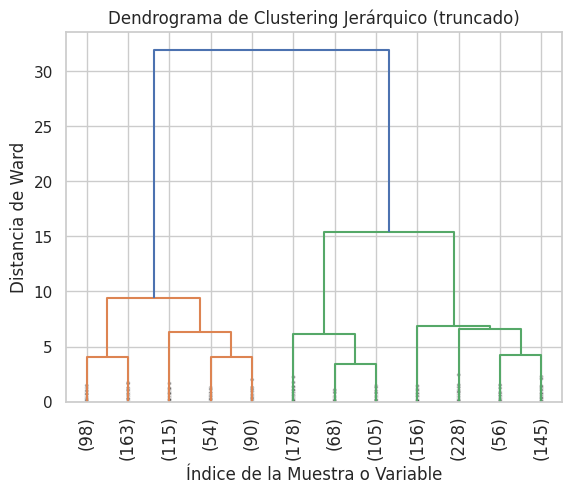

In [ ]:
Z = linkage(X_pca_optimal_1 , method='ward')

# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

In [ ]:
# Obtener las etiquetas
k = 2  # Número deseado de clústeres
cluster_labels = fcluster(Z, k, criterion='maxclust')

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_1 , cluster_labels)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_1 , cluster_labels)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)

El promedio del índice de silueta para los clústeres es: 0.5063457969749113
El Coeficiente de Calinski-Harabasz para los clústeres es: 1750.2946624604979


In [ ]:
# Crear un gráfico 3D interactivo con Plotly
fig = go.Figure()

# Colores para los clústeres, ajusta la cantidad de colores según tus clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in set(cluster_labels):
    # Filtrar datos por etiqueta de clúster
    idx = cluster_labels == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [idx, 0],
        y=X_pca_optimal_1 [idx, 1],
        z=X_pca_optimal_1 [idx, 2],
        mode='markers',
        marker=dict(size=5, color=colors[i % len(colors)]),  # Ajusta el tamaño y color del marcador
        name=f'Cluster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=dict(
        xaxis=dict(title='PC1'),
        yaxis=dict(title='PC2'),
        zaxis=dict(title='PC3'),
    )
)

# Mostrar el gráfico
fig.show()

Como se puede apreciar, el utilizar PCA como input del modelo, mejora ligeramente las métricas utilizadas para evaluar los modelos.

### K-means

Ahora se procede a probar algoritmos de clustering basados en particiones.

Para algoritmos como K-Means, es factible y común utilizar técnicas como GridSearch para optimizar hiperparámetros, en particular el número de clústeres
k.

Sin embargo, para K-Means, el uso directo de GridSearchCV de scikit-learn puede no ser tan directo debido a que K-Means no es un algoritmo de aprendizaje supervisado y GridSearchCV está diseñado principalmente para optimizar hiperparámetros de modelos supervisados basados en métricas de validación cruzada.

Aun así, se puede explorar el número óptimo de clústeres k para K-Means al utilizar un enfoque similar al GridSearch, que permite probar diferentes valores de k y evaluar los resultados con métricas como el método del codo, el coeficiente de silueta.

#### Dataset preprocesado

Se procede a evaluar el número óptimo de clusters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

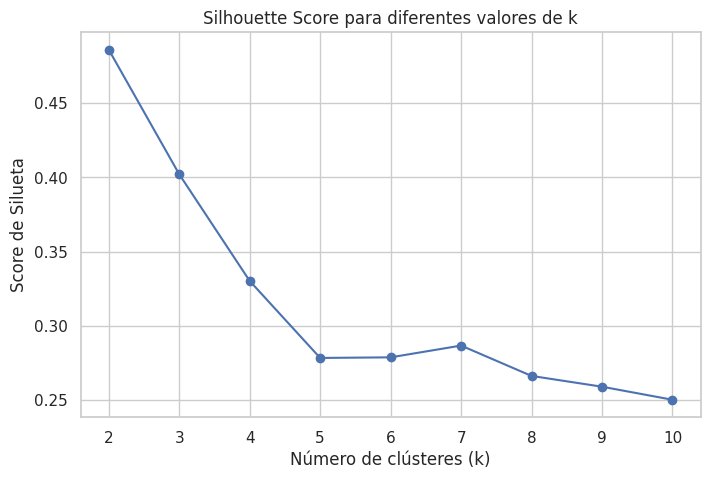

El número óptimo de clústeres es: 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Rango de valores de 'k'
k_values = range(2, 11)

# Lista para almacenar los scores de silueta para cada 'k'
silhouette_scores = []

# Probar diferentes valores de 'k'
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(train_p)
    labels = kmeans.labels_
    silhouette = silhouette_score(train_p, labels)
    silhouette_scores.append(silhouette)

# Graficar los resultados
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score para diferentes valores de k')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Score de Silueta')
plt.show()

# Identificar el 'k' con el mayor score de silueta
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"El número óptimo de clústeres es: {optimal_k}")

El coeficiente de silueta mide qué tan similar es un objeto a su propio clúster comparado con otros clústeres, por lo que un valor más alto generalmente indica un modelo de clustering más adecuado. Por lo tanto, el número de clusters sería 2.

Ahora se procede a graficar el resultado.

In [ ]:
# Aplicar K-Means con el número óptimo de clústeres encontrado
optimal_k = 2  # Reemplaza esto con el valor que encontraste como óptimo
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(train_p)
labels_k = kmeans.labels_

# Crear figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres, ajusta la lista de colores si tienes más de 3 clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in range(optimal_k):
    # Filtrar datos por clúster
    idx = labels_k == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [idx, 0], y=X_pca_optimal_1 [idx, 1], z=X_pca_optimal_1 [idx, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i+1}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Clustering K-Means sobre PCA',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Se obtienen las métricas a evaluar.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(train_p, labels_k)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(train_p, labels_k)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)


El promedio del índice de silueta para los clústeres es: 0.48608141879179395
El Coeficiente de Calinski-Harabasz para los clústeres es: 1602.4000876176171


Índice de Silueta de 0.486: Este valor está en el rango positivo, lo que sugiere que, en promedio, los puntos están más cerca de otros puntos en el mismo clúster que de puntos en clústeres diferentes. Aunque no es un valor particularmente alto (valores más cercanos a 1 indicarían clústeres muy bien definidos y separados), aún sugiere una razonable estructura de clúster dada la complejidad y variabilidad natural de los datos. Un índice de silueta por encima de 0.3 puede considerarse aceptable en muchos contextos, especialmente en conjuntos de datos complejos o cuando no hay una agrupación natural evidente.

Coeficiente de Calinski-Harabasz de 1602.40: Este valor es relativamente alto, lo que indica que los clústeres son densos y bien separados entre sí. Este coeficiente mide tanto la dispersión dentro de los clústeres como la dispersión entre clústeres, y un valor más alto sugiere que los clústeres están bien definidos. No hay un valor máximo para este coeficiente, y su interpretación depende en parte del contexto de los datos y de comparaciones con otros modelos de clustering aplicados a los mismos datos.

#### Dataset aplicado PCA

Se procede a evaluar el número óptimo de clusters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

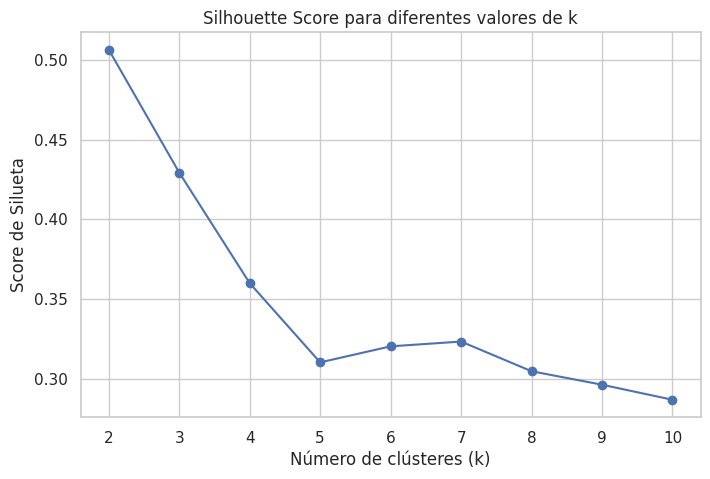

El número óptimo de clústeres es: 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Rango de valores de 'k'
k_values = range(2, 11)

# Lista para almacenar los scores de silueta para cada 'k'
silhouette_scores = []

# Probar diferentes valores de 'k'
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca_optimal_1 )
    labels = kmeans.labels_
    silhouette = silhouette_score(X_pca_optimal_1 , labels)
    silhouette_scores.append(silhouette)

# Graficar los resultados
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score para diferentes valores de k')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Score de Silueta')
plt.show()

# Identificar el 'k' con el mayor score de silueta
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"El número óptimo de clústeres es: {optimal_k}")

El coeficiente de silueta mide qué tan similar es un objeto a su propio clúster comparado con otros clústeres, por lo que un valor más alto generalmente indica un modelo de clustering más adecuado. Por lo tanto, el número de clusters sería 2.

Ahora se procede a graficar el resultado.

In [ ]:
# Aplicar K-Means con el número óptimo de clústeres encontrado
optimal_k = 2  # Reemplaza esto con el valor que encontraste como óptimo
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(X_pca_optimal_1 )
labels = kmeans.labels_

# Crear figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres, ajusta la lista de colores si tienes más de 3 clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in range(optimal_k):
    # Filtrar datos por clúster
    idx = labels == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [idx, 0], y=X_pca_optimal_1 [idx, 1], z=X_pca_optimal_1 [idx, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i+1}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Clustering K-Means sobre PCA',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Se obtienen las métricas a evaluar.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_1 , labels)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_1 , labels)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)

El promedio del índice de silueta para los clústeres es: 0.5063457969749113
El Coeficiente de Calinski-Harabasz para los clústeres es: 1750.2946624604979


Se puede apreciar que utilizar PCA, una vez más, mejora ligeramente las métricas.

### DBSCAN

Ahora se procede a utilizar métodos de clustering basados en densidad.

#### Dataset preprocesado

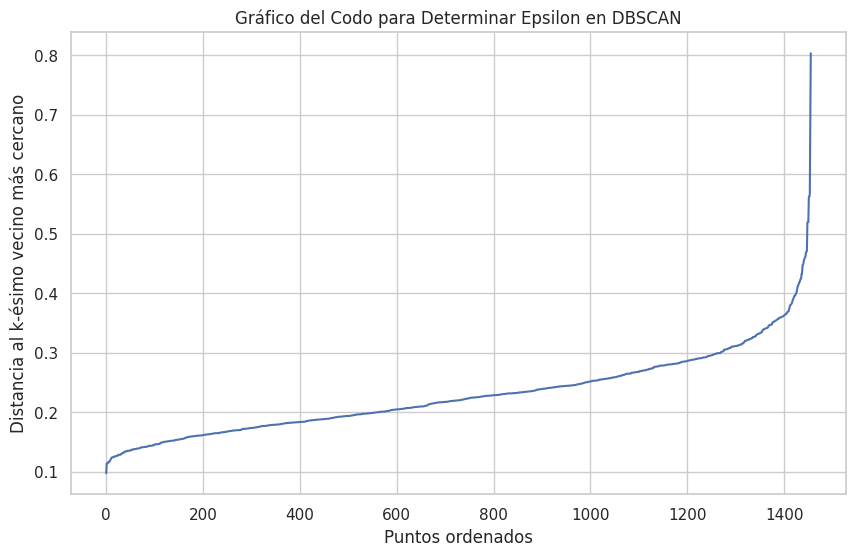

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Selecciona el número de vecinos: min_samples o min_samples+1
min_samples = 3

# Calcula las distancias al k-ésimo vecino más cercano (donde k = min_samples)
neigh = NearestNeighbors(n_neighbors=min_samples)
neigh.fit(train_p)
distances, indices = neigh.kneighbors(train_p)

# Ordena las distancias
distances = np.sort(distances[:, min_samples-1], axis=0)

# Grafica las distancias
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("Gráfico del Codo para Determinar Epsilon en DBSCAN")
plt.xlabel("Puntos ordenados")
plt.ylabel("Distancia al k-ésimo vecino más cercano")
plt.grid(True)
plt.show()


Se procederá a efectuar una evaluación de posibles valores de epsilon, que gráficamente se puede apreciar que van de 0.3 a 0.4 aproximadamente.

In [ ]:
for eps in np.arange(0.3, 0.4, 0.025):
  db = DBSCAN(eps, min_samples=min_samples).fit(train_p)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

  0.30, 6, 127
  0.33, 4, 75
  0.35, 4, 34
  0.38, 2, 22
  0.40, 2, 17


Se propone utilizar un epsilon de 0.4

In [ ]:
db = DBSCAN(eps=0.4, min_samples=min_samples).fit(train_p)
labels_db = db.labels_
labels_db

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
unique_labels = set(labels_db)
unique_labels

{-1, 0, 1}

Se grafica los resultados.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Obtener los índices de los puntos considerados ruido
outlier_indices = labels_db == -1

# Agregar los puntos de ruido al gráfico, si existen
if np.any(outlier_indices):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [outlier_indices, 0],
        y=X_pca_optimal_1 [outlier_indices, 1],
        z=X_pca_optimal_1 [outlier_indices, 2],
        mode='markers',
        marker=dict(color='black', size=3),
        name='Ruido'
    ))

# Agregar los puntos de clúster al gráfico
for i in set(labels_db):
    if i == -1:
        # Saltar los outliers ya que se agregaron por separado
        continue

    cluster_indices = labels_db == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(size=5),  # Puedes cambiar el tamaño según prefieras
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de DBSCAN en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Como se puede apreciar, se obtienen dos clusters, al igual que los anteriores métodos. Ahora se procede a evaluar las métricas.

In [ ]:
# Filtrar puntos de ruido para las métricas
labels_without_noise = labels_db[labels_db != -1]
X_without_noise = train_p[labels_db != -1]

# Calcular métricas solo si hay más de un clúster y los clústeres tienen más de un punto
if len(set(labels_without_noise)) > 1:
    # Índice de Silueta
    silhouette_avg = silhouette_score(X_without_noise, labels_without_noise)
    print("Índice de Silueta:", silhouette_avg)

    # Coeficiente de Calinski-Harabasz
    calinski_harabasz = calinski_harabasz_score(X_without_noise, labels_without_noise)
    print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)
else:
    print("No hay suficientes clústeres para calcular las métricas.")

Índice de Silueta: 0.48890846589348325
Coeficiente de Calinski-Harabasz: 1604.7072416342223


Se han obtenido métricas similares a los anteriores métodos.

#### Dataset aplicado PCA

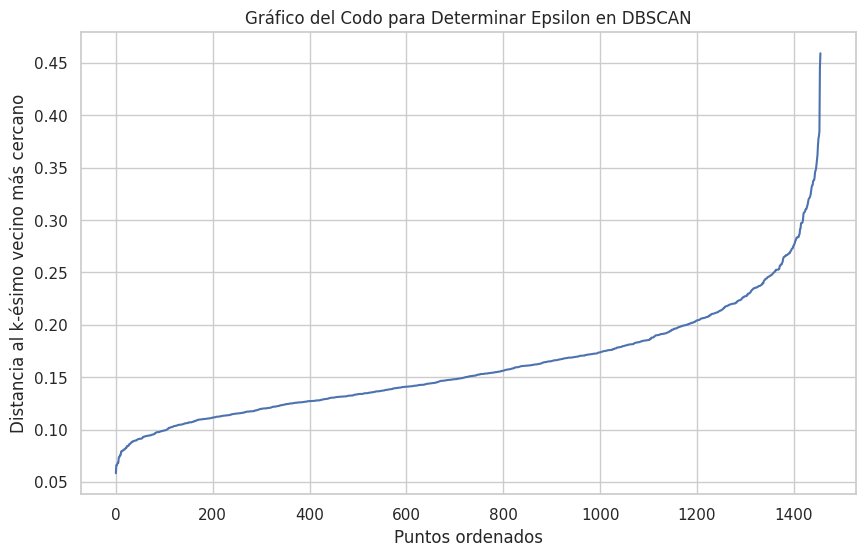

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Selecciona el número de vecinos: min_samples o min_samples+1
min_samples = 3

# Calcula las distancias al k-ésimo vecino más cercano (donde k = min_samples)
neigh = NearestNeighbors(n_neighbors=min_samples)
neigh.fit(X_pca_optimal_1)
distances, indices = neigh.kneighbors(X_pca_optimal_1)

# Ordena las distancias
distances = np.sort(distances[:, min_samples-1], axis=0)

# Grafica las distancias
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("Gráfico del Codo para Determinar Epsilon en DBSCAN")
plt.xlabel("Puntos ordenados")
plt.ylabel("Distancia al k-ésimo vecino más cercano")
plt.grid(True)
plt.show()


Se procederá a efectuar una evaluación de posibles valores de epsilon, que gráficamente se puede apreciar que van de 0.10 a 0.35 aproximadamente.

In [ ]:
for eps in np.arange(0.10, 0.35, 0.025):
  db = DBSCAN(eps, min_samples=min_samples).fit(X_pca_optimal_1)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

  0.10, 45, 1266
  0.12, 46, 946
  0.15, 43, 563
  0.17, 31, 310
  0.20, 10, 184
  0.22, 9, 115
  0.25, 3, 60
  0.27, 3, 36
  0.30, 2, 25
  0.32, 2, 13


Se propone utilizar un epsilon de 0.32

In [ ]:
db = DBSCAN(eps=0.32, min_samples=min_samples).fit(X_pca_optimal_1)
labels_db = db.labels_
labels_db

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
unique_labels = set(labels_db)
unique_labels

{-1, 0, 1}

Se grafica los resultados.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Obtener los índices de los puntos considerados ruido
outlier_indices = labels_db == -1

# Agregar los puntos de ruido al gráfico, si existen
if np.any(outlier_indices):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [outlier_indices, 0],
        y=X_pca_optimal_1 [outlier_indices, 1],
        z=X_pca_optimal_1 [outlier_indices, 2],
        mode='markers',
        marker=dict(color='black', size=3),
        name='Ruido'
    ))

# Agregar los puntos de clúster al gráfico
for i in set(labels_db):
    if i == -1:
        # Saltar los outliers ya que se agregaron por separado
        continue

    cluster_indices = labels_db == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(size=5),  # Puedes cambiar el tamaño según prefieras
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de DBSCAN en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()


Como se puede apreciar, se obtienen dos clusters, al igual que los anteriores métodos. Ahora se procede a evaluar las métricas.

In [ ]:
# Filtrar puntos de ruido para las métricas
labels_without_noise = labels_db[labels_db != -1]
X_without_noise = X_pca_optimal_1 [labels_db != -1]

# Calcular métricas solo si hay más de un clúster y los clústeres tienen más de un punto
if len(set(labels_without_noise)) > 1:
    # Índice de Silueta
    silhouette_avg = silhouette_score(X_without_noise, labels_without_noise)
    print("Índice de Silueta:", silhouette_avg)

    # Coeficiente de Calinski-Harabasz
    calinski_harabasz = calinski_harabasz_score(X_without_noise, labels_without_noise)
    print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)
else:
    print("No hay suficientes clústeres para calcular las métricas.")

Índice de Silueta: 0.5087310379081013
Coeficiente de Calinski-Harabasz: 1754.9969526725151


Se sigue manteniendo la tendencia de mejorar los parámetros al utilizar PCA.




### Gaussian Mixture Models

Ahora se probarán métodos de clustering probabilísticos. Para determinar el número óptimo de clústeres al aplicar un modelo de mezclas gaussianas se propone usar el criterio de información bayesiano (BIC) o el criterio de información de Akaike (AIC) como guías.

#### Dataset preprocesado

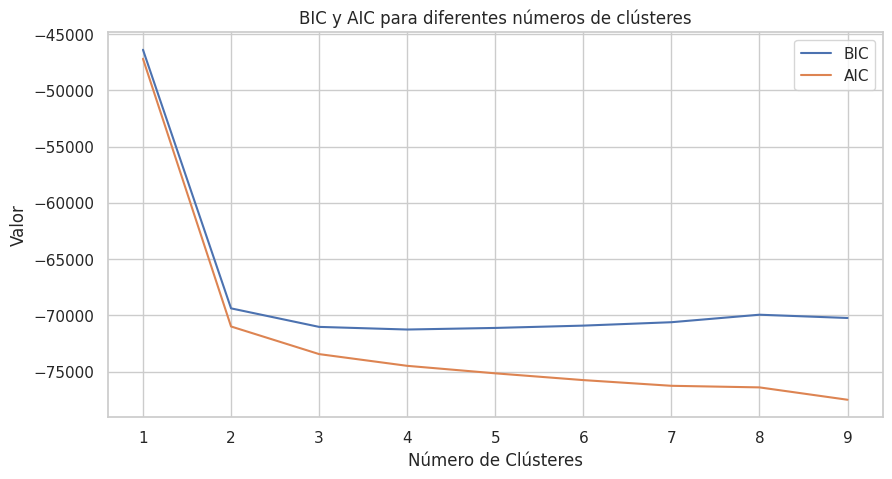

Número óptimo de clústeres según BIC: 4


In [ ]:
from sklearn.mixture import GaussianMixture

# Definir el rango de número de componentes (clústeres) a evaluar
n_components_range = range(1, 10)

# Listas para almacenar los valores de BIC y AIC para cada número de componentes
bics = []
aics = []

for n_components in n_components_range:
    # Crear y ajustar el modelo GaussianMixture
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(train_p)

    # Guardar los valores de BIC y AIC
    bics.append(gmm.bic(train_p))
    aics.append(gmm.aic(train_p))

# Graficar los valores de BIC y AIC
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bics, label='BIC')
plt.plot(n_components_range, aics, label='AIC')
plt.xlabel('Número de Clústeres')
plt.ylabel('Valor')
plt.legend()
plt.title('BIC y AIC para diferentes números de clústeres')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()

# Identificar el número óptimo de clústeres como el que tiene el menor BIC
optimal_n_clusters = n_components_range[np.argmin(bics)]
print(f'Número óptimo de clústeres según BIC: {optimal_n_clusters}')


Como se puede visualizar, según el BIC, se define usar 4 cluster, pero acorde a los anteriores métodos y resultados obtenidos, se propone contrastar con este grafico el número de cluster de 2, donde también se apreciar un punto de quiebre.

In [ ]:
# Crear y ajustar el modelo GaussianMixture
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(train_p)

GaussianMixture(n_components=2, random_state=42)

In [ ]:
labels_gm = gmm.predict(train_p)

Se grafica el resultado.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(optimal_n_clusters):
    cluster_indices = labels_gm  == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de GaussianMixture en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(train_p, labels_gm)
print("Índice de Silueta:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(train_p, labels_gm)
print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)

Índice de Silueta: 0.48608141879179395
Coeficiente de Calinski-Harabasz: 1602.4000876176171


En este caso se aprecia, que se obtuvieron métricas menores a los anteriores métodos.

#### Dataset aplicado PCA

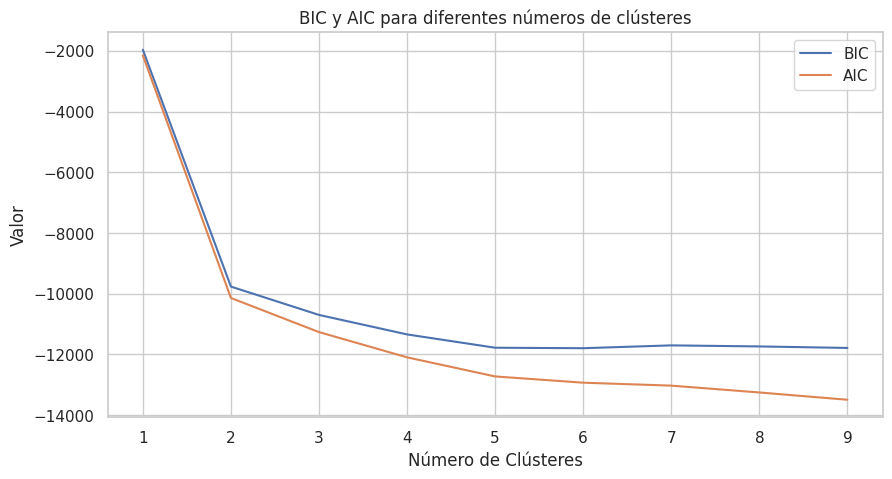

Número óptimo de clústeres según BIC: 6


In [ ]:
from sklearn.mixture import GaussianMixture

# Definir el rango de número de componentes (clústeres) a evaluar
n_components_range = range(1, 10)

# Listas para almacenar los valores de BIC y AIC para cada número de componentes
bics = []
aics = []

for n_components in n_components_range:
    # Crear y ajustar el modelo GaussianMixture
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_pca_optimal_1 )

    # Guardar los valores de BIC y AIC
    bics.append(gmm.bic(X_pca_optimal_1 ))
    aics.append(gmm.aic(X_pca_optimal_1 ))

# Graficar los valores de BIC y AIC
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bics, label='BIC')
plt.plot(n_components_range, aics, label='AIC')
plt.xlabel('Número de Clústeres')
plt.ylabel('Valor')
plt.legend()
plt.title('BIC y AIC para diferentes números de clústeres')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()

# Identificar el número óptimo de clústeres como el que tiene el menor BIC
optimal_n_clusters = n_components_range[np.argmin(bics)]
print(f'Número óptimo de clústeres según BIC: {optimal_n_clusters}')


Como se puede visualizar, según el BIC, se define usar 6 cluster, pero acorde a los anteriores métodos y resultados obtenidos, se propone contrastar con este grafico el número de cluster de 2, donde también se apreciar un punto de quiebre.

In [ ]:
# Crear y ajustar el modelo GaussianMixture
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(X_pca_optimal_1)

GaussianMixture(n_components=2, random_state=42)

In [ ]:
labels_gm = gmm.predict(X_pca_optimal_1)

Se grafica el resultado.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(optimal_n_clusters):
    cluster_indices = labels_gm  == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de GaussianMixture en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_1 , labels_gm)
print("Índice de Silueta:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_1 , labels_gm)
print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)

Índice de Silueta: 0.5063457969749113
Coeficiente de Calinski-Harabasz: 1750.2946624604979


El uso de PCA mejora las métricas.

### Clustering espacial

Se propone utilizar el Clustering Espectral, que es particularmente bueno para identificar clústeres que no son necesariamente globulares y puede manejar bien los casos en los que la estructura de los clústeres es intrincada o más compleja.

El Clustering Espectral transforma el espacio de los datos en uno donde los clústeres son más evidentes y luego aplica un método de clustering como K-Means en ese espacio transformado.

#### Dataset preprocesado

Se procederá a determinar acorde a experiencias anteriores, un número de cluster de 2.

In [ ]:
from sklearn.cluster import SpectralClustering

# Especificar el número de clústeres (n_clusters) que deseas encontrar
n_clusters = 2

# Crear y ajustar el modelo de Clustering Espectral
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels_sc = spectral.fit_predict(train_p)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Se procede a graficar.

In [ ]:
# Crear la figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(n_clusters):
    cluster_indices = labels_sc == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i}'
    ))

# Configurar el layout del gráfico
fig.update_layout(
    title='Clustering Espectral en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular métricas para evaluar la calidad del clustering
silhouette_avg = silhouette_score(train_p, labels_sc)
calinski_harabasz = calinski_harabasz_score(train_p, labels_sc)

print(f'Índice de Silueta: {silhouette_avg}')
print(f'Coeficiente de Calinski-Harabasz: {calinski_harabasz}')

Índice de Silueta: 0.48608141879179395
Coeficiente de Calinski-Harabasz: 1602.4000876176171


Se puede constatar que las métricas obtenidas, no difieren considerablemente de las ya obtenidas con los anteriores métodos.

#### Dataset aplicado PCA

Se procederá a determinar acorde a experiencias anteriores, un número de cluster de 2.

In [ ]:
from sklearn.cluster import SpectralClustering

# Especificar el número de clústeres (n_clusters) que deseas encontrar
n_clusters = 2

# Crear y ajustar el modelo de Clustering Espectral
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels_sc = spectral.fit_predict(X_pca_optimal_1)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Se procede a graficar.

In [ ]:
# Crear la figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(n_clusters):
    cluster_indices = labels_sc == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_1 [cluster_indices, 0],
        y=X_pca_optimal_1 [cluster_indices, 1],
        z=X_pca_optimal_1 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i}'
    ))

# Configurar el layout del gráfico
fig.update_layout(
    title='Clustering Espectral en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular métricas para evaluar la calidad del clustering
silhouette_avg = silhouette_score(X_pca_optimal_1, labels_sc)
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_1, labels_sc)

print(f'Índice de Silueta: {silhouette_avg}')
print(f'Coeficiente de Calinski-Harabasz: {calinski_harabasz}')

Índice de Silueta: 0.5063457969749113
Coeficiente de Calinski-Harabasz: 1750.2946624604979


Se puede constatar que PCA mejora las métricas.

### Resultados

**Índice de Silueta:**
El Índice de Silueta mide qué tan similar es un punto a su propio clúster al comparar con otros clústeres. Valores más altos indican una mejor definición de clústeres. En los resultados, el método DBSCAN con PCA muestra el índice de silueta más alto (0.5087), lo que sugiere que este método logra una mejor cohesión interna y separación entre clústeres comparado con los demás métodos.

**Coeficiente de Calinski-Harabasz:**
El Coeficiente de Calinski-Harabasz mide la dispersión entre clústeres en relación con la dispersión dentro de los clústeres. Valores más altos indican clústeres más densos y mejor separados. Nuevamente, DBSCAN con PCA presenta el valor más alto (1754.9784), lo que indica una estructura de clústeres superior en términos de su separación y cohesión.

**Elección del Mejor Método**
Acorde aestas métricas, DBSCAN con PCA se perfila como el mejor método para el conjunto de datos, ya que maximiza tanto el índice de silueta como el coeficiente de Calinski-Harabasz. Esto podría deberse a varios factores:

*   Reducción de Dimensionalidad con PCA: La aplicación de PCA antes del clustering puede haber mejorado la separación de los clústeres al eliminar ruido y reducir la dimensionalidad de los datos, concentrándose en las componentes que más varianza explican. Esto a menudo hace que las estructuras de clústeres sean más evidentes y mejor definidas.

*   Robustez de DBSCAN: DBSCAN es un método de clustering basado en densidad que puede identificar clústeres de formas arbitrarias y manejar puntos de ruido. Esto lo hace particularmente efectivo en conjuntos de datos donde los clústeres no son esféricos o cuando existe ruido en los datos.






## Dataset propuesto 2

Ahora, se propone utilizar el dataset propuesto en el que se utiliza con mayor énfasis las mediciones directras realizadas por una estación.

### PCA

Se aplica un PCA al dataset.

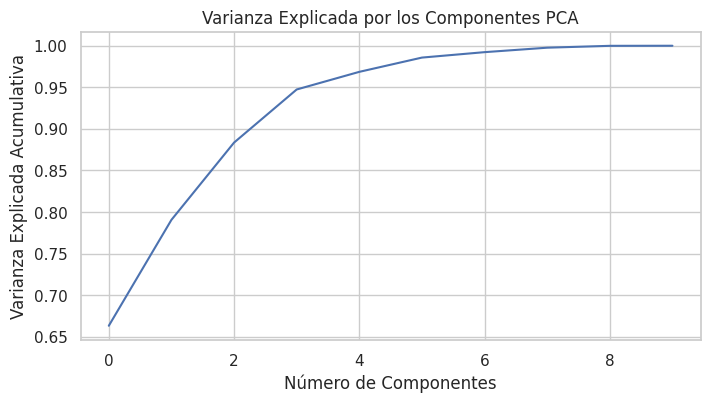

Número de componentes para explicar el 95% de la varianza: 5


In [ ]:
# Primero, determinar cuántos componentes son necesarios para explicar la varianza deseada
pca = PCA().fit(train_pp)  # No se especifica n_components para ver la varianza de todos los componentes
explained_var_ratio = pca.explained_variance_ratio_

# Calcular la varianza acumulada
explained_var_cumulative = np.cumsum(explained_var_ratio)

# Graficar la varianza explicada acumulativa para encontrar el "codo"
plt.figure(figsize=(8,4))
plt.plot(explained_var_cumulative)
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulativa')
plt.title('Varianza Explicada por los Componentes PCA')
plt.grid(True)
plt.show()

# Identificar el número de componentes para la varianza explicada deseada, por ejemplo, 0.95
n_components = np.argmax(explained_var_cumulative >= 0.95) + 1  # +1 porque los índices en Python empiezan en 0
print(f"Número de componentes para explicar el 95% de la varianza: {n_components}")

Como se puede apreciar se logra explicar el 95% de la varianza con 5 componentes principales.

In [ ]:
# Aplicar PCA con el número de componentes seleccionado
pca_optimal = PCA(n_components=n_components)
X_pca_optimal_2 = pca_optimal.fit_transform(train_pp)

Se procede a graficar

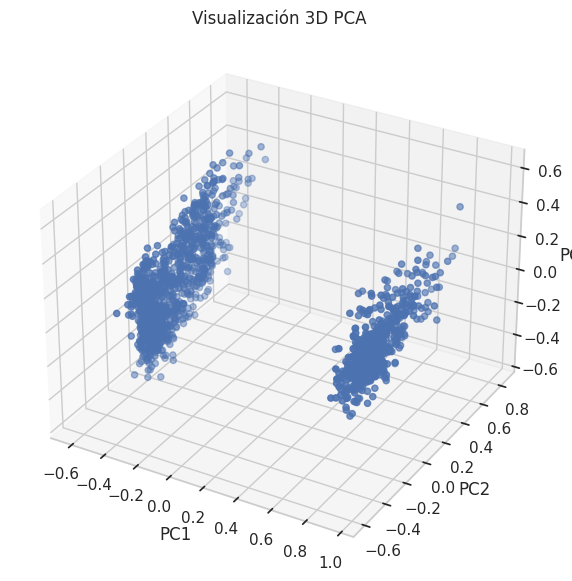

In [ ]:
# Creación de la figura para graficar
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Extracción de las componentes principales
x = X_pca_optimal_2[:, 0]
y = X_pca_optimal_2[:, 1]
z = X_pca_optimal_2[:, 2]

# Graficación
ax.scatter(x, y, z)
ax.set_title('Visualización 3D PCA')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

### Clustering jerárquico

#### Dataset preprocesado

In [ ]:
# Calcular la matriz de distancias euclidianas entre cada par de variables
matdist_4 = pdist(train_pp, 'euclidean')

In [ ]:
# Realizar clustering jerárquico
Z = linkage(matdist_4 , method= 'ward')
# Obtener etiquetas de clúster a un cierto nivel de corte, por ejemplo, formando 2 clústeres
labels = fcluster(Z, t=2, criterion='maxclust')

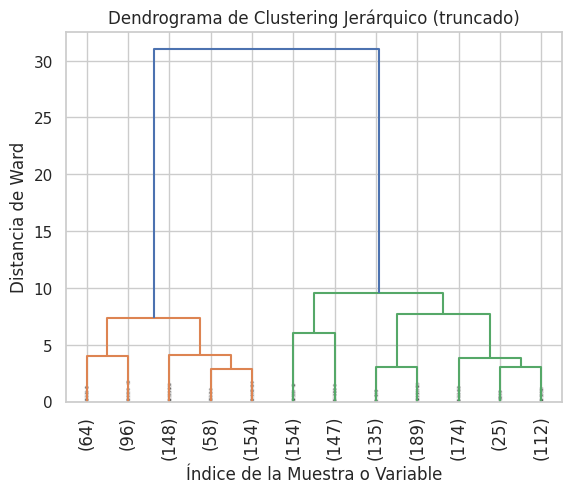

In [ ]:
# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

Se procede a sacar la métrica silhoette

In [ ]:
from sklearn.metrics import silhouette_score

# Obtener las etiquetas de clúster para los datos.
from scipy.cluster.hierarchy import fcluster
# Definir el número de clusters, se elige que sean 2 clusters
k = 2
clusters = fcluster(Z, k, criterion='maxclust')

# Calcular el índice de silueta
silhouette_avg = silhouette_score(train_pp, clusters)
print("Para n_clusters =", k, "El promedio del índice de silueta es:", silhouette_avg)

Para n_clusters = 2 El promedio del índice de silueta es: 0.588058296242132


Un índice de silueta de aproximadamente 0.588 y sugiere que, en promedio, los puntos están moderadamente bien asignados a sus respectivos clústeres. Esto significa que hay una buena separación entre los dos clústeres y que los puntos dentro de cada clúster tienden a estar más cerca entre sí que de los puntos en el otro clúster.


In [ ]:
# Calcular el Coeficiente de Calinski-Harabasz
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz = calinski_harabasz_score(train_pp, clusters)

print("Para n_clusters =", k, "el Coeficiente de Calinski-Harabasz es:", calinski_harabasz)

Para n_clusters = 2 el Coeficiente de Calinski-Harabasz es: 2753.000860509623


Un Coeficiente de Calinski-Harabasz de aproximadamente 2753 para dos clústeres indica que la separación entre los clústeres es relativamente buena en comparación con la cohesión dentro de los clústeres.

Se procede a graficar

In [ ]:
import plotly.graph_objects as go

# Crear una figura interactiva 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

# Agregar los puntos del PCA al gráfico, coloreados por etiquetas de clúster
for i in range(k):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[clusters== i+1, 0],
        y=X_pca_optimal_2[clusters == i+1, 1],
        z=X_pca_optimal_2[clusters == i+1, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)]),
        name=f'Cluster {i+1}'
    ))

# Configurar los títulos de los ejes y el título del gráfico
fig.update_layout(
    title='Clustering Jerárquico sobre PCA (Interactivo)',
    scene = dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

De esta manera se puede apreciar que exisetn dos clusters marcados.

#### Dataset aplicado PCA

Ahora se procede utilizar el PCA como input.

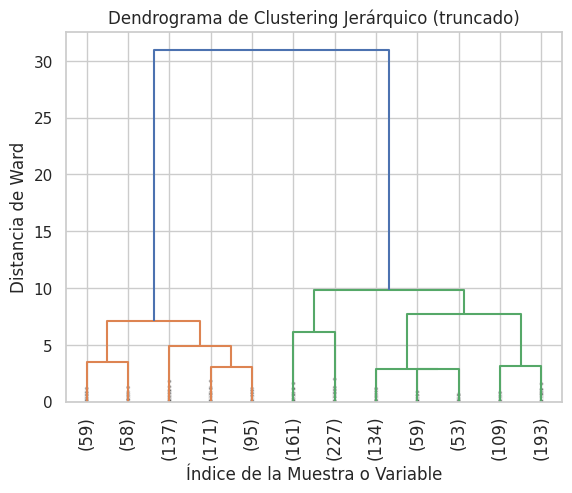

In [ ]:
Z = linkage(X_pca_optimal_2, method='ward')

# Quedarsecon las últimas p uniones
plt.title('Dendrograma de Clustering Jerárquico (truncado)')
plt.xlabel('Índice de la Muestra o Variable')
plt.ylabel('Distancia de Ward')
dendrogram(
    Z,
    truncate_mode='lastp',  # mostrar solo las últimas p uniones
    p=12,  # definir p
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

In [ ]:
# Obtener las etiquetas
k = 2  # Número deseado de clústeres
cluster_labels = fcluster(Z, k, criterion='maxclust')

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_2, cluster_labels)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_2, cluster_labels)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)

El promedio del índice de silueta para los clústeres es: 0.6072616646785043
El Coeficiente de Calinski-Harabasz para los clústeres es: 3027.682582220314


In [ ]:
# Crear un gráfico 3D interactivo con Plotly
fig = go.Figure()

# Colores para los clústeres, ajusta la cantidad de colores según tus clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in set(cluster_labels):
    # Filtrar datos por etiqueta de clúster
    idx = cluster_labels == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[idx, 0],
        y=X_pca_optimal_2[idx, 1],
        z=X_pca_optimal_2[idx, 2],
        mode='markers',
        marker=dict(size=5, color=colors[i % len(colors)]),  # Ajusta el tamaño y color del marcador
        name=f'Cluster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=0),
    scene=dict(
        xaxis=dict(title='PC1'),
        yaxis=dict(title='PC2'),
        zaxis=dict(title='PC3'),
    )
)

# Mostrar el gráfico
fig.show()

Como podemos apreciar, el utilizar PCA como input del modelo, mejora ligeramente las métricas utilizadas para evaluar los modelos.

### K-means

Ahora se procede a probar algoritmos de clustering basados en particiones.

#### Dataset preprocesado

Se procede a evaluar el número óptimo de clusters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

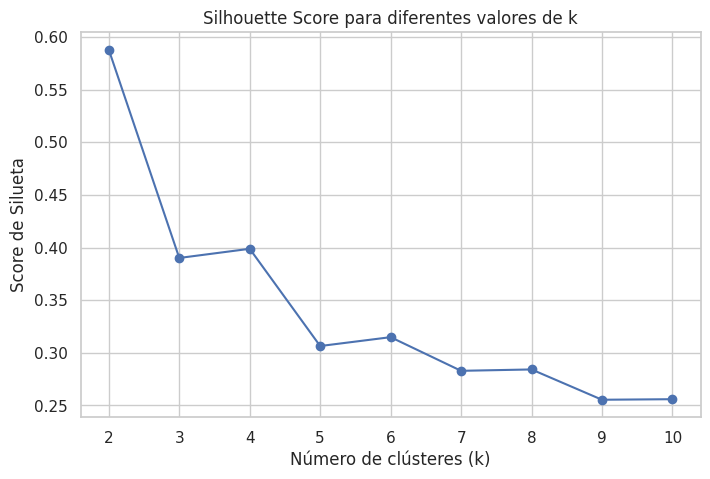

El número óptimo de clústeres es: 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Rango de valores de 'k'
k_values = range(2, 11)

# Lista para almacenar los scores de silueta para cada 'k'
silhouette_scores = []

# Probar diferentes valores de 'k'
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(train_pp)
    labels = kmeans.labels_
    silhouette = silhouette_score(train_pp, labels)
    silhouette_scores.append(silhouette)

# Graficar los resultados
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score para diferentes valores de k')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Score de Silueta')
plt.show()

# Identificar el 'k' con el mayor score de silueta
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"El número óptimo de clústeres es: {optimal_k}")

El coeficiente de silueta mide qué tan similar es un objeto a su propio clúster comparado con otros clústeres, por lo que un valor más alto generalmente indica un modelo de clustering más adecuado. Por lo tanto, el número de clusters sería 2.

Ahora se procede a graficar el resultado.

In [ ]:
# Aplicar K-Means con el número óptimo de clústeres encontrado
optimal_k = 2  # Reemplaza esto con el valor que encontraste como óptimo
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(train_pp)
labels = kmeans.labels_

# Crear figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres, ajusta la lista de colores si tienes más de 3 clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in range(optimal_k):
    # Filtrar datos por clúster
    idx = labels == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[idx, 0], y=X_pca_optimal_2[idx, 1], z=X_pca_optimal_2[idx, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i+1}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Clustering K-Means sobre PCA',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Se obtienen las métricas a evaluar.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(train_pp, labels)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(train_pp, labels)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)


El promedio del índice de silueta para los clústeres es: 0.588058296242132
El Coeficiente de Calinski-Harabasz para los clústeres es: 2753.000860509623


Un índice de silueta de aproximadamente 0.588 y sugiere que, en promedio, los puntos están moderadamente bien asignados a sus respectivos clústeres. Esto significa que hay una buena separación entre los dos clústeres y que los puntos dentro de cada clúster tienden a estar más cerca entre sí que de los puntos en el otro clúster.


Coeficiente de Calinski-Harabasz de 2753: Este valor es relativamente alto, lo que indica que los clústeres son densos y bien separados entre sí. Este coeficiente mide tanto la dispersión dentro de los clústeres como la dispersión entre clústeres, y un valor más alto sugiere que los clústeres están bien definidos. No hay un valor máximo para este coeficiente, y su interpretación depende en parte del contexto de los datos y de comparaciones con otros modelos de clustering aplicados a los mismos datos.

#### Dataset aplicado PCA

Se procede a evaluar el número óptimo de clusters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

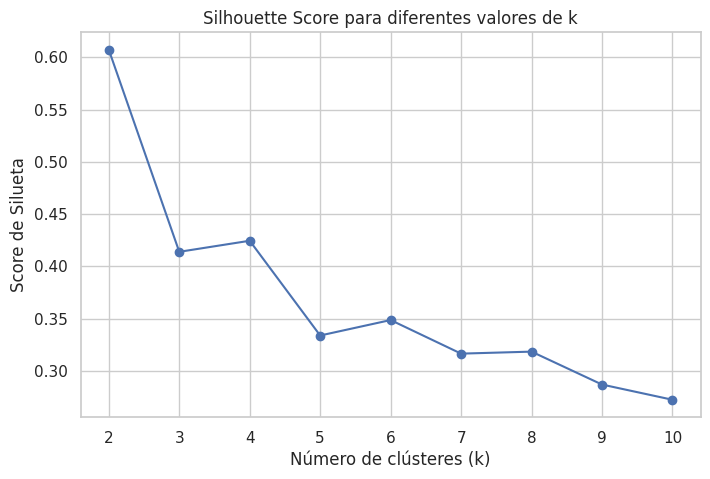

El número óptimo de clústeres es: 2


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Rango de valores de 'k'
k_values = range(2, 11)

# Lista para almacenar los scores de silueta para cada 'k'
silhouette_scores = []

# Probar diferentes valores de 'k'
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca_optimal_2)
    labels = kmeans.labels_
    silhouette = silhouette_score(X_pca_optimal_2, labels)
    silhouette_scores.append(silhouette)

# Graficar los resultados
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Score para diferentes valores de k')
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Score de Silueta')
plt.show()

# Identificar el 'k' con el mayor score de silueta
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"El número óptimo de clústeres es: {optimal_k}")

El coeficiente de silueta mide qué tan similar es un objeto a su propio clúster comparado con otros clústeres, por lo que un valor más alto generalmente indica un modelo de clustering más adecuado. Por lo tanto, el número de clusters sería 2.

Ahora se procede a graficar el resultado.

In [ ]:
# Aplicar K-Means con el número óptimo de clústeres encontrado
optimal_k = 2  # Reemplaza esto con el valor que encontraste como óptimo
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans.fit(X_pca_optimal_2)
labels = kmeans.labels_

# Crear figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres, ajusta la lista de colores si tienes más de 3 clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

for i in range(optimal_k):
    # Filtrar datos por clúster
    idx = labels == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[idx, 0], y=X_pca_optimal_2[idx, 1], z=X_pca_optimal_2[idx, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i+1}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Clustering K-Means sobre PCA',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Se obtienen las métricas a evaluar.

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_2, labels)
print("El promedio del índice de silueta para los clústeres es:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_2, labels)
print("El Coeficiente de Calinski-Harabasz para los clústeres es:", calinski_harabasz)

El promedio del índice de silueta para los clústeres es: 0.6072616646785043
El Coeficiente de Calinski-Harabasz para los clústeres es: 3027.682582220314


Se puede apreciar que utilizar PCA, una vez más, mejora ligeramente las métricas.

### DBSCAN

Ahora se procede a utilizar métodos de clustering basados en densidad.

#### Dataset preprocesado

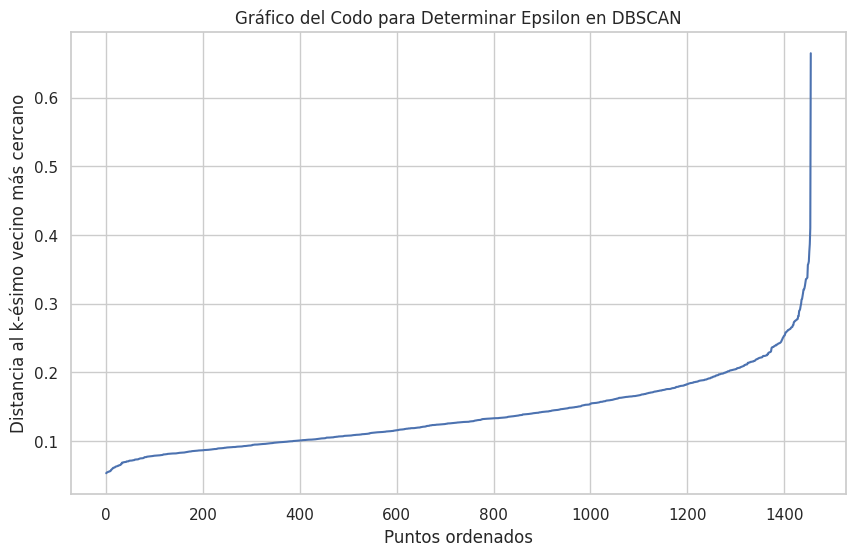

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Selecciona el número de vecinos: min_samples o min_samples+1
min_samples = 3

# Calcula las distancias al k-ésimo vecino más cercano (donde k = min_samples)
neigh = NearestNeighbors(n_neighbors=min_samples)
neigh.fit(train_pp)
distances, indices = neigh.kneighbors(train_pp)

# Ordena las distancias
distances = np.sort(distances[:, min_samples-1], axis=0)

# Grafica las distancias
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("Gráfico del Codo para Determinar Epsilon en DBSCAN")
plt.xlabel("Puntos ordenados")
plt.ylabel("Distancia al k-ésimo vecino más cercano")
plt.grid(True)
plt.show()


Se procederá a efectuar una evaluación de posibles valores de epsilon, que gráficamente se puede apreciar que van de 0.2 a 0.4 aproximadamente.

In [ ]:
for eps in np.arange(0.2, 0.4, 0.025):
  db = DBSCAN(eps, min_samples=min_samples).fit(train_pp)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

  0.20, 5, 113
  0.23, 4, 62
  0.25, 2, 40
  0.28, 2, 19
  0.30, 2, 14
  0.32, 2, 6
  0.35, 2, 5
  0.38, 2, 1


Se propone utilizar un epsilon de 0.38

In [ ]:
db = DBSCAN(eps=0.38, min_samples=min_samples).fit(train_pp)
labels_db = db.labels_
labels_db

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
unique_labels = set(labels_db)
unique_labels

{-1, 0, 1}

Se grafica los resultados.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Obtener los índices de los puntos considerados ruido
outlier_indices = labels_db == -1

# Agregar los puntos de ruido al gráfico, si existen
if np.any(outlier_indices):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[outlier_indices, 0],
        y=X_pca_optimal_2[outlier_indices, 1],
        z=X_pca_optimal_2[outlier_indices, 2],
        mode='markers',
        marker=dict(color='black', size=3),
        name='Ruido'
    ))

# Agregar los puntos de clúster al gráfico
for i in set(labels_db):
    if i == -1:
        # Saltar los outliers ya que se agregaron por separado
        continue

    cluster_indices = labels_db == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[cluster_indices, 0],
        y=X_pca_optimal_2[cluster_indices, 1],
        z=X_pca_optimal_2[cluster_indices, 2],
        mode='markers',
        marker=dict(size=5),  # Puedes cambiar el tamaño según prefieras
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de DBSCAN en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()


Como se puede apreciar, se obtienen dos clusters, al igual que los anteriores métodos. Ahora se procede a evaluar las métricas.

In [ ]:
# Filtrar puntos de ruido para las métricas
labels_without_noise = labels_db[labels_db != -1]
X_without_noise = train_pp[labels_db != -1]

# Calcular métricas solo si hay más de un clúster y los clústeres tienen más de un punto
if len(set(labels_without_noise)) > 1:
    # Índice de Silueta
    silhouette_avg = silhouette_score(X_without_noise, labels_without_noise)
    print("Índice de Silueta:", silhouette_avg)

    # Coeficiente de Calinski-Harabasz
    calinski_harabasz = calinski_harabasz_score(X_without_noise, labels_without_noise)
    print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)
else:
    print("No hay suficientes clústeres para calcular las métricas.")

Índice de Silueta: 0.5885035236981254
Coeficiente de Calinski-Harabasz: 2762.025146623009


Se han obtenido métricas similares a los anteriores métodos.

#### Dataset aplicado PCA

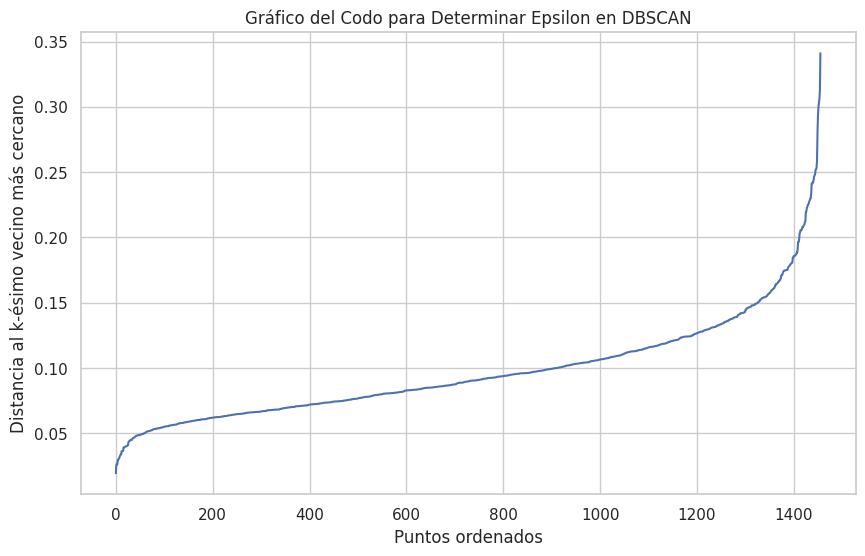

In [ ]:
from sklearn.neighbors import NearestNeighbors

# Selecciona el número de vecinos: min_samples o min_samples+1
min_samples = 3

# Calcula las distancias al k-ésimo vecino más cercano (donde k = min_samples)
neigh = NearestNeighbors(n_neighbors=min_samples)
neigh.fit(X_pca_optimal_2)
distances, indices = neigh.kneighbors(X_pca_optimal_2)

# Ordena las distancias
distances = np.sort(distances[:, min_samples-1], axis=0)

# Grafica las distancias
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title("Gráfico del Codo para Determinar Epsilon en DBSCAN")
plt.xlabel("Puntos ordenados")
plt.ylabel("Distancia al k-ésimo vecino más cercano")
plt.grid(True)
plt.show()


Se procederá a efectuar una evaluación de posibles valores de epsilon, que gráficamente se puede apreciar que van de 0.10 a 0.30 aproximadamente.

In [ ]:
for eps in np.arange(0.10, 0.30, 0.025):
  db = DBSCAN(eps, min_samples=min_samples).fit(X_pca_optimal_2)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.2f, %d, %d" % (eps, n_clusters_, n_outliers))

  0.10, 41, 409
  0.12, 19, 186
  0.15, 6, 91
  0.17, 3, 42
  0.20, 2, 28
  0.22, 2, 16
  0.25, 3, 5
  0.27, 2, 2


Se propone utilizar un epsilon de 0.27

In [ ]:
db = DBSCAN(eps=0.27, min_samples=min_samples).fit(X_pca_optimal_2)
labels_db = db.labels_
labels_db

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
unique_labels = set(labels_db)
unique_labels

{-1, 0, 1}

Se grafica los resultados.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Obtener los índices de los puntos considerados ruido
outlier_indices = labels_db == -1

# Agregar los puntos de ruido al gráfico, si existen
if np.any(outlier_indices):
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[outlier_indices, 0],
        y=X_pca_optimal_2[outlier_indices, 1],
        z=X_pca_optimal_2[outlier_indices, 2],
        mode='markers',
        marker=dict(color='black', size=3),
        name='Ruido'
    ))

# Agregar los puntos de clúster al gráfico
for i in set(labels_db):
    if i == -1:
        # Saltar los outliers ya que se agregaron por separado
        continue

    cluster_indices = labels_db == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[cluster_indices, 0],
        y=X_pca_optimal_2[cluster_indices, 1],
        z=X_pca_optimal_2[cluster_indices, 2],
        mode='markers',
        marker=dict(size=5),  # Puedes cambiar el tamaño según prefieras
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de DBSCAN en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()


Como se puede apreciar, se obtienen dos clusters, al igual que los anteriores métodos. Ahora se procede a evaluar las métricas.

In [ ]:
# Filtrar puntos de ruido para las métricas
labels_without_noise = labels_db[labels_db != -1]
X_without_noise = X_pca_optimal_2[labels_db != -1]

# Calcular métricas solo si hay más de un clúster y los clústeres tienen más de un punto
if len(set(labels_without_noise)) > 1:
    # Índice de Silueta
    silhouette_avg = silhouette_score(X_without_noise, labels_without_noise)
    print("Índice de Silueta:", silhouette_avg)

    # Coeficiente de Calinski-Harabasz
    calinski_harabasz = calinski_harabasz_score(X_without_noise, labels_without_noise)
    print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)
else:
    print("No hay suficientes clústeres para calcular las métricas.")

Índice de Silueta: 0.6084615526579185
Coeficiente de Calinski-Harabasz: 3045.0880899342055


Se sigue manteniendo la tendencia de mejorar los parámetros al utilizar PCA.




### Gaussian Mixture Models

Ahora se probarán métodos de clustering probabilísticos. Para determinar el número óptimo de clústeres al aplicar un modelo de mezclas gaussianas se propone usar el criterio de información bayesiano (BIC) o el criterio de información de Akaike (AIC) como guías.

#### Dataset preprocesado

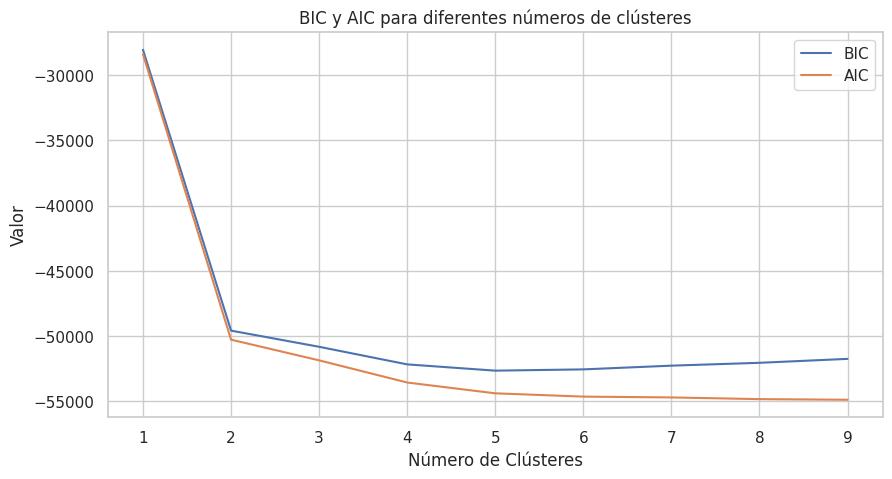

Número óptimo de clústeres según BIC: 5


In [ ]:
from sklearn.mixture import GaussianMixture

# Definir el rango de número de componentes (clústeres) a evaluar
n_components_range = range(1, 10)

# Listas para almacenar los valores de BIC y AIC para cada número de componentes
bics = []
aics = []

for n_components in n_components_range:
    # Crear y ajustar el modelo GaussianMixture
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(train_pp)

    # Guardar los valores de BIC y AIC
    bics.append(gmm.bic(train_pp))
    aics.append(gmm.aic(train_pp))

# Graficar los valores de BIC y AIC
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bics, label='BIC')
plt.plot(n_components_range, aics, label='AIC')
plt.xlabel('Número de Clústeres')
plt.ylabel('Valor')
plt.legend()
plt.title('BIC y AIC para diferentes números de clústeres')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()

# Identificar el número óptimo de clústeres como el que tiene el menor BIC
optimal_n_clusters = n_components_range[np.argmin(bics)]
print(f'Número óptimo de clústeres según BIC: {optimal_n_clusters}')


Como se puede visualizar, según el BIC, se define usar 5 cluster, pero acorde a los anteriores métodos y resultados obtenidos, se propone contrastar con este grafico el número de cluster de 2, donde también se apreciar un punto de quiebre.

In [ ]:
# Crear y ajustar el modelo GaussianMixture
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(train_pp)

GaussianMixture(n_components=2, random_state=42)

In [ ]:
labels_gm = gmm.predict(train_pp)

Se grafica el resultado.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(optimal_n_clusters):
    cluster_indices = labels_gm  == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[cluster_indices, 0],
        y=X_pca_optimal_2[cluster_indices, 1],
        z=X_pca_optimal_2[cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de GaussianMixture en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(train_pp, labels_gm)
print("Índice de Silueta:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(train_pp, labels_gm)
print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)

Índice de Silueta: 0.588058296242132
Coeficiente de Calinski-Harabasz: 2753.000860509623


En este caso se aprecia, que se obtuvieron métricas menores a los anteriores métodos.

#### Dataset aplicado PCA

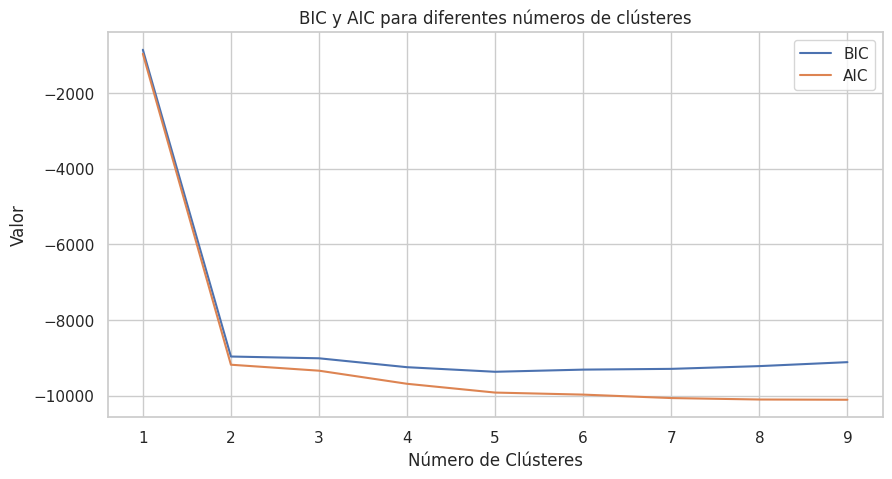

Número óptimo de clústeres según BIC: 5


In [ ]:
from sklearn.mixture import GaussianMixture

# Definir el rango de número de componentes (clústeres) a evaluar
n_components_range = range(1, 10)

# Listas para almacenar los valores de BIC y AIC para cada número de componentes
bics = []
aics = []

for n_components in n_components_range:
    # Crear y ajustar el modelo GaussianMixture
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_pca_optimal_2)

    # Guardar los valores de BIC y AIC
    bics.append(gmm.bic(X_pca_optimal_2))
    aics.append(gmm.aic(X_pca_optimal_2))

# Graficar los valores de BIC y AIC
plt.figure(figsize=(10, 5))
plt.plot(n_components_range, bics, label='BIC')
plt.plot(n_components_range, aics, label='AIC')
plt.xlabel('Número de Clústeres')
plt.ylabel('Valor')
plt.legend()
plt.title('BIC y AIC para diferentes números de clústeres')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()

# Identificar el número óptimo de clústeres como el que tiene el menor BIC
optimal_n_clusters = n_components_range[np.argmin(bics)]
print(f'Número óptimo de clústeres según BIC: {optimal_n_clusters}')


Como se puede visualizar, según el BIC, se define usar 5 cluster, pero acorde a los anteriores métodos y resultados obtenidos, se propone contrastar con este grafico el número de cluster de 2, donde también se apreciar un punto de quiebre.

In [ ]:
# Crear y ajustar el modelo GaussianMixture
gmm = GaussianMixture(n_components=2, random_state=42)
gmm.fit(X_pca_optimal_2)

GaussianMixture(n_components=2, random_state=42)

In [ ]:
labels_gm = gmm.predict(X_pca_optimal_2)

Se grafica el resultado.

In [ ]:
# Crear una figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(optimal_n_clusters):
    cluster_indices = labels_gm  == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2[cluster_indices, 0],
        y=X_pca_optimal_2[cluster_indices, 1],
        z=X_pca_optimal_2[cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Clúster {i}'
    ))

# Actualizar los títulos de los ejes y el gráfico
fig.update_layout(
    title='Resultados de GaussianMixture en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular el Índice de Silueta
silhouette_avg = silhouette_score(X_pca_optimal_2, labels_gm)
print("Índice de Silueta:", silhouette_avg)

# Calcular el Coeficiente de Calinski-Harabasz
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_2, labels_gm)
print("Coeficiente de Calinski-Harabasz:", calinski_harabasz)

Índice de Silueta: 0.6072616646785043
Coeficiente de Calinski-Harabasz: 3027.682582220314


El uso de PCA mejora las métricas.

### Clustering espacial

#### Dataset preprocesado

Se procederá a determinar acorde a experiencias anteriores, un número de cluster de 2.

In [ ]:
from sklearn.cluster import SpectralClustering

# Especificar el número de clústeres (n_clusters) que deseas encontrar
n_clusters = 2

# Crear y ajustar el modelo de Clustering Espectral
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels_sc = spectral.fit_predict(train_pp)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Se procede a graficar.

In [ ]:
# Crear la figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(n_clusters):
    cluster_indices = labels_sc == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2 [cluster_indices, 0],
        y=X_pca_optimal_2 [cluster_indices, 1],
        z=X_pca_optimal_2 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i}'
    ))

# Configurar el layout del gráfico
fig.update_layout(
    title='Clustering Espectral en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular métricas para evaluar la calidad del clustering
silhouette_avg = silhouette_score(train_pp, labels_sc)
calinski_harabasz = calinski_harabasz_score(train_pp, labels_sc)

print(f'Índice de Silueta: {silhouette_avg}')
print(f'Coeficiente de Calinski-Harabasz: {calinski_harabasz}')

Índice de Silueta: 0.588058296242132
Coeficiente de Calinski-Harabasz: 2753.000860509623


Se puede constatar que las métricas obtenidas, no difieren considerablemente de las ya obtenidas con los anteriores métodos.

#### Dataset aplicado PCA

Se procederá a determinar acorde a experiencias anteriores, un número de cluster de 2.

In [ ]:
from sklearn.cluster import SpectralClustering

# Especificar el número de clústeres (n_clusters) que deseas encontrar
n_clusters = 2

# Crear y ajustar el modelo de Clustering Espectral
spectral = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=42)
labels_sc = spectral.fit_predict(X_pca_optimal_2)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



Se procede a graficar.

In [ ]:
# Crear la figura para el gráfico 3D
fig = go.Figure()

# Colores para los clústeres
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange']

# Agregar los puntos de clúster al gráfico
for i in range(n_clusters):
    cluster_indices = labels_sc == i
    fig.add_trace(go.Scatter3d(
        x=X_pca_optimal_2 [cluster_indices, 0],
        y=X_pca_optimal_2 [cluster_indices, 1],
        z=X_pca_optimal_2 [cluster_indices, 2],
        mode='markers',
        marker=dict(color=colors[i % len(colors)], size=5),
        name=f'Cluster {i}'
    ))

# Configurar el layout del gráfico
fig.update_layout(
    title='Clustering Espectral en 3D',
    scene=dict(
        xaxis_title='Componente Principal 1',
        yaxis_title='Componente Principal 2',
        zaxis_title='Componente Principal 3'
    )
)

# Mostrar el gráfico
fig.show()

Se obtienen las métricas.

In [ ]:
# Calcular métricas para evaluar la calidad del clustering
silhouette_avg = silhouette_score(X_pca_optimal_2, labels_sc)
calinski_harabasz = calinski_harabasz_score(X_pca_optimal_2, labels_sc)

print(f'Índice de Silueta: {silhouette_avg}')
print(f'Coeficiente de Calinski-Harabasz: {calinski_harabasz}')

Índice de Silueta: 0.6072616646785043
Coeficiente de Calinski-Harabasz: 3027.682582220314


Se puede constatar que PCA mejora las métricas.

### Resultados


El DBSCAN con PCA presenta los valores más altos tanto para el índice de silueta (0.6085) como para el coeficiente de Calinski-Harabasz (3044.9909), lo que indica que este enfoque ha logrado la mejor separación y cohesión de clústeres comparado con los otros métodos y configuraciones probados.

Las principales razones pueden ser:


*   Reducción de Dimensionalidad: La mejora observada al aplicar PCA sugiere que la reducción de dimensionalidad ha eliminado ruido y características irrelevantes de los datos, lo que permite que los algoritmos de clustering identifiquen más claramente las agrupaciones naturales.
*   DBSCAN: Este algoritmo es particularmente bueno para identificar clústeres de formas arbitrarias y para manejar outliers, lo cual podría ser especialmente beneficioso en conjuntos de datos complejos o con ruido. La combinación de DBSCAN con PCA parece haber capitalizado efectivamente estas ventajas.

## Resultado final

El mejor resultado en cuanto a las métricas obtenidas, fue DBSCAN con PCA, cabe recalcar que el dataset que finalmente fue de mejor funcionamiento es el que posee datos satelitales, además de que considera únicamente una variable temporal.

---
# Conclusiones
---



*   En primer lugar, se destaca que acorde a la naturaleza de los datos, en el preprocesado, se obtuvieron mejores resultados al aplicar una estandarización con el método MinMaxScaler que con RobustScaler, lo que permite inferir que los valores atípicos no son significativos, además de que acorde a Liu et al. (2023), valores máximos y mínimos pueden dar indiciones de la presencia o ausencia del dengue.

*   Al evaluar la propuesta de comparar la factibilidad de utilizar la mayoría de variables de las dos fuentes (satélite y estación), se pudo apreciar que da mejor resultado tener en cuenta solo las variables provistas por el satélite, debido a la completitud de los datos, además de su manera de obteción a través de modelos.

*   La anterior conclusión entra en debate al obtener un resultado distinto al esperado, pues se pensaba que mediciones directas, como las de una estación terrestre darían mejores resultados, pero esto puede tener como consecuencia la falta de completitud de los datos, pues existían mayor número de valores a imputar, lo que indica que pueden existir fallos en la captación de datos.

*  Como se mencionó, el uso de un dataset que considera únicamente variables satelitales, además de incluir solo una variable temporal, dio mejores resutlados, de manera que, el método DBSCAN obtuvo las mejores métricas.

*   Se recomienda utilizar DBSCAN con la aplicación de PCA al dataset de las variables que incluyen mayoritariamente datos satelitales. Debido a que este algoritmo es particularmente bueno para identificar clústeres de formas arbitrarias y para manejar outliers






---
# Bibliografía
---

Islam, Md. Aminul & Hasan, Mohammad & Tiwari, Ananda & Raju, Md Abdul & Jannat, Fateha & Sangkham, Sarawut & Shammas, Mahaad & Sharma, Prabhakar & Bhattacharya, Prosun & Kumar, Manish. (2023). Correlation of Dengue and Meteorological Factors in Bangladesh: A Public Health Concern. International Journal of Environmental Research and Public Health. 20. 5152. 10.3390/ijerph20065152.

Liu, Z., Zhang, Q., Li, L., He, J., Guo, J., Wang, Z., ... & Li, T. (2023). The effect of temperature on dengue virus transmission by Aedes mosquitoes. Frontiers in cellular and infection microbiology, 13.